**Identifying features that influence low-income student success**

by Ben Lacar
<br>
March 2019

Next:'
- re-assess correlated features, apply VIF (if greater than 10 then remove)
- update based on feedback


other technical checks:
- try both random forest and linear/ridge regression (add further explanation on RF) - Shagayegh
- apply k-fold cross-validation

Nice to have (later)
- Geospatial data
- Updated census info
- investigate relationship of demographics to COVID cases ([data from NYTimes](https://github.com/nytimes/covid-19-data))

## Evaluation with linear models

This notebook is an extension of data obtained previously and described in other notebooks. This starts from a saved .csv and evaluates features with linear models. Another notebook describes feature importance with tree-based models.

In [1]:
# Import packages

# Web scraping
import os
import urllib.request
import requests
from io import StringIO
from bs4 import BeautifulSoup

# Use xml package for GreatSchools data
import xml.etree.ElementTree as ET

# Dataframe munging and statistics
import re
import pandas as pd
import numpy as np
from scipy.stats import ttest_ind

# Data visualization
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns

%matplotlib inline

# Unsupervised learning
from sklearn.decomposition import PCA

# Linear regression
from sklearn import datasets, linear_model
from sklearn.metrics import mean_squared_error, r2_score
from sklearn import metrics
from sklearn.model_selection import train_test_split

# classification approaches
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn import metrics
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report

# Stats
from scipy.stats import mannwhitneyu
from scipy.stats import ttest_ind
import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.stats import multitest

In [2]:
# Colors and formatting
# Got Google theme html colors from here https://imagecolorpicker.com
B_beige = "#CDA577"
B_brown = "#643E34"
B_slate = "#3F5B66"
B_dkgray = "#5A7E8E"
B_ltgray = "#6D949B"
B_green = "#01CB8B"
B_lime = "#D3F04A"

B_colors = [B_beige, B_brown, B_slate, B_dkgray, B_ltgray, B_green, B_lime]
B_colors_cat = [B_beige, B_green, B_brown, B_ltgray, B_slate, B_lime, B_dkgray]

# Code formatting Jupyter black
%load_ext nb_black

<IPython.core.display.Javascript object>

In [3]:
parent_path = "/Users/lacar/Documents/Data_science/Jupyter_notebooks/Education_study/"
os.chdir(parent_path)
os.getcwd()

'/Users/lacar/Documents/Data_science/Jupyter_notebooks/Education_study'

<IPython.core.display.Javascript object>

### Read in acquired data

In [4]:
# df_state_info_gs_census = pd.read_csv('df_state_info_gs_census_ALL.csv', index_col=0)
df_state_info_gs_census = pd.read_csv(
    "~/Documents/Goals_and_careers/Edu_Data_Science/Insight/edu_project_for_interview/df_state_info_gs_census_ALL.csv"
)

<IPython.core.display.Javascript object>

In [5]:
print("Dimensions of dataframe after data merging:\n", df_state_info_gs_census.shape)

Dimensions of dataframe after data merging:
 (1152, 218)


<IPython.core.display.Javascript object>

In [9]:
[print(i) for i in df_state_info_gs_census.columns]

Unnamed: 0
CDSCode
NCESDist
NCESSchool
StatusType
County
District
School
Street
StreetAbr
City
Zip
State
MailStreet
MailStrAbr
MailCity
MailZip
MailState
Phone
Ext
WebSite
OpenDate
ClosedDate
Charter
CharterNum
FundingType
DOC
DOCType
SOC
SOCType
EdOpsCode
EdOpsName
EILCode
EILName
GSoffered
GSserved
Virtual
Magnet
YearRoundYN
FederalDFCDistrictID
Latitude
Longitude
AdmFName1
AdmLName1
AdmEmail1
AdmFName2
AdmLName2
AdmEmail2
AdmFName3
AdmLName3
AdmEmail3
LastUpDate
zip_code
gsId
name
type
gradeRange
enrollment
gsRating
parentRating
city
state
districtId
district
districtNCESId
address
phone
fax
website
ncesId
lat
lon
overviewLink
ratingsLink
reviewsLink
schoolStatsLink
college_readiness
test_scores
advanced_courses
equity_overview
race_ethnicity
low_income
disabilities
students_per_teacher
students_per_counselor
pct_teachers_3years_or_more
pct_teachers_who_r_certified
avg_teacher_salary
test_score_rating_allStudents
test_score_rating_LIstudents
test_score_rating_notLIstudents
test_scor

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,

<IPython.core.display.Javascript object>

#### Evaluate enrollment

In [6]:
df_state_info_gs_census.loc[
    df_state_info_gs_census["name"].str.contains("Bonita"), ["name", "enrollment"]
]

,name,enrollment
233,Bonita High School,1993.0
829,Bonita Vista Senior High School,2496.0


<IPython.core.display.Javascript object>

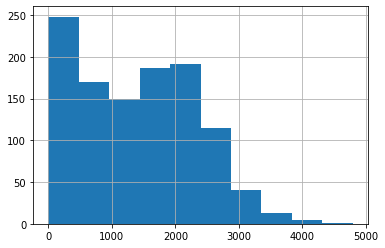

<IPython.core.display.Javascript object>

In [11]:
df_state_info_gs_census["enrollment"].hist()

In [12]:
df_state_info_gs_census["enrollment"].quantile(np.arange(0.1, 1, 0.1))

0.1     214.0
0.2     435.0
0.3     623.2
0.4    1060.4
0.5    1409.0
0.6    1716.0
0.7    1987.6
0.8    2238.2
0.9    2603.6
Name: enrollment, dtype: float64

<IPython.core.display.Javascript object>

In [7]:
df_state_info_gs_census.loc[
    :,
    [
        "name",
        "enrollment",
        "graduation_rates_gradRates_eligibility_allStudents",
        "graduation_rates_gradRates_eligibility_LIstudents",
    ],
].sort_values(by="enrollment").head(20)

,name,enrollment,graduation_rates_gradRates_eligibility_allStudents,graduation_rates_gradRates_eligibility_LIstudents
475,Yosemite Park High School,1.0,NaN,NaN
1112,Cold Springs High School,4.0,NaN,NaN
190,Clear Passage Educational Center,4.0,NaN,NaN
1111,South Fork High School,4.0,100.0,100.0
132,Mattole Triple Junction High School,9.0,NaN,NaN
488,Whale Gulch High School,9.0,100.0,100.0
489,Leggett Valley High School,14.0,NaN,NaN
146,Death Valley High Academy,17.0,80.0,75.0
462,Mountain Oaks High School,18.0,100.0,100.0
1013,Downieville Junior-Senior High School,20.0,100.0,100.0


<IPython.core.display.Javascript object>

In [8]:
df_state_info_gs_census["enrollment"].isnull().sum()

33

<IPython.core.display.Javascript object>

## Feature confirmation

In [272]:
sns.set_context(
    "talk", rc={"font.size": 12, "axes.titlesize": 14, "axes.labelsize": 14}
)

<IPython.core.display.Javascript object>

In [10]:
def scatter_plot_open_circles(df, feature_x, feature_y, ax):
    x = df[feature_x]
    y = df[feature_y]
    ax.scatter(x, y, facecolors="none", edgecolors=B_dkgray)
    ax.set_xlabel(feature_x)
    ax.set_ylabel(feature_y)

<IPython.core.display.Javascript object>

In [11]:
def hist_plot(df, feature, ax):
    df[feature].hist(ax=ax, bins=30, color=B_slate)
    ax.set_title(feature)

<IPython.core.display.Javascript object>

### Feature categories

In [12]:
# Replace magnet and charter status with category encoding variables
df_state_info_gs_census["Magnet_cat_encoded"] = df_state_info_gs_census[
    "Magnet"
].replace({"No Data": None, "N": 0, "Y": 1})
df_state_info_gs_census["Charter_cat_encoded"] = df_state_info_gs_census[
    "Charter"
].replace({"No Data": None, "N": 0, "Y": 1})

<IPython.core.display.Javascript object>

In [13]:
# Census columns that start with '%'
col_census_pct = df_state_info_gs_census.columns[
    df_state_info_gs_census.columns.str.startswith("%")
]
# Broad categories in pct census columns
print(set([i.split("-")[0] for i in col_census_pct.tolist()]))

{'%; EMPLOY_STATUS ', '%; %', '%; INCOME_BENEFITS ', '%; WORK_COMMUTE ', '%; INDUSTRY ', '%; HEALTH_INS_COVERAGE ', '%; OCCUPATION ', '%; WORKER_CLASS '}


<IPython.core.display.Javascript object>

In [14]:
# Census income columns (starts with 'Est')
col_census_est = df_state_info_gs_census.columns[
    df_state_info_gs_census.columns.str.startswith("Est")
]
# Change so that all are numeric/float, using appply
df_state_info_gs_census[col_census_est] = (
    df_state_info_gs_census[col_census_est]
    .apply(pd.to_numeric, errors="coerce")
    .dropna()
    .astype("float")
)
col_census_est.tolist()

['Est.; INCOME_BENEFITS - Total households - Median household income ($)',
 'Est.; INCOME_BENEFITS - Total households - Mean household income ($)',
 'Est.; INCOME_BENEFITS - w/ Social Security - Mean Social Security income ($)',
 'Est.; INCOME_BENEFITS - w/ retirement income',
 'Est.; INCOME_BENEFITS - w/ retirement income - Mean retirement income ($)',
 'Est.; INCOME_BENEFITS - w/ cash public assistance income',
 'Est.; INCOME_BENEFITS - w/ cash public assistance income - Mean cash public assistance income ($)',
 'Est.; INCOME_BENEFITS - Families - Median family income ($)',
 'Est.; INCOME_BENEFITS - Families - Mean family income ($)',
 'Est.; INCOME_BENEFITS - Per capita income ($)',
 'Est.; INCOME_BENEFITS - Nonfamily households - Median nonfamily income ($)',
 'Est.; INCOME_BENEFITS - Nonfamily households - Mean nonfamily income ($)']

<IPython.core.display.Javascript object>

In [15]:
# School info columns
col_school_info_magnet_charter = ["Magnet_cat_encoded", "Charter_cat_encoded"]
col_school_info_magnet_charter

['Magnet_cat_encoded', 'Charter_cat_encoded']

<IPython.core.display.Javascript object>

In [16]:
# High level GS school rating columns
col_hl_ratings = [
    "college_readiness",
    "test_scores",
    "advanced_courses",
    "equity_overview",
    "race_ethnicity",
    "low_income",
    "disabilities",
]
col_gs_hl_ratings = ["gsRating"] + col_hl_ratings
# df_state_info_gs_census[col_gs_hl_ratings] = df_state_info_gs_census[col_gs_hl_ratings].apply(pd.to_numeric, errors='coerce').dropna().astype('float')
# Data types look like they're already float
# initial_analysis(df_state_info_gs_census[col_gs_hl_ratings])
col_gs_hl_ratings

['gsRating',
 'college_readiness',
 'test_scores',
 'advanced_courses',
 'equity_overview',
 'race_ethnicity',
 'low_income',
 'disabilities']

<IPython.core.display.Javascript object>

In [17]:
col_teacher_ratings = [
    "students_per_teacher",
    "students_per_counselor",
    "pct_teachers_3years_or_more",
    "pct_teachers_who_r_certified",
    "avg_teacher_salary",
]
col_teacher_ratings

['students_per_teacher',
 'students_per_counselor',
 'pct_teachers_3years_or_more',
 'pct_teachers_who_r_certified',
 'avg_teacher_salary']

<IPython.core.display.Javascript object>

In [18]:
col_lowincome_ratings = [
    "test_score_rating_allStudents",
    "test_score_rating_LIstudents",
    "test_score_rating_notLIstudents",
    "test_scores_english_allStudents",
    "test_scores_english_allStudents_n_students",
    "test_scores_english_LIstudents",
    "test_scores_english_LIstudents_n_students",
    "test_scores_math_allStudents",
    "test_scores_math_allStudents_n_students",
    "test_scores_math_LIstudents",
    "test_scores_math_LIstudents_n_students",
    "graduation_rates_UCCSU_eligibility_allStudents",
    "graduation_rates_UCCSU_eligibility_LIstudents",
    "graduation_rates_gradRates_eligibility_allStudents",
    "graduation_rates_gradRates_eligibility_LIstudents",
    "pct_LI_students",
]

# Need to remove target from this list without altering original list
col_lowincome_ratings_notarget = col_lowincome_ratings[:]
col_lowincome_ratings_notarget.remove("graduation_rates_UCCSU_eligibility_LIstudents")
col_lowincome_ratings_notarget

['test_score_rating_allStudents',
 'test_score_rating_LIstudents',
 'test_score_rating_notLIstudents',
 'test_scores_english_allStudents',
 'test_scores_english_allStudents_n_students',
 'test_scores_english_LIstudents',
 'test_scores_english_LIstudents_n_students',
 'test_scores_math_allStudents',
 'test_scores_math_allStudents_n_students',
 'test_scores_math_LIstudents',
 'test_scores_math_LIstudents_n_students',
 'graduation_rates_UCCSU_eligibility_allStudents',
 'graduation_rates_gradRates_eligibility_allStudents',
 'graduation_rates_gradRates_eligibility_LIstudents',
 'pct_LI_students']

<IPython.core.display.Javascript object>

### First pass feature filtering

In [19]:
all_features = (
    ["enrollment"]
    + col_census_pct.tolist()
    + col_census_est.tolist()
    + col_school_info_magnet_charter
    + col_gs_hl_ratings
    + col_teacher_ratings
    + col_lowincome_ratings_notarget
)

<IPython.core.display.Javascript object>

In [340]:
# Check for features that have been duplicated
# [i for i in col_census_pct.tolist() if ("_y" not in i)]
all_features = [i for i in all_features if ("_y" not in i)]

<IPython.core.display.Javascript object>

In [341]:
all_features_filt = (
    df_state_info_gs_census[all_features]
    .dropna(thresh=0.67 * len(df_state_info_gs_census), axis=1)
    .columns.tolist()
)

all_features_filt_notarget = all_features_filt[:]
all_features_filt_notarget.remove("graduation_rates_gradRates_eligibility_LIstudents")

<IPython.core.display.Javascript object>

In [342]:
print(
    "No. of features where at least 2/3 of the schools have values for a feature: \n",
    len(all_features_filt_notarget),
)

No. of features where at least 2/3 of the schools have values for a feature: 
 135


<IPython.core.display.Javascript object>

In [343]:
# Identify which features were removed
print(
    "Features that had too many missing values: ",
    set(all_features) - set(all_features_filt),
)

Features that had too many missing values:  {'disabilities', 'race_ethnicity', 'advanced_courses'}


<IPython.core.display.Javascript object>

## Check for normally distributed features

In [23]:
# Looking at Shapiro-Wilk test - this is like taking the slope of a Q-Q plot https://www.youtube.com/watch?v=dRAqSsgkCUc
from scipy.stats import shapiro

for col in df_state_info_gs_census[all_features_filt].columns:
    try:
        stat, p = shapiro(df_state_info_gs_census[col])
        if p > 0.05:
            print(stat, p, col)
    except:
        continue

nan 1.0 enrollment
nan 1.0 %; EMPLOY_STATUS - Own children of the householder under 6 yrs - All parents in family in labor force
nan 1.0 %; EMPLOY_STATUS - Own children of the householder 6 to 17 yrs - All parents in family in labor force
nan 1.0 %; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. <18 yrs - No health ins coverage
nan 1.0 %; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. 18-64 yrs - In labor force: - Unemployed: - w/ health ins coverage
nan 1.0 %; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. 18-64 yrs - In labor force: - Unemployed: - w/ health ins coverage - w/ private health insurance
nan 1.0 %; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. 18-64 yrs - In labor force: - Unemployed: - w/ health ins coverage - w/ public coverage
nan 1.0 %; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. 18-64 yrs - In labor force: - Unemployed: - No health ins coverage
nan 1.0 %; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - All families - w/ re

<IPython.core.display.Javascript object>

### Check for correlated features

Evaluate VIF - Variance inflation factor

- VIF is greater than 10 then remove? An arbitrary cut-off, may be dependent on the task

In [24]:
df_state_info_gs_census[
    [
        "enrollment",
        "pct_LI_students",
        "graduation_rates_gradRates_eligibility_LIstudents",
    ]
].sort_values(by="enrollment")

,enrollment,pct_LI_students,graduation_rates_gradRates_eligibility_LIstudents
475,1.0,NaN,NaN
1112,4.0,NaN,NaN
190,4.0,NaN,NaN
1111,4.0,NaN,100.0
132,9.0,NaN,NaN
...,...,...,...
809,NaN,NaN,NaN
908,NaN,NaN,NaN
945,NaN,NaN,11.0
993,NaN,NaN,NaN


<IPython.core.display.Javascript object>

In [25]:
df_state_info_gs_census[
    "graduation_rates_gradRates_eligibility_LIstudents"
].isnull().sum()

72

<IPython.core.display.Javascript object>

### Census category text inspection

Before filtering:
- INCOME_BENEFITS - percentage (28 columns) - check for redundant columns and correlated and anti-correlated features
- INCOME_BENEFITS - estimated values - (12 columns) - manually select features
- HEALTH_INS_COVERAGE (17 columns) - manually select columns
- WORK_COMMUTE - adds to 100% (6 columns) - interesting to keep, but drop rare categories
- OCCUPATION - adds to 100% (5 columns) - perhaps drop - may be redundant with industry
- INDUSTRY - adds to 100% (13 columns) - interesting to keep but inspect
- WORKER_CLASS - adds to 100% (4 columns) - OK to keep but inspect
- EMPLOY_STATUS - (12 columns) - OK to keep but inspect
- %-AGE_FAMILIES_INCOME_BELOW_POVERTY (13 columns) - follow up


In [26]:
[print(i) for i in col_census_pct]

%; INCOME_BENEFITS - w/ retirement income_x
%; INCOME_BENEFITS - w/ cash public assistance income_x
%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force
%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force - Civilian labor force
%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force - Civilian labor force - Employed
%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force - Civilian labor force - Unemployed
%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force - Armed Forces
%; EMPLOY_STATUS - Pop. 16 yrs and up - Not in labor force
%; EMPLOY_STATUS - Civilian labor force - Unemployment Rate
%; EMPLOY_STATUS - Females 16 yrs and up - In labor force
%; EMPLOY_STATUS - Females 16 yrs and up - In labor force - Civilian labor force
%; EMPLOY_STATUS - Females 16 yrs and up - In labor force - Civilian labor force - Employed
%; EMPLOY_STATUS - Own children of the householder under 6 yrs - All parents in family in labor force
%; EMPLOY_STATUS - Own children of the householder 6 to 17 yrs - 

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

<IPython.core.display.Javascript object>

#### Income benefits columns

##### Evaluation of pct income benefits columns

In [27]:
col_census_pct_ib = col_census_pct[
    df_state_info_gs_census[col_census_pct].columns.str.contains("INCOME_BENEFITS")
].tolist()

# Drop columns containing '%; INCOME_BENEFITS - Families -' since it's redundant with '%; INCOME_BENEFITS - Total households - '
col2drop = col_census_pct[
    df_state_info_gs_census[col_census_pct].columns.str.contains(
        "%; INCOME_BENEFITS - Families"
    )
].tolist()

# Drop duplicated columns
col2drop = col2drop + [
    "%; INCOME_BENEFITS - w/ retirement income_y",
    "%; INCOME_BENEFITS - w/ cash public assistance income_y",
]

col_census_pct_ib = list(set(col_census_pct_ib) - set(col2drop))

# Iteration 1 - hand select other columns to account for correlations anti-correlations, etc.
col_census_pct_ib = [
    "%; INCOME_BENEFITS - Total households - Less than $10,000",
    "%; INCOME_BENEFITS - Total households - $10,000 to $14,999",
    "%; INCOME_BENEFITS - Total households - $15,000 to $24,999",
    "%; INCOME_BENEFITS - Total households - $25,000 to $34,999",
    "%; INCOME_BENEFITS - Total households - $35,000 to $49,999",
    "%; INCOME_BENEFITS - Total households - $50,000 to $74,999",
    "%; INCOME_BENEFITS - Total households - $75,000 to $99,999",
    "%; INCOME_BENEFITS - Total households - $100,000 to $149,999",
    "%; INCOME_BENEFITS - Total households - $150,000 to $199,999",
    "%; INCOME_BENEFITS - Total households - $200,000 or more",
    "%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefits in the past 12 months",
    "%; INCOME_BENEFITS - w/ Social Security",
    "%; INCOME_BENEFITS - w/ Supplemental Security Income",
]

<IPython.core.display.Javascript object>

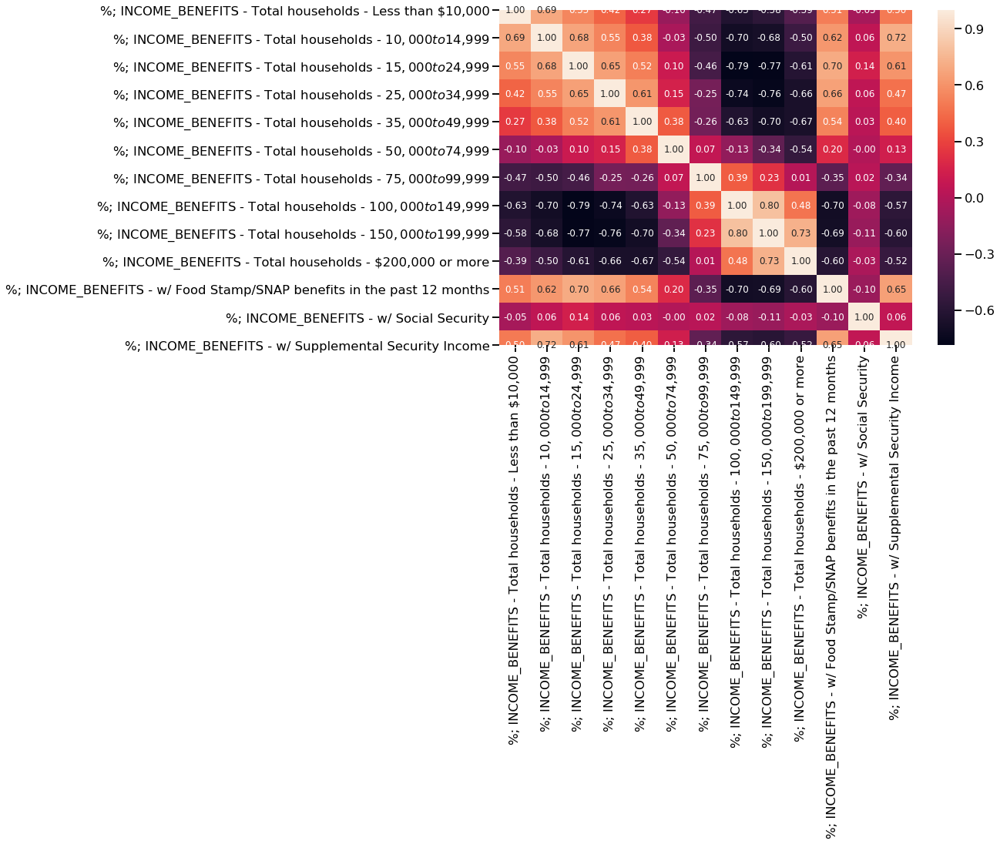

<IPython.core.display.Javascript object>

In [28]:
# Check for correlated and anti-correlated features - done before and after column filtering
fig, ax = plt.subplots(figsize=(12, 8))
sns.heatmap(
    df_state_info_gs_census[col_census_pct_ib].corr(method="pearson"),
    annot=True,
    fmt="0.2f",
)

/Users/lacar/anaconda/envs/insight/lib/python3.6/site-packages/seaborn/axisgrid.py:1306: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  fig.tight_layout()


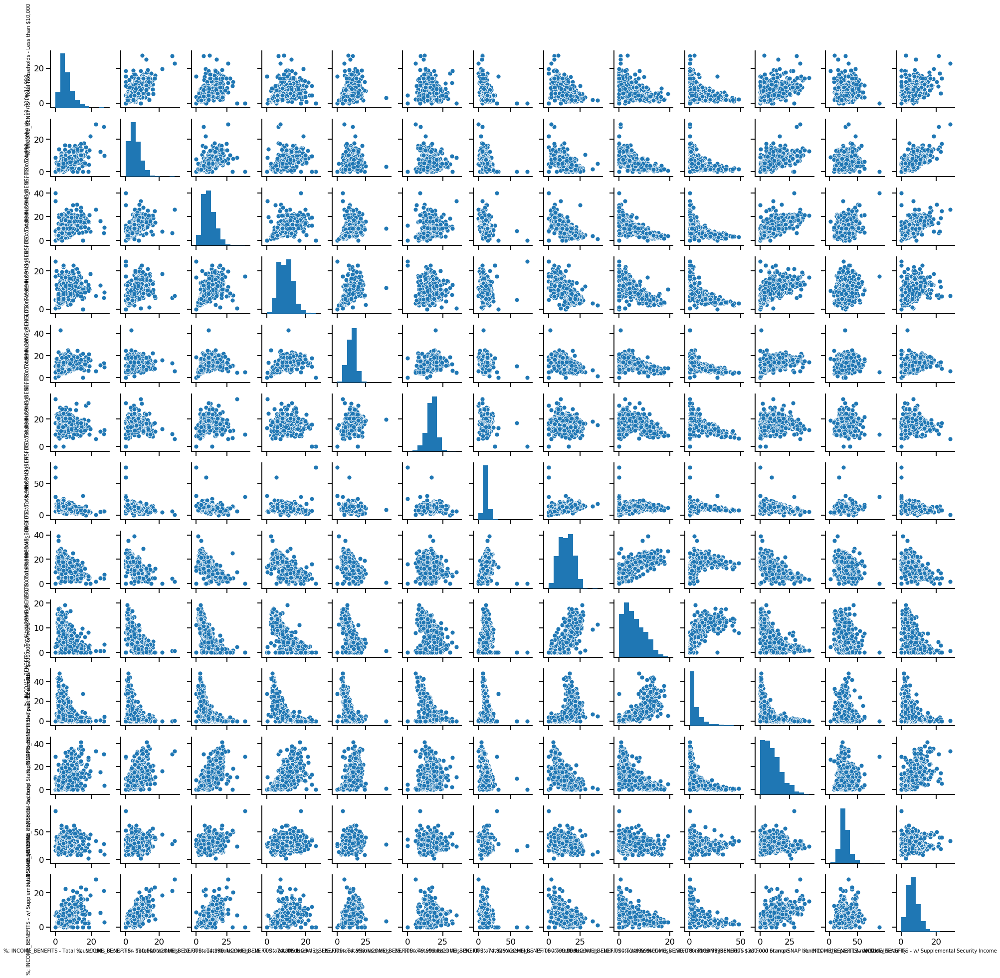

<IPython.core.display.Javascript object>

In [29]:
# Categorical breakdown of percent household income
sns.pairplot(df_state_info_gs_census.loc[:, col_census_pct_ib])

In [30]:
# Iteration 2 - hand select other columns to account for correlations anti-correlations, etc.

# % cash public assistance correlates with Food Stamp benefits
col_census_pct_ib_final = [
    "%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefits in the past 12 months",
    "%; INCOME_BENEFITS - w/ Social Security",
    "%; INCOME_BENEFITS - w/ Supplemental Security Income",
]

<IPython.core.display.Javascript object>

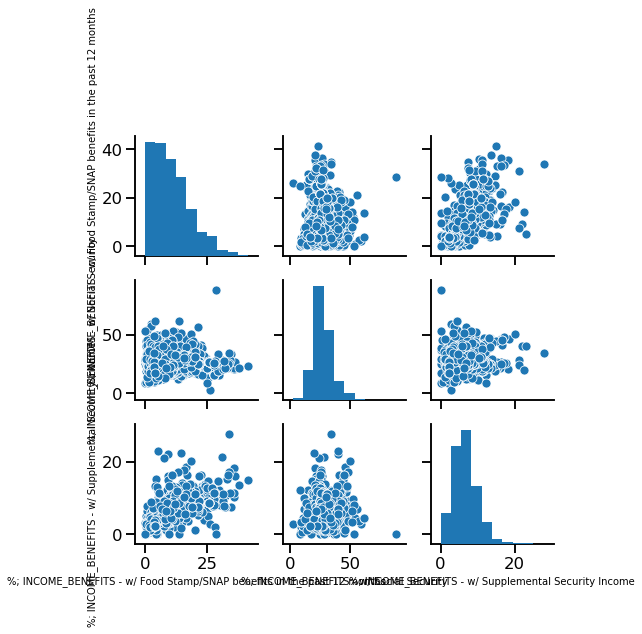

<IPython.core.display.Javascript object>

In [31]:
# Categorical breakdown of percent household income after feature culling
sns.pairplot(df_state_info_gs_census.loc[:, col_census_pct_ib_final]);


In [32]:
# View all correlation values, reshaping table
# df_state_info_gs_census[col_census_pct_ib[0:3]].corr(method='pearson')

<IPython.core.display.Javascript object>

##### Evaluation of estimated income benefits

In [33]:
col_census_est_ib = col_census_est[
    df_state_info_gs_census[col_census_est].columns.str.contains("INCOME_BENEFITS")
]
col_census_est_ib

Index(['Est.; INCOME_BENEFITS - Total households - Median household income ($)',
       'Est.; INCOME_BENEFITS - Total households - Mean household income ($)',
       'Est.; INCOME_BENEFITS - w/ Social Security - Mean Social Security income ($)',
       'Est.; INCOME_BENEFITS - w/ retirement income',
       'Est.; INCOME_BENEFITS - w/ retirement income - Mean retirement income ($)',
       'Est.; INCOME_BENEFITS - w/ cash public assistance income',
       'Est.; INCOME_BENEFITS - w/ cash public assistance income - Mean cash public assistance income ($)',
       'Est.; INCOME_BENEFITS - Families - Median family income ($)',
       'Est.; INCOME_BENEFITS - Families - Mean family income ($)',
       'Est.; INCOME_BENEFITS - Per capita income ($)',
       'Est.; INCOME_BENEFITS - Nonfamily households - Median nonfamily income ($)',
       'Est.; INCOME_BENEFITS - Nonfamily households - Mean nonfamily income ($)'],
      dtype='object')

<IPython.core.display.Javascript object>

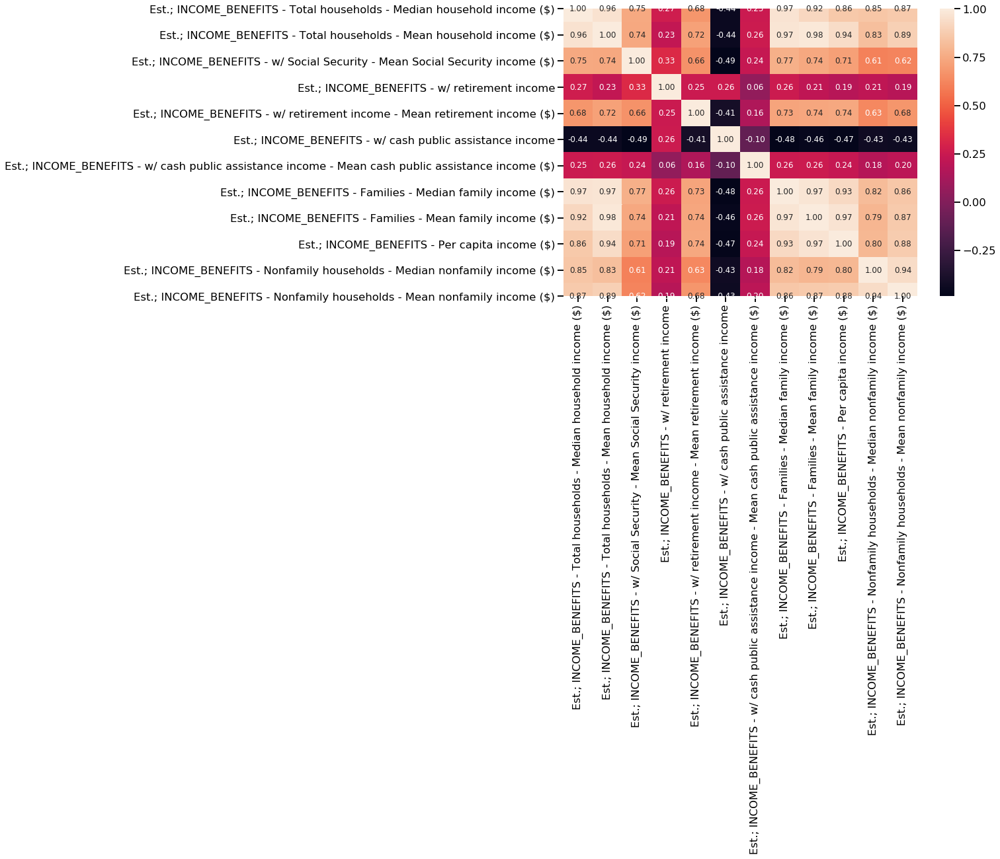

<IPython.core.display.Javascript object>

In [34]:
# Check for correlated and anti-correlated features - done before and after column filtering
fig, ax = plt.subplots(figsize=(12, 8))
sns.heatmap(
    df_state_info_gs_census[col_census_est_ib].corr(method="pearson"),
    annot=True,
    fmt="0.2f",
)

In [35]:
# Iteration 1 - hand select other columns to account for correlations anti-correlations, etc.
col_census_est_ib_final = [
    "Est.; INCOME_BENEFITS - Total households - Median household income ($)",
    "Est.; INCOME_BENEFITS - w/ retirement income - Mean retirement income ($)",
    "Est.; INCOME_BENEFITS - w/ cash public assistance income - Mean cash public assistance income ($)",
]

<IPython.core.display.Javascript object>

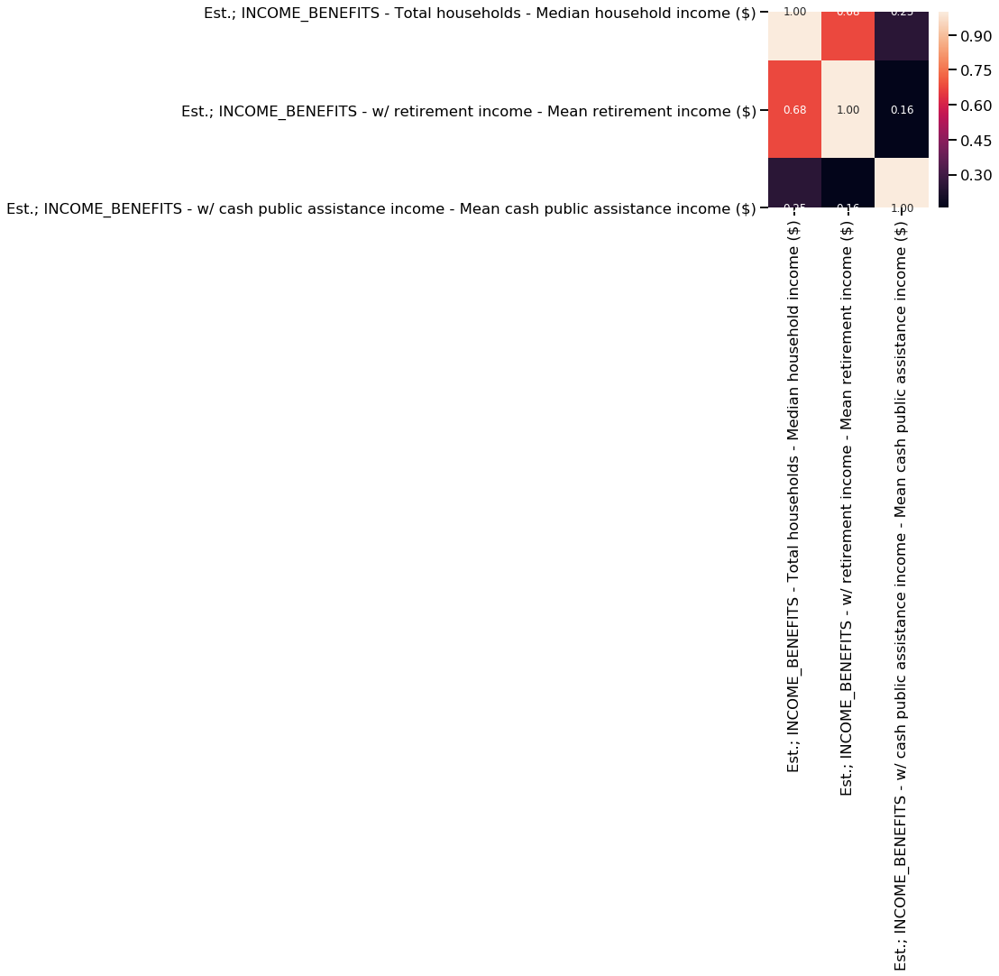

<IPython.core.display.Javascript object>

In [36]:
# Check for correlated and anti-correlated features - done before and after column filtering
fig, ax = plt.subplots(figsize=(4, 4))
sns.heatmap(
    df_state_info_gs_census[col_census_est_ib_final].corr(method="pearson"),
    annot=True,
    fmt="0.2f",
)

##### Examination space with text inspection

In [37]:
category_col = col_census_pct[
    df_state_info_gs_census[col_census_pct].columns.str.contains("INCOME_BENEFITS")
]
category_col

Index(['%; INCOME_BENEFITS - w/ retirement income_x',
       '%; INCOME_BENEFITS - w/ cash public assistance income_x',
       '%; INCOME_BENEFITS - Total households - Less than $10,000',
       '%; INCOME_BENEFITS - Total households - $10,000 to $14,999',
       '%; INCOME_BENEFITS - Total households - $15,000 to $24,999',
       '%; INCOME_BENEFITS - Total households - $25,000 to $34,999',
       '%; INCOME_BENEFITS - Total households - $35,000 to $49,999',
       '%; INCOME_BENEFITS - Total households - $50,000 to $74,999',
       '%; INCOME_BENEFITS - Total households - $75,000 to $99,999',
       '%; INCOME_BENEFITS - Total households - $100,000 to $149,999',
       '%; INCOME_BENEFITS - Total households - $150,000 to $199,999',
       '%; INCOME_BENEFITS - Total households - $200,000 or more',
       '%; INCOME_BENEFITS - w/ earnings',
       '%; INCOME_BENEFITS - w/ Social Security',
       '%; INCOME_BENEFITS - w/ retirement income_y',
       '%; INCOME_BENEFITS - w/ Supplement

<IPython.core.display.Javascript object>

In [38]:
category_col = col_census_est[
    df_state_info_gs_census[col_census_est].columns.str.contains("INCOME_BENEFITS")
]
len(category_col)

12

<IPython.core.display.Javascript object>

In [39]:
df_state_info_gs_census[category_col].head()

,Est.; INCOME_BENEFITS - Total households - Median household income ($),Est.; INCOME_BENEFITS - Total households - Mean household income ($),Est.; INCOME_BENEFITS - w/ Social Security - Mean Social Security income ($),Est.; INCOME_BENEFITS - w/ retirement income,Est.; INCOME_BENEFITS - w/ retirement income - Mean retirement income ($),Est.; INCOME_BENEFITS - w/ cash public assistance income,Est.; INCOME_BENEFITS - w/ cash public assistance income - Mean cash public assistance income ($),Est.; INCOME_BENEFITS - Families - Median family income ($),Est.; INCOME_BENEFITS - Families - Mean family income ($),Est.; INCOME_BENEFITS - Per capita income ($),Est.; INCOME_BENEFITS - Nonfamily households - Median nonfamily income ($),Est.; INCOME_BENEFITS - Nonfamily households - Mean nonfamily income ($)
0,32993.0,55911.0,12978.0,659.0,29027.0,368.0,5055.0,38980.0,67067.0,32425.0,29122.0,51831.0
1,72884.0,99612.0,17113.0,3804.0,32115.0,827.0,4632.0,88693.0,118416.0,41592.0,52815.0,67936.0
2,31903.0,43104.0,12293.0,1086.0,19269.0,1268.0,5347.0,34633.0,44970.0,13082.0,18963.0,28948.0
3,31903.0,43104.0,12293.0,1086.0,19269.0,1268.0,5347.0,34633.0,44970.0,13082.0,18963.0,28948.0
4,80970.0,105995.0,17921.0,1085.0,36487.0,83.0,4229.0,95880.0,118328.0,42019.0,49099.0,74376.0


<IPython.core.display.Javascript object>

In [40]:
df_state_info_gs_census[category_col].sum(axis=1)

0       356416.0
1       600439.0
2       254866.0
3       254866.0
4       626472.0
          ...   
1147    434406.0
1148    367796.0
1149    342714.0
1150    342714.0
1151    430859.0
Length: 1152, dtype: float64

<IPython.core.display.Javascript object>

##### Examination space with visualizations of various features

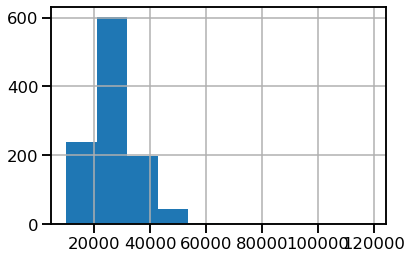

<IPython.core.display.Javascript object>

In [41]:
# Histogram
df_state_info_gs_census[category_col].iloc[:, 4].hist()

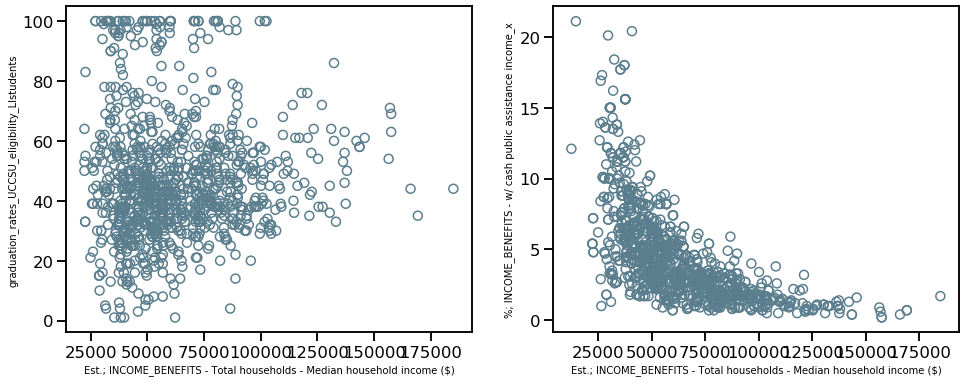

<IPython.core.display.Javascript object>

In [42]:
# Scatter plots
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
scatter_plot_open_circles(df_state_info_gs_census, 
                          'Est.; INCOME_BENEFITS - Total households - Median household income ($)', 
                          'graduation_rates_UCCSU_eligibility_LIstudents', 
                          ax1)

scatter_plot_open_circles(df_state_info_gs_census, 
                          'Est.; INCOME_BENEFITS - Total households - Median household income ($)', 
                          '%; INCOME_BENEFITS - w/ cash public assistance income_x', 
                          ax2)


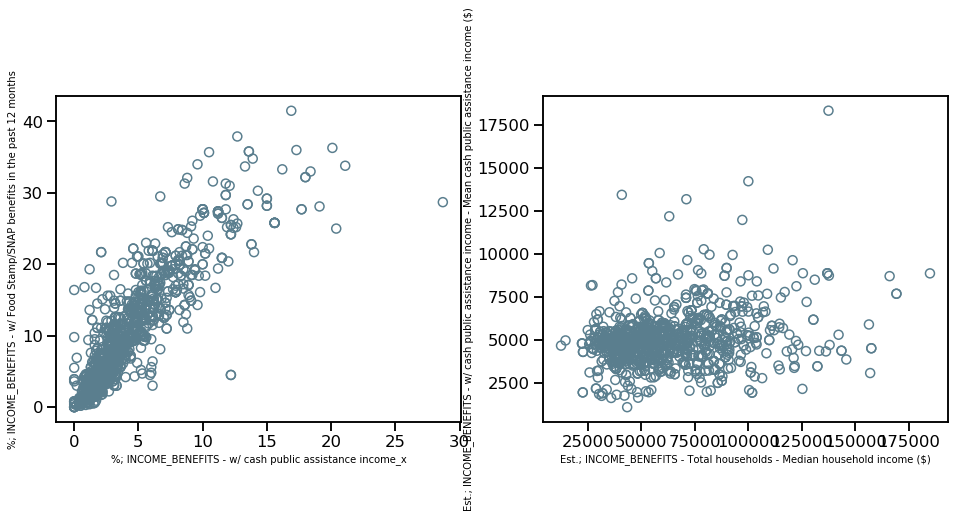

<IPython.core.display.Javascript object>

In [43]:
# Scatter plots
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
scatter_plot_open_circles(df_state_info_gs_census, 
                          '%; INCOME_BENEFITS - w/ cash public assistance income_x', 
                          '%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefits in the past 12 months', 
                          ax1)

scatter_plot_open_circles(df_state_info_gs_census, 
                          'Est.; INCOME_BENEFITS - Total households - Median household income ($)',
                          'Est.; INCOME_BENEFITS - w/ cash public assistance income - Mean cash public assistance income ($)', 
                          ax2)


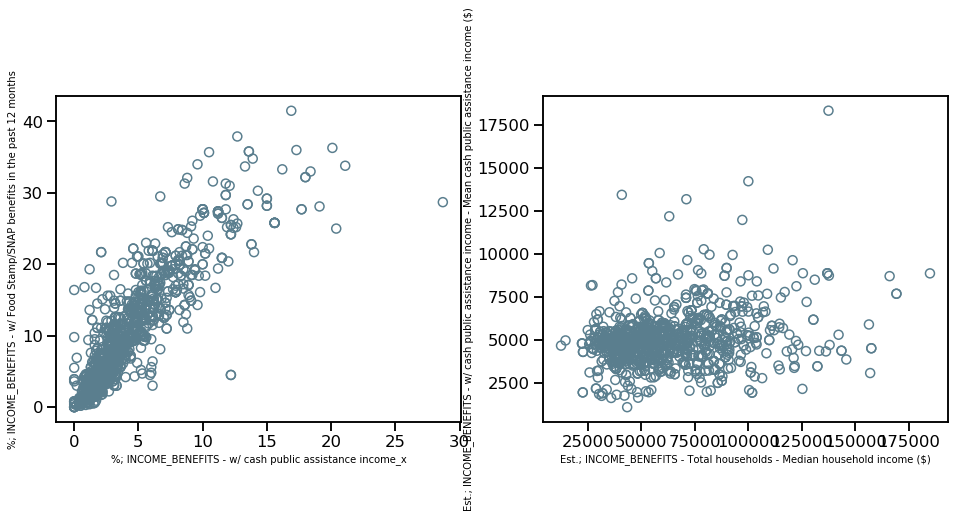

<IPython.core.display.Javascript object>

In [44]:
# Scatter plots - do I need percent and estimated income benefit columns?
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
scatter_plot_open_circles(
    df_state_info_gs_census,
    "%; INCOME_BENEFITS - w/ cash public assistance income_x",
    "%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefits in the past 12 months",
    ax1,
)

scatter_plot_open_circles(
    df_state_info_gs_census,
    "Est.; INCOME_BENEFITS - Total households - Median household income ($)",
    "Est.; INCOME_BENEFITS - w/ cash public assistance income - Mean cash public assistance income ($)",
    ax2,
)

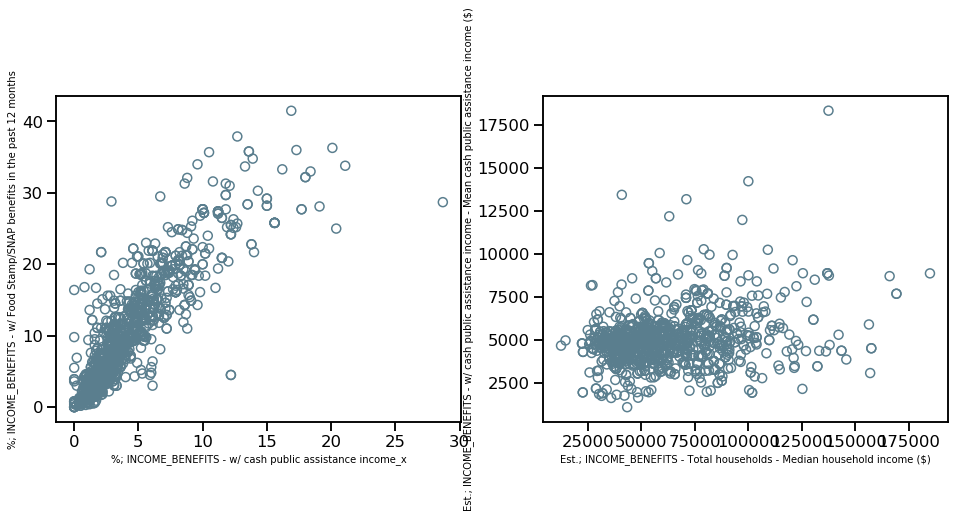

<IPython.core.display.Javascript object>

In [45]:
# Scatter plots - do I need percent and estimated income benefit columns?
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
scatter_plot_open_circles(df_state_info_gs_census, 
                          '%; INCOME_BENEFITS - w/ cash public assistance income_x', 
                          '%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefits in the past 12 months', 
                          ax1)

scatter_plot_open_circles(df_state_info_gs_census, 
                          'Est.; INCOME_BENEFITS - Total households - Median household income ($)',
                          'Est.; INCOME_BENEFITS - w/ cash public assistance income - Mean cash public assistance income ($)', 
                          ax2)


#### Health insurance columns

In [46]:
col_census_pct_hi = col_census_pct[
    df_state_info_gs_census[col_census_pct].columns.str.contains("HEALTH_INS")
].tolist()

<IPython.core.display.Javascript object>

In [47]:
col_census_pct_hi

['%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage',
 '%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage - w/ private health insurance',
 '%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage - w/ public coverage',
 '%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - No health ins coverage',
 '%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. <18 yrs - No health ins coverage',
 '%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. 18-64 yrs - In labor force: - Employed: - w/ health ins coverage',
 '%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. 18-64 yrs - In labor force: - Employed: - w/ health ins coverage - w/ private health insurance',
 '%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. 18-64 yrs - In labor force: - Employed: - w/ health ins coverage - w/ public coverage',
 '%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized p

<IPython.core.display.Javascript object>

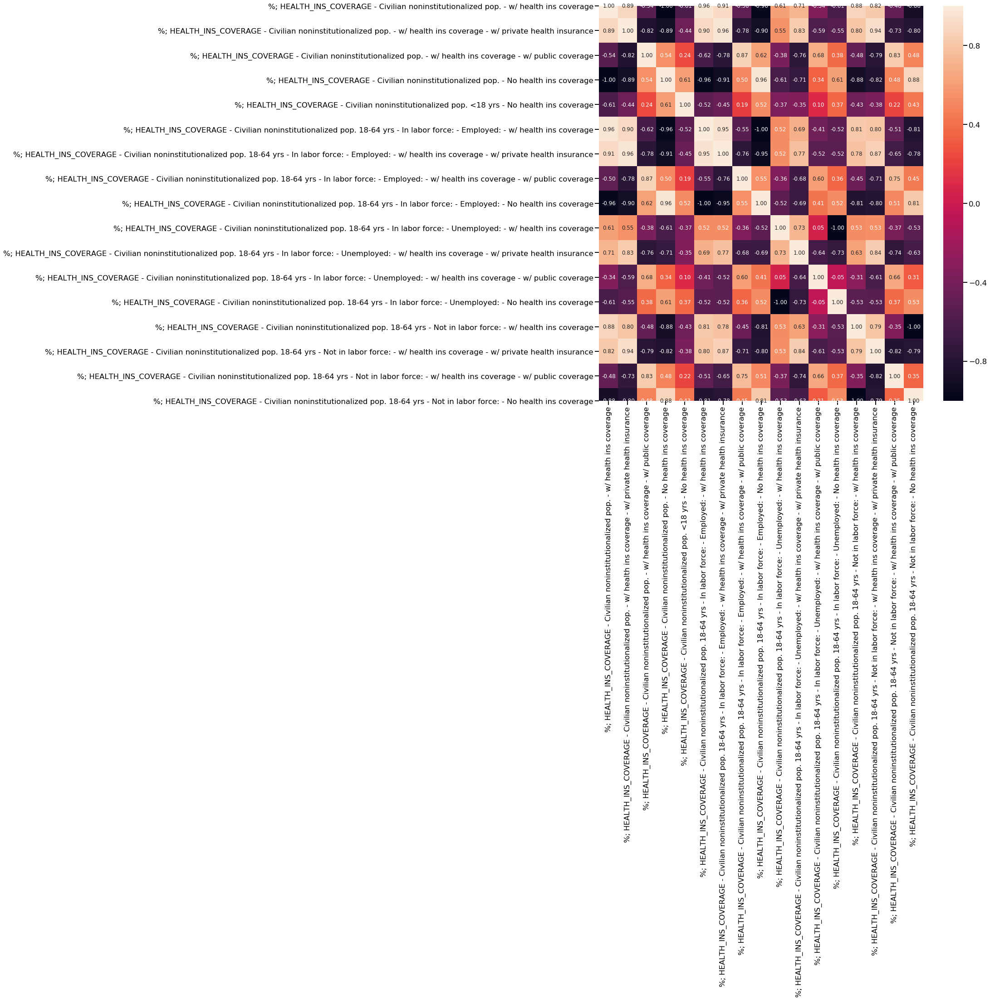

<IPython.core.display.Javascript object>

In [48]:
fig, ax = plt.subplots(figsize=(16, 16))
sns.heatmap(
    df_state_info_gs_census[col_census_pct_hi].corr(method="pearson"),
    annot=True,
    fmt="0.2f",
)

In [49]:
# Iteration 1 - hand select other columns to account for correlations anti-correlations, etc.
# Removed those with

col_census_pct_hi_v0 = [
    "%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage",
    "%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage - w/ public coverage",
    "%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. <18 yrs - No health ins coverage",
]

<IPython.core.display.Javascript object>

In [50]:
df_state_info_gs_census[col_census_pct_hi_v0].corr(method="pearson")

,%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage,%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage - w/ public coverage,%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. <18 yrs - No health ins coverage
%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage,1.000000,-0.540853,-0.609231
%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage - w/ public coverage,-0.540853,1.000000,0.242434
%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. <18 yrs - No health ins coverage,-0.609231,0.242434,1.000000


<IPython.core.display.Javascript object>

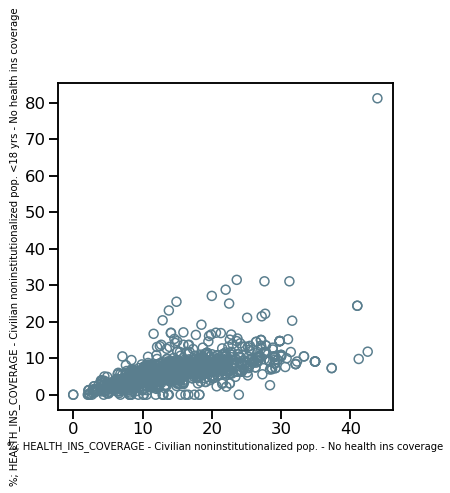

<IPython.core.display.Javascript object>

In [51]:
# Scatter plots - do I need percent and estimated income benefit columns?
f, (ax1) = plt.subplots(1, 1, figsize=(6, 6))
scatter_plot_open_circles(
    df_state_info_gs_census,
    "%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - No health ins coverage",
    "%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. <18 yrs - No health ins coverage",
    ax1,
)

In [52]:
col_census_pct_hi_final = col_census_pct_hi_v0.copy()
col_census_pct_hi_final

['%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage',
 '%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage - w/ public coverage',
 '%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. <18 yrs - No health ins coverage']

<IPython.core.display.Javascript object>

#### Work commute columns

In [53]:
col_census_pct_wc = col_census_pct[
    df_state_info_gs_census[col_census_pct].columns.str.contains("WORK_COMMUTE")
].tolist()
col_census_pct_wc

['%; WORK_COMMUTE - Workers 16 yrs and up - Car, truck, or van -- drove alone',
 '%; WORK_COMMUTE - Workers 16 yrs and up - Car, truck, or van -- carpooled',
 '%; WORK_COMMUTE - Workers 16 yrs and up - Public transportation (excluding taxicab)',
 '%; WORK_COMMUTE - Workers 16 yrs and up - Walked',
 '%; WORK_COMMUTE - Workers 16 yrs and up - Other means',
 '%; WORK_COMMUTE - Workers 16 yrs and up - Worked at home']

<IPython.core.display.Javascript object>

In [54]:
df_state_info_gs_census[col_census_pct_wc].corr(method="pearson")

,"%; WORK_COMMUTE - Workers 16 yrs and up - Car, truck, or van -- drove alone","%; WORK_COMMUTE - Workers 16 yrs and up - Car, truck, or van -- carpooled",%; WORK_COMMUTE - Workers 16 yrs and up - Public transportation (excluding taxicab),%; WORK_COMMUTE - Workers 16 yrs and up - Walked,%; WORK_COMMUTE - Workers 16 yrs and up - Other means,%; WORK_COMMUTE - Workers 16 yrs and up - Worked at home
"%; WORK_COMMUTE - Workers 16 yrs and up - Car, truck, or van -- drove alone",1.000000,-0.134708,-0.748350,-0.621511,-0.478256,-0.256264
"%; WORK_COMMUTE - Workers 16 yrs and up - Car, truck, or van -- carpooled",-0.134708,1.000000,-0.076330,-0.187178,-0.069642,-0.390938
%; WORK_COMMUTE - Workers 16 yrs and up - Public transportation (excluding taxicab),-0.748350,-0.076330,1.000000,0.287804,0.195814,-0.073084
%; WORK_COMMUTE - Workers 16 yrs and up - Walked,-0.621511,-0.187178,0.287804,1.000000,0.385832,0.162550
%; WORK_COMMUTE - Workers 16 yrs and up - Other means,-0.478256,-0.069642,0.195814,0.385832,1.000000,-0.024728
%; WORK_COMMUTE - Workers 16 yrs and up - Worked at home,-0.256264,-0.390938,-0.073084,0.162550,-0.024728,1.000000


<IPython.core.display.Javascript object>

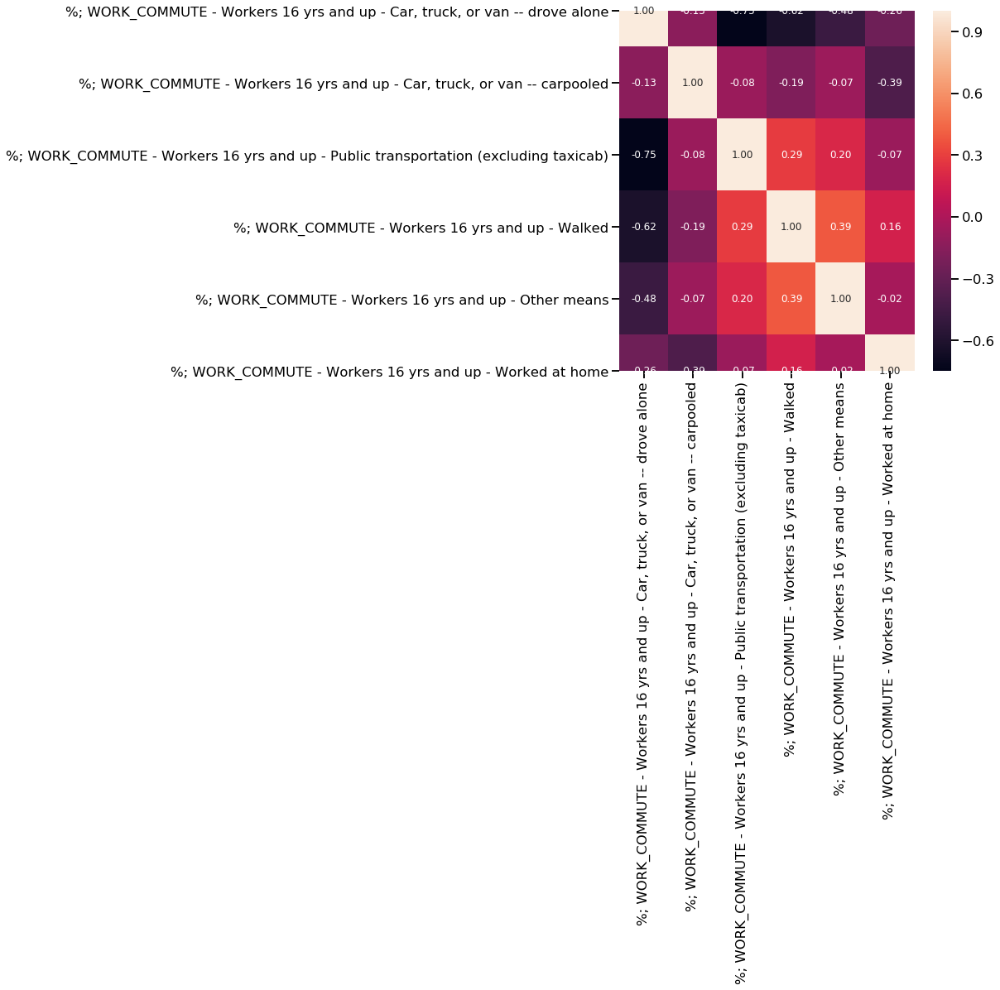

<IPython.core.display.Javascript object>

In [55]:
fig, ax = plt.subplots(figsize=(8, 8))
sns.heatmap(
    df_state_info_gs_census[col_census_pct_wc].corr(method="pearson"),
    annot=True,
    fmt="0.2f",
)

NameError: name 'work_commute_col' is not defined

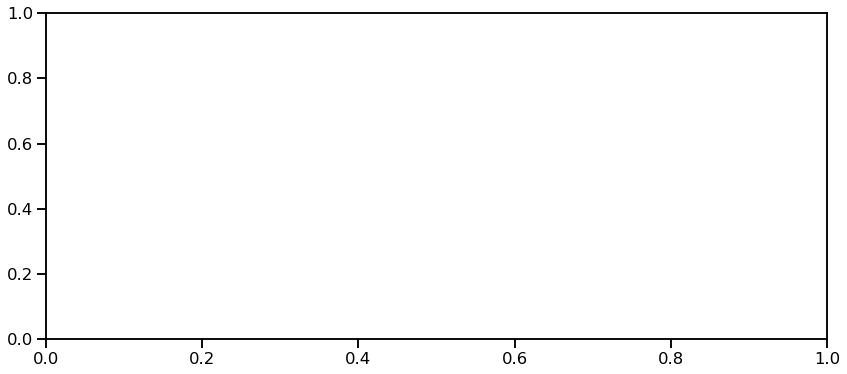

<IPython.core.display.Javascript object>

In [56]:
f, ax1 = plt.subplots(figsize=(14, 6))

ax1.stackplot(
    range(len(df_state_info_gs_census)),
    df_state_info_gs_census[work_commute_col].iloc[:, 0],
    df_state_info_gs_census[work_commute_col].iloc[:, 1],
    df_state_info_gs_census[work_commute_col].iloc[:, 2],
    df_state_info_gs_census[work_commute_col].iloc[:, 3],
    df_state_info_gs_census[work_commute_col].iloc[:, 4],
    df_state_info_gs_census[work_commute_col].iloc[:, 5],
    colors=B_colors_cat[0:6],
    labels=[
        "drove alone",
        "carpool",
        "public transportation",
        "walked",
        "other",
        "worked from home",
    ],
)

ax1.legend()

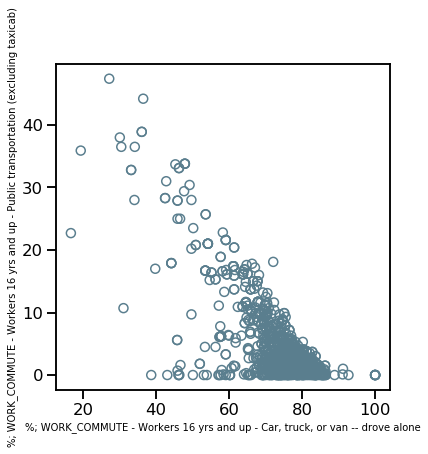

<IPython.core.display.Javascript object>

In [57]:
# Scatter plots - do I need percent and estimated income benefit columns?
f, (ax1) = plt.subplots(1, 1, figsize=(6, 6))
scatter_plot_open_circles(
    df_state_info_gs_census,
    "%; WORK_COMMUTE - Workers 16 yrs and up - Car, truck, or van -- drove alone",
    "%; WORK_COMMUTE - Workers 16 yrs and up - Public transportation (excluding taxicab)",
    ax1,
)

**The Pearson is -.0.75. It's borderline, but I'll keep both "drove alone" and "public transportation" since it's possible that they could be giving different information. But I will drop "other" and "work from home"**

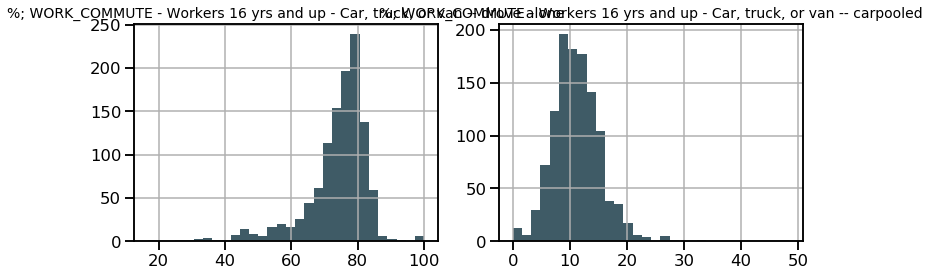

<IPython.core.display.Javascript object>

In [58]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))

hist_plot(
    df_state_info_gs_census,
    "%; WORK_COMMUTE - Workers 16 yrs and up - Car, truck, or van -- drove alone",
    ax1,
)

hist_plot(
    df_state_info_gs_census,
    "%; WORK_COMMUTE - Workers 16 yrs and up - Car, truck, or van -- carpooled",
    ax2,
)

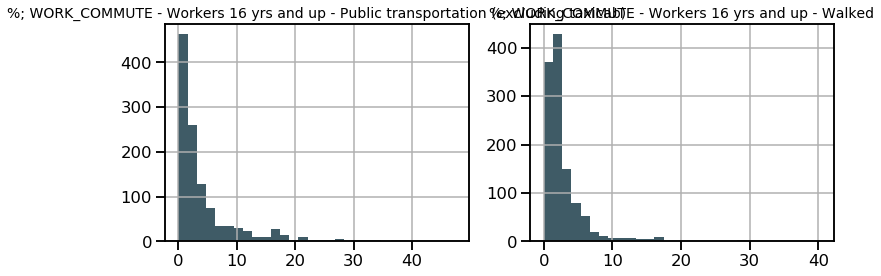

<IPython.core.display.Javascript object>

In [59]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))

hist_plot(
    df_state_info_gs_census,
    "%; WORK_COMMUTE - Workers 16 yrs and up - Public transportation (excluding taxicab)",
    ax1,
)

hist_plot(
    df_state_info_gs_census, "%; WORK_COMMUTE - Workers 16 yrs and up - Walked", ax2,
)

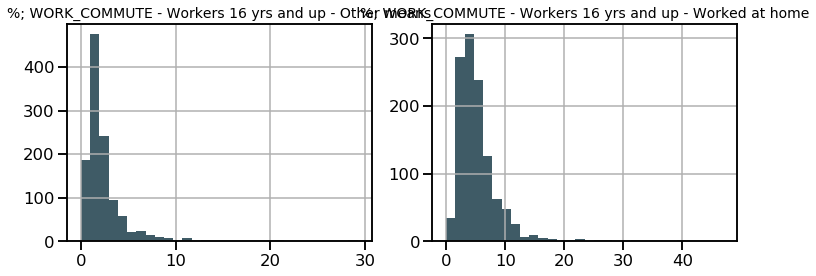

<IPython.core.display.Javascript object>

In [60]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))

hist_plot(
    df_state_info_gs_census,
    "%; WORK_COMMUTE - Workers 16 yrs and up - Other means",
    ax1,
)

hist_plot(
    df_state_info_gs_census,
    "%; WORK_COMMUTE - Workers 16 yrs and up - Worked at home",
    ax2,
)

In [61]:
# Chose these since they had a more normal distribution and minimized correlations/anti-correlations
col_census_pct_wc_final = [
    "%; WORK_COMMUTE - Workers 16 yrs and up - Car, truck, or van -- drove alone",
    "%; WORK_COMMUTE - Workers 16 yrs and up - Car, truck, or van -- carpooled",
    "%; WORK_COMMUTE - Workers 16 yrs and up - Public transportation (excluding taxicab)",
    "%; WORK_COMMUTE - Workers 16 yrs and up - Walked",
    "%; WORK_COMMUTE - Workers 16 yrs and up - Worked at home",
]

<IPython.core.display.Javascript object>

#### Occupation and industry columns

In [62]:
col_census_pct_occ = col_census_pct[
    df_state_info_gs_census[col_census_pct].columns.str.contains("OCCUPATION")
].tolist()
col_census_pct_occ

['%; OCCUPATION - Civilian employed pop. 16 yrs and up - Management, business, science, and arts occupations',
 '%; OCCUPATION - Civilian employed pop. 16 yrs and up - Service occupations',
 '%; OCCUPATION - Civilian employed pop. 16 yrs and up - Sales and office occupations',
 '%; OCCUPATION - Civilian employed pop. 16 yrs and up - Natural resources, construction, and maintenance occupations',
 '%; OCCUPATION - Civilian employed pop. 16 yrs and up - Production, transportation, and material moving occupations']

<IPython.core.display.Javascript object>

In [63]:
df_state_info_gs_census[col_census_pct_occ].corr(method="pearson")

,"%; OCCUPATION - Civilian employed pop. 16 yrs and up - Management, business, science, and arts occupations",%; OCCUPATION - Civilian employed pop. 16 yrs and up - Service occupations,%; OCCUPATION - Civilian employed pop. 16 yrs and up - Sales and office occupations,"%; OCCUPATION - Civilian employed pop. 16 yrs and up - Natural resources, construction, and maintenance occupations","%; OCCUPATION - Civilian employed pop. 16 yrs and up - Production, transportation, and material moving occupations"
"%; OCCUPATION - Civilian employed pop. 16 yrs and up - Management, business, science, and arts occupations",1.000000,-0.651119,-0.112866,-0.637251,-0.772026
%; OCCUPATION - Civilian employed pop. 16 yrs and up - Service occupations,-0.651119,1.000000,-0.005824,0.171893,0.314625
%; OCCUPATION - Civilian employed pop. 16 yrs and up - Sales and office occupations,-0.112866,-0.005824,1.000000,-0.377559,0.019558
"%; OCCUPATION - Civilian employed pop. 16 yrs and up - Natural resources, construction, and maintenance occupations",-0.637251,0.171893,-0.377559,1.000000,0.327353
"%; OCCUPATION - Civilian employed pop. 16 yrs and up - Production, transportation, and material moving occupations",-0.772026,0.314625,0.019558,0.327353,1.000000


<IPython.core.display.Javascript object>

In [64]:
col_census_pct_industry = col_census_pct[
    df_state_info_gs_census[col_census_pct].columns.str.contains("INDUSTRY")
].tolist()
col_census_pct_industry

['%; INDUSTRY - Civilian employed pop. 16 yrs and up - Agriculture, forestry, fishing and hunting, and mining',
 '%; INDUSTRY - Civilian employed pop. 16 yrs and up - Construction',
 '%; INDUSTRY - Civilian employed pop. 16 yrs and up - Manufacturing',
 '%; INDUSTRY - Civilian employed pop. 16 yrs and up - Wholesale trade',
 '%; INDUSTRY - Civilian employed pop. 16 yrs and up - Retail trade',
 '%; INDUSTRY - Civilian employed pop. 16 yrs and up - Transportation and warehousing, and utilities',
 '%; INDUSTRY - Civilian employed pop. 16 yrs and up - Information',
 '%; INDUSTRY - Civilian employed pop. 16 yrs and up - Finance and insurance, and real estate and rental and leasing',
 '%; INDUSTRY - Civilian employed pop. 16 yrs and up - Professional, scientific, and management, and administrative and waste management services',
 '%; INDUSTRY - Civilian employed pop. 16 yrs and up - Educational services, and health care and social assistance',
 '%; INDUSTRY - Civilian employed pop. 16 yrs an

<IPython.core.display.Javascript object>

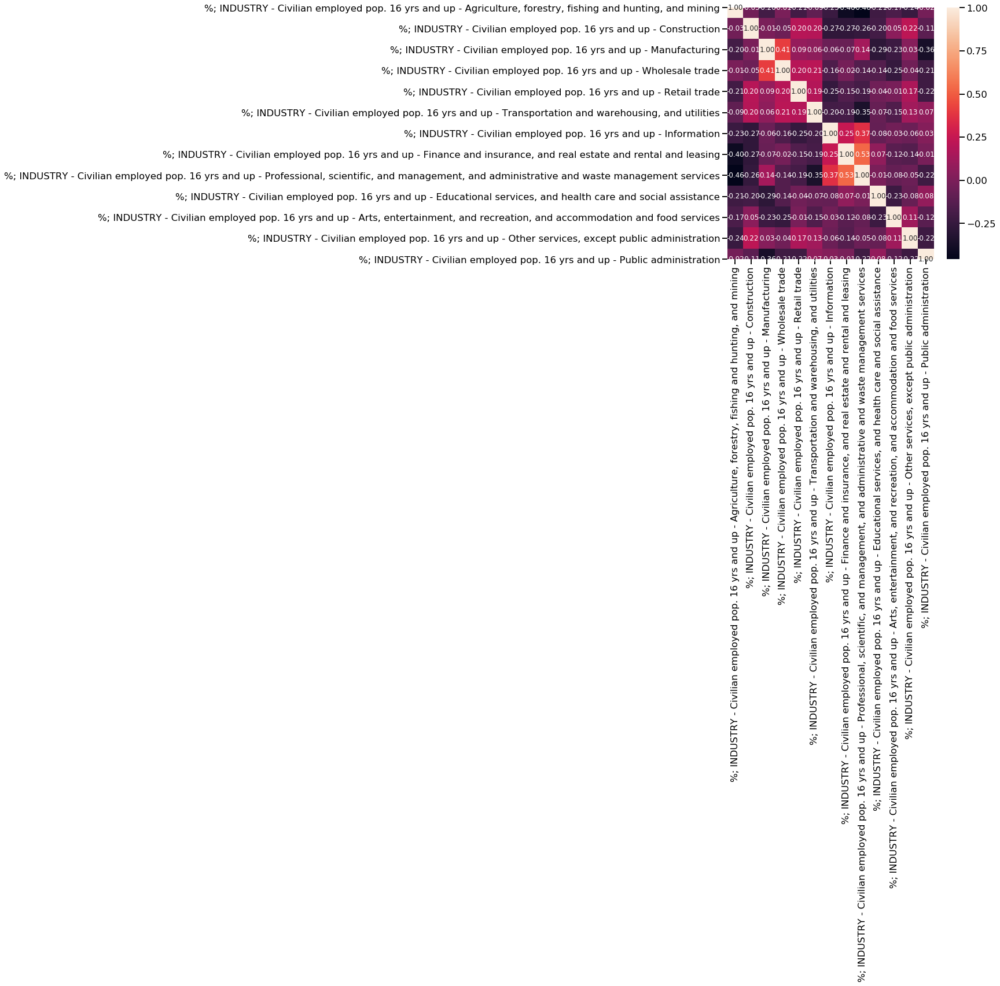

<IPython.core.display.Javascript object>

In [65]:
fig, ax = plt.subplots(figsize=(8, 8))
sns.heatmap(
    df_state_info_gs_census[col_census_pct_industry].corr(method="pearson"),
    annot=True,
    fmt="0.2f",
)

In [66]:
# df_state_info_gs_census[col_census_pct_industry].corr(method="pearson")

<IPython.core.display.Javascript object>

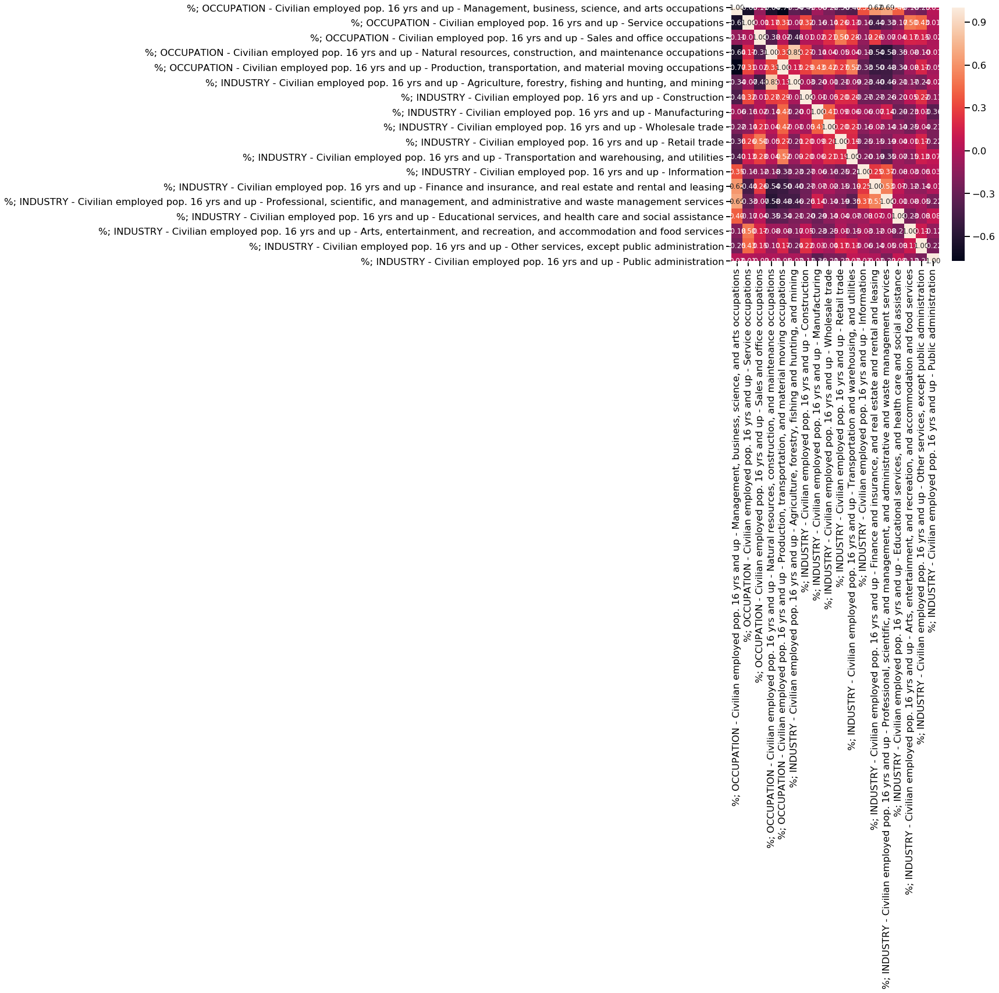

<IPython.core.display.Javascript object>

In [67]:
# Occupational and industry columns
fig, ax = plt.subplots(figsize=(8, 8))
sns.heatmap(
    df_state_info_gs_census[col_census_pct_occ + col_census_pct_industry].corr(
        method="pearson"
    ),
    annot=True,
    fmt="0.2f",
)

In [68]:
df_state_info_gs_census[col_census_pct_occ + col_census_pct_industry].corr(
    method="pearson"
)

,"%; OCCUPATION - Civilian employed pop. 16 yrs and up - Management, business, science, and arts occupations",%; OCCUPATION - Civilian employed pop. 16 yrs and up - Service occupations,%; OCCUPATION - Civilian employed pop. 16 yrs and up - Sales and office occupations,"%; OCCUPATION - Civilian employed pop. 16 yrs and up - Natural resources, construction, and maintenance occupations","%; OCCUPATION - Civilian employed pop. 16 yrs and up - Production, transportation, and material moving occupations","%; INDUSTRY - Civilian employed pop. 16 yrs and up - Agriculture, forestry, fishing and hunting, and mining",%; INDUSTRY - Civilian employed pop. 16 yrs and up - Construction,%; INDUSTRY - Civilian employed pop. 16 yrs and up - Manufacturing,%; INDUSTRY - Civilian employed pop. 16 yrs and up - Wholesale trade,%; INDUSTRY - Civilian employed pop. 16 yrs and up - Retail trade,"%; INDUSTRY - Civilian employed pop. 16 yrs and up - Transportation and warehousing, and utilities",%; INDUSTRY - Civilian employed pop. 16 yrs and up - Information,"%; INDUSTRY - Civilian employed pop. 16 yrs and up - Finance and insurance, and real estate and rental and leasing","%; INDUSTRY - Civilian employed pop. 16 yrs and up - Professional, scientific, and management, and administrative and waste management services","%; INDUSTRY - Civilian employed pop. 16 yrs and up - Educational services, and health care and social assistance","%; INDUSTRY - Civilian employed pop. 16 yrs and up - Arts, entertainment, and recreation, and accommodation and food services","%; INDUSTRY - Civilian employed pop. 16 yrs and up - Other services, except public administration",%; INDUSTRY - Civilian employed pop. 16 yrs and up - Public administration
"%; OCCUPATION - Civilian employed pop. 16 yrs and up - Management, business, science, and arts occupations",1.000000,-0.651119,-0.112866,-0.637251,-0.772026,-0.336756,-0.412884,-0.064357,-0.216176,-0.359250,-0.401320,0.354922,0.619367,0.686628,0.402354,-0.181746,-0.251939,0.029640
%; OCCUPATION - Civilian employed pop. 16 yrs and up - Service occupations,-0.651119,1.000000,-0.005824,0.171893,0.314625,-0.065766,0.317193,-0.158169,-0.144442,0.263628,0.128541,-0.162298,-0.443095,-0.326043,-0.173869,0.496177,0.433081,0.012932
%; OCCUPATION - Civilian employed pop. 16 yrs and up - Sales and office occupations,-0.112866,-0.005824,1.000000,-0.377559,0.019558,-0.476017,0.008806,0.019921,0.210372,0.496428,0.284236,-0.123303,0.262218,-0.068594,0.036469,0.167170,0.149692,-0.015600
"%; OCCUPATION - Civilian employed pop. 16 yrs and up - Natural resources, construction, and maintenance occupations",-0.637251,0.171893,-0.377559,1.000000,0.327353,0.846018,0.274436,-0.139901,0.038191,-0.051668,0.038276,-0.183049,-0.535469,-0.579994,-0.351597,-0.075552,-0.099985,-0.009806
"%; OCCUPATION - Civilian employed pop. 16 yrs and up - Production, transportation, and material moving occupations",-0.772026,0.314625,0.019558,0.327353,1.000000,0.132925,0.287661,0.430231,0.415384,0.270263,0.521042,-0.330199,-0.500786,-0.481135,-0.335958,-0.078284,0.170713,-0.054744
"%; INDUSTRY - Civilian employed pop. 16 yrs and up - Agriculture, forestry, fishing and hunting, and mining",-0.336756,-0.065766,-0.476017,0.846018,0.132925,1.000000,-0.034049,-0.197875,-0.006528,-0.205810,-0.093545,-0.231081,-0.401008,-0.457953,-0.214443,-0.172716,-0.236332,-0.021795
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Construction,-0.412884,0.317193,0.008806,0.274436,0.287661,-0.034049,1.000000,-0.006547,-0.051895,0.200251,0.195629,-0.271239,-0.271492,-0.257875,-0.196911,0.052843,0.224600,-0.112985
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Manufacturing,-0.064357,-0.158169,0.019921,-0.139901,0.430231,-0.197875,-0.006547,1.000000,0.408274,0.085309,0.061410,-0.058021,-0.067525,0.137603,-0.285511,-0.225374,0.033621,-0.363136
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Wholesale trade,-0.216176,-0.144442,0.210372,0.038191,0.415384,-0.006528,-0.051895,0.408274,1.00

<IPython.core.display.Javascript object>

**I'll keep the industry columns but drop the occupation columns. The former is more variable and has fewer correlations/anti-correlations.**

In [69]:
col_census_pct_industry_final = col_census_pct_industry.copy()

<IPython.core.display.Javascript object>

#### Worker class columns

In [70]:
col_census_pct_workerclass = col_census_pct[
    df_state_info_gs_census[col_census_pct].columns.str.contains("WORKER_CLASS")
].tolist()

df_state_info_gs_census[col_census_pct_workerclass].corr(method="pearson")

,%; WORKER_CLASS - Civilian employed pop. 16 yrs and up - Private wage and salary workers,%; WORKER_CLASS - Civilian employed pop. 16 yrs and up - Government workers,%; WORKER_CLASS - Civilian employed pop. 16 yrs and up - Self-employed in own not incorporated business workers,%; WORKER_CLASS - Civilian employed pop. 16 yrs and up - Unpaid family workers
%; WORKER_CLASS - Civilian employed pop. 16 yrs and up - Private wage and salary workers,1.000000,-0.855091,-0.424615,-0.223774
%; WORKER_CLASS - Civilian employed pop. 16 yrs and up - Government workers,-0.855091,1.000000,-0.084067,0.050251
%; WORKER_CLASS - Civilian employed pop. 16 yrs and up - Self-employed in own not incorporated business workers,-0.424615,-0.084067,1.000000,0.072156
%; WORKER_CLASS - Civilian employed pop. 16 yrs and up - Unpaid family workers,-0.223774,0.050251,0.072156,1.000000


<IPython.core.display.Javascript object>

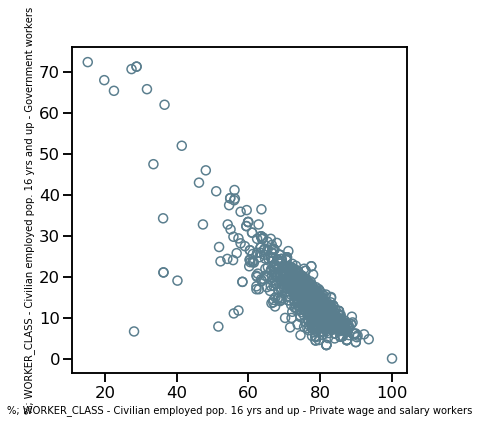

<IPython.core.display.Javascript object>

In [71]:
# Scatter plots - do I need percent and estimated income benefit columns?
f, (ax1) = plt.subplots(1, 1, figsize=(6, 6))
scatter_plot_open_circles(
    df_state_info_gs_census,
    "%; WORKER_CLASS - Civilian employed pop. 16 yrs and up - Private wage and salary workers",
    "%; WORKER_CLASS - Civilian employed pop. 16 yrs and up - Government workers",
    ax1,
)

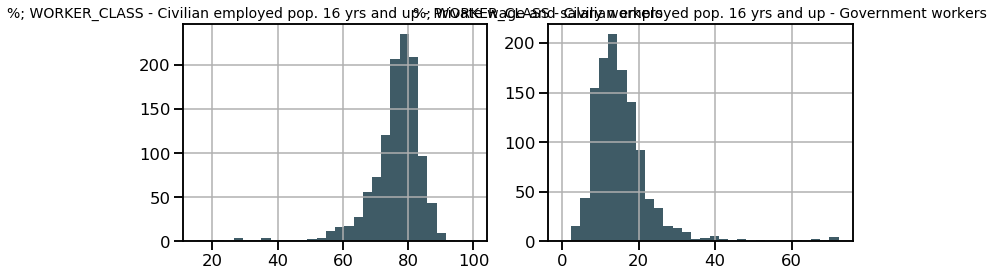

<IPython.core.display.Javascript object>

In [72]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))

hist_plot(
    df_state_info_gs_census,
    "%; WORKER_CLASS - Civilian employed pop. 16 yrs and up - Private wage and salary workers",
    ax1,
)

hist_plot(
    df_state_info_gs_census,
    "%; WORKER_CLASS - Civilian employed pop. 16 yrs and up - Government workers",
    ax2,
)

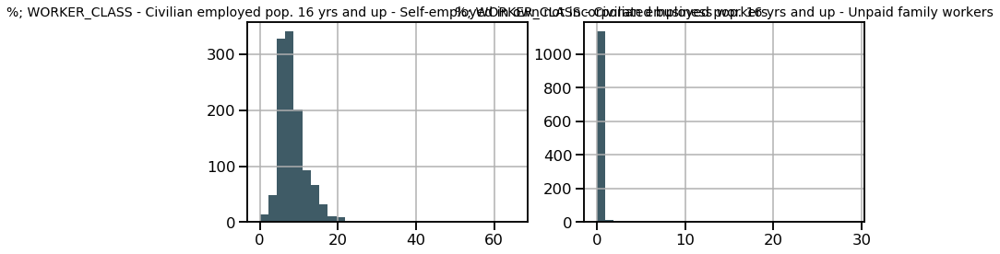

<IPython.core.display.Javascript object>

In [73]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))

hist_plot(
    df_state_info_gs_census,
    "%; WORKER_CLASS - Civilian employed pop. 16 yrs and up - Self-employed in own not incorporated business workers",
    ax1,
)

hist_plot(
    df_state_info_gs_census,
    "%; WORKER_CLASS - Civilian employed pop. 16 yrs and up - Unpaid family workers",
    ax2,
)

**Drop government workers since they're highly correlated with private wage and salary workers. Also drop Unpaid family workers since they're pretty rare.**

In [74]:
col_census_pct_workerclass_final = [
    "%; WORKER_CLASS - Civilian employed pop. 16 yrs and up - Private wage and salary workers",
    "%; WORKER_CLASS - Civilian employed pop. 16 yrs and up - Self-employed in own not incorporated business workers",
]

<IPython.core.display.Javascript object>

#### Employment status columns

In [75]:
col_census_pct_employstatus = col_census_pct[
    df_state_info_gs_census[col_census_pct].columns.str.contains("EMPLOY_STATUS")
].tolist()

df_state_info_gs_census[col_census_pct_employstatus].corr(method="pearson")

,%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force,%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force - Civilian labor force,%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force - Civilian labor force - Employed,%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force - Civilian labor force - Unemployed,%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force - Armed Forces,%; EMPLOY_STATUS - Pop. 16 yrs and up - Not in labor force,%; EMPLOY_STATUS - Civilian labor force - Unemployment Rate,%; EMPLOY_STATUS - Females 16 yrs and up - In labor force,%; EMPLOY_STATUS - Females 16 yrs and up - In labor force - Civilian labor force,%; EMPLOY_STATUS - Females 16 yrs and up - In labor force - Civilian labor force - Employed,%; EMPLOY_STATUS - Own children of the householder under 6 yrs - All parents in family in labor force,%; EMPLOY_STATUS - Own children of the householder 6 to 17 yrs - All parents in family in labor force
%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force,1.000000,0.980370,0.940891,0.009738,0.076908,-1.000000,-0.333101,0.816019,0.811268,0.763717,0.251985,0.337010
%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force - Civilian labor force,0.980370,1.000000,0.954733,0.026683,-0.121120,-0.980370,-0.322781,0.806772,0.813365,0.763647,0.275864,0.339235
%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force - Civilian labor force - Employed,0.940891,0.954733,1.000000,-0.271813,-0.090588,-0.940891,-0.586093,0.792304,0.796778,0.838028,0.280439,0.345632
%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force - Civilian labor force - Unemployed,0.009738,0.026683,-0.271813,1.000000,-0.087336,-0.009738,0.925408,-0.052375,-0.046089,-0.345300,-0.048061,-0.061140
%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force - Armed Forces,0.076908,-0.121120,-0.090588,-0.087336,1.000000,-0.076908,-0.046006,0.028574,-0.028693,-0.016118,-0.124341,-0.019294
%; EMPLOY_STATUS - Pop. 16 yrs and up - Not in labor force,-1.000000,-0.980370,-0.940891,-0.009738,-0.076908,1.000000,0.333101,-0.816019,-0.811268,-0.763717,-0.251985,-0.337010
%; EMPLOY_STATUS - Civilian labor force - Unemployment Rate,-0.333101,-0.322781,-0.586093,0.925408,-0.046006,0.333101,1.000000,-0.311368,-0.306947,-0.570974,-0.134355,-0.190993
%; EMPLOY_STATUS - Females 16 yrs and up - In labor force,0.816019,0.806772,0.792304,-0.052375,0.028574,-0.816019,-0.311368,1.000000,0.997781,0.928405,0.407410,0.501666
%; EMPLOY_STATUS - Females 16 yrs and up - In labor force - Civilian labor force,0.811268,0.813365,0.796778,-0.046089,-0.028693,-0.811268,-0.306947,0.997781,1.000000,0.928807,0.413591,0.503153
%; EMPLOY_STATUS - Females 16 yrs and up - In labor force - Civilian labor force - Employed,0.763717,0.763647,0.838028,-0.345300,-0.016118,-0.763717,-0.570974,0.928405,0.928807,1.000000,0.403864,0.490307


<IPython.core.display.Javascript object>

In [76]:
col_census_pct_employstatus

['%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force',
 '%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force - Civilian labor force',
 '%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force - Civilian labor force - Employed',
 '%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force - Civilian labor force - Unemployed',
 '%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force - Armed Forces',
 '%; EMPLOY_STATUS - Pop. 16 yrs and up - Not in labor force',
 '%; EMPLOY_STATUS - Civilian labor force - Unemployment Rate',
 '%; EMPLOY_STATUS - Females 16 yrs and up - In labor force',
 '%; EMPLOY_STATUS - Females 16 yrs and up - In labor force - Civilian labor force',
 '%; EMPLOY_STATUS - Females 16 yrs and up - In labor force - Civilian labor force - Employed',
 '%; EMPLOY_STATUS - Own children of the householder under 6 yrs - All parents in family in labor force',
 '%; EMPLOY_STATUS - Own children of the householder 6 to 17 yrs - All parents in family in labor force']

<IPython.core.display.Javascript object>

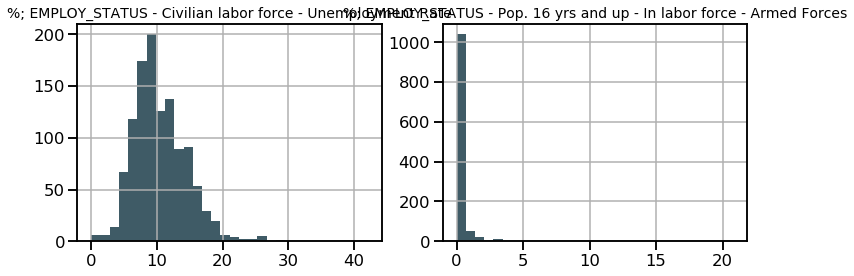

<IPython.core.display.Javascript object>

In [77]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))

hist_plot(
    df_state_info_gs_census,
    "%; EMPLOY_STATUS - Civilian labor force - Unemployment Rate",
    ax1,
)

hist_plot(
    df_state_info_gs_census,
    "%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force - Armed Forces",
    ax2,
)

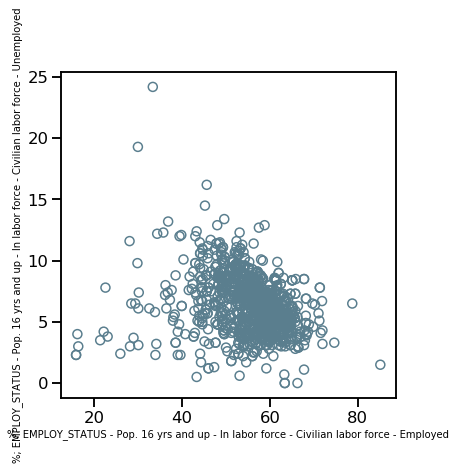

<IPython.core.display.Javascript object>

In [78]:
# Note - I don't entirely understand why
# "In labor force - Civilian labor force - Employed and Civilian labor force" and "Unemployment Rate" are not anti-correlated
# I'll keep only the latter

f, (ax1) = plt.subplots(1, 1, figsize=(6, 6))
scatter_plot_open_circles(
    df_state_info_gs_census,
    "%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force - Civilian labor force - Employed",
    "%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force - Civilian labor force - Unemployed",
    ax1,
)

In [79]:
col_census_pct_employstatus_final = [
    "%; EMPLOY_STATUS - Pop. 16 yrs and up - Not in labor force",
    "%; EMPLOY_STATUS - Civilian labor force - Unemployment Rate",
    "%; EMPLOY_STATUS - Females 16 yrs and up - In labor force - Civilian labor force - Employed",
    "%; EMPLOY_STATUS - Own children of the householder 6 to 17 yrs - All parents in family in labor force",
]

<IPython.core.display.Javascript object>

In [80]:
df_state_info_gs_census[col_census_pct_employstatus_final].corr(method="pearson")

,%; EMPLOY_STATUS - Pop. 16 yrs and up - Not in labor force,%; EMPLOY_STATUS - Civilian labor force - Unemployment Rate,%; EMPLOY_STATUS - Females 16 yrs and up - In labor force - Civilian labor force - Employed,%; EMPLOY_STATUS - Own children of the householder 6 to 17 yrs - All parents in family in labor force
%; EMPLOY_STATUS - Pop. 16 yrs and up - Not in labor force,1.000000,0.333101,-0.763717,-0.337010
%; EMPLOY_STATUS - Civilian labor force - Unemployment Rate,0.333101,1.000000,-0.570974,-0.190993
%; EMPLOY_STATUS - Females 16 yrs and up - In labor force - Civilian labor force - Employed,-0.763717,-0.570974,1.000000,0.490307
%; EMPLOY_STATUS - Own children of the householder 6 to 17 yrs - All parents in family in labor force,-0.337010,-0.190993,0.490307,1.000000


<IPython.core.display.Javascript object>

/Users/lacar/anaconda/envs/insight/lib/python3.6/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Users/lacar/anaconda/envs/insight/lib/python3.6/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


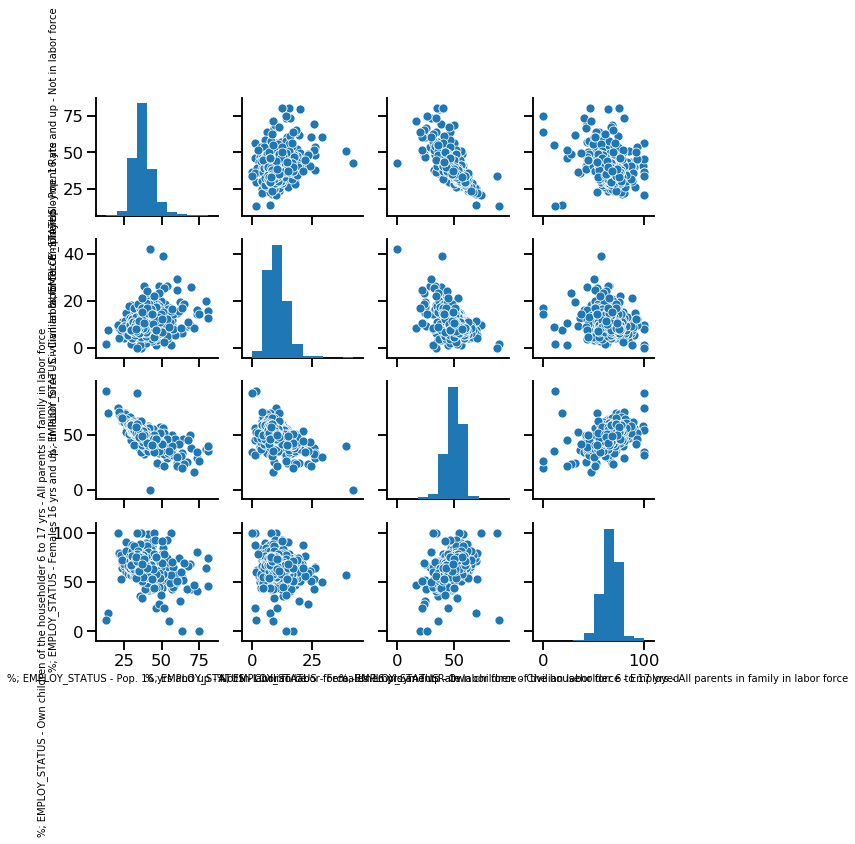

<IPython.core.display.Javascript object>

In [81]:
sns.pairplot(df_state_info_gs_census[col_census_pct_employstatus_final])

#### Percentage of families below poverty line columns

In [82]:
col_census_pct_povertyline = col_census_pct[
    df_state_info_gs_census[col_census_pct].columns.str.contains(
        "AGE_FAMILIES_INCOME_BELOW_POVERTY"
    )
].tolist()

df_state_info_gs_census[col_census_pct_povertyline].corr(method="pearson")

,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - All families,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - All families - w/ related children of the householder <18 yrs,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - Married couple families,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - Married couple families - w/ related children of the householder <18 yrs,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - All people,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - Under 18 yrs,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - Under 18 yrs - Related children of the householder <18 yrs,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - Under 18 yrs - Related children of the householder <18 yrs - Related children of the householder 5 to 17 yrs,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - 18 yrs and up,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - 18-64 yrs,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - 65 yrs and up,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - 65 yrs and up - People in families,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - 65 yrs and up - Unrelated individuals 15 yrs and up
%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - All families,1.000000,0.954137,0.926511,0.873690,0.938880,0.937910,0.938793,0.909696,0.888291,0.863695,0.665770,0.985584,0.665761
%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - All families - w/ related children of the householder <18 yrs,0.954137,1.000000,0.862861,0.889190,0.924765,0.976169,0.976855,0.935318,0.863638,0.860427,0.598186,0.962573,0.636493
%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - Married couple families,0.926511,0.862861,1.000000,0.929360,0.883640,0.873200,0.875453,0.873852,0.838648,0.802205,0.694139,0.927728,0.646620
%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - Married couple families - w/ related children of the householder <18 yrs,0.873690,0.889190,0.929360,1.000000,0.858592,0.897362,0.900181,0.896312,0.800083,0.788392,0.593411,0.905739,0.603573
%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - All people,0.938880,0.924765,0.883640,0.858592,1.000000,0.931017,0.929077,0.913223,0.982513,0.970192,0.652274,0.952240,0.774758
%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - Under 18 yrs,0.937910,0.976169,0.873200,0.897362,0.931017,1.000000,0.999361,0.974867,0.857546,0.847453,0.601294,0.967610,0.645443
%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - Under 18 yrs - Related children of the householder <18 yrs,0.938793,0.976855,0.875453,0.900181,0.929077,0.999361,1.000000,0.975530,0.855046,0.844835,0.603596,0.968728,0.640694
%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - Under 18 yrs - Related children of the householder <18 yrs - Related children of the householder 5 to 17 yrs,0.909696,0.935318,0.873852,0.896312,0.913223,0.974867,0.975530,1.000000,0.842408,0.824887,0.622359,0.946449,0.631928
%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - 18 yrs and up,0.888291,0.863638,0.838648,0.800083,0.982513,0.857546,0.855046,0.842408,1.000000,0.988064,0.660488,0.894300,0.794230
%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - 18-64 yrs,0.863695,0.860427,0.802205,0.788392,0.970192,0.847453,0.844835,0.824887,0.988064,1.000000,0.562505,0.875900,0.792789


<IPython.core.display.Javascript object>

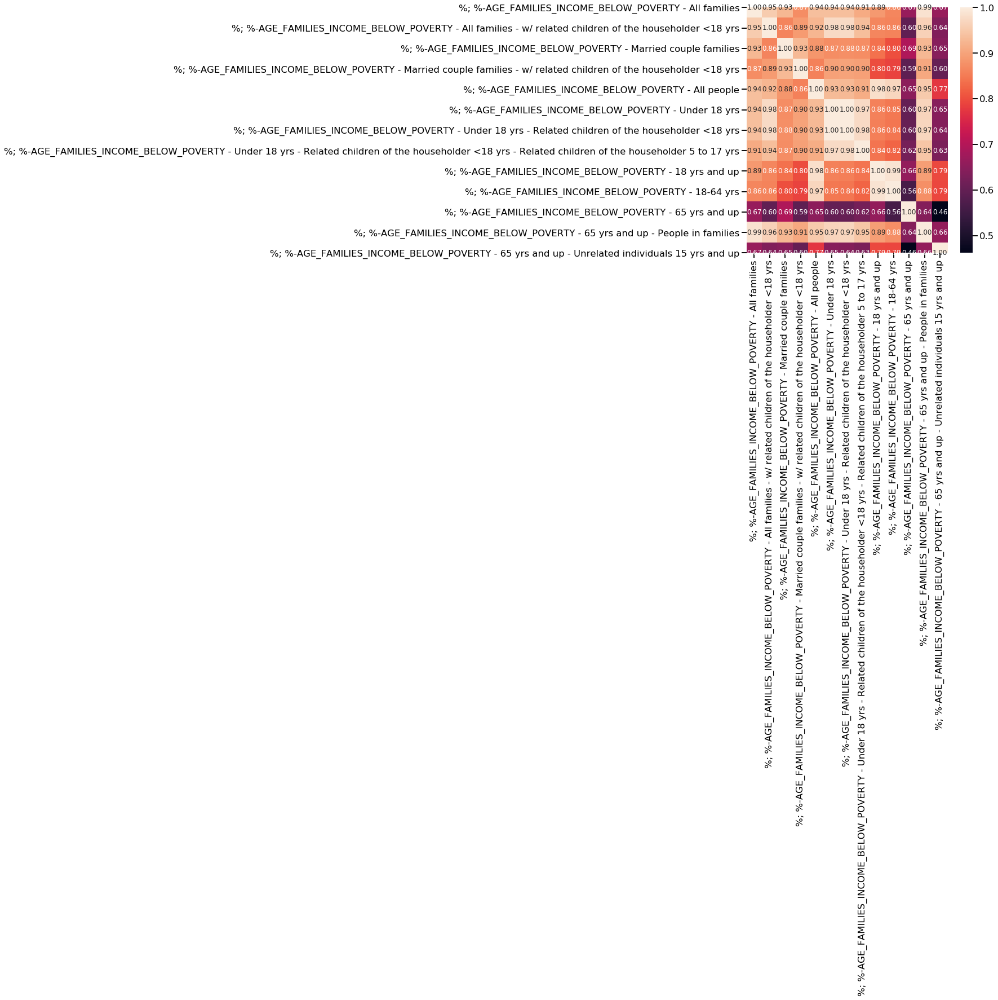

<IPython.core.display.Javascript object>

In [83]:
# Below poverty line columns
fig, ax = plt.subplots(figsize=(8, 8))
sns.heatmap(
    df_state_info_gs_census[col_census_pct_povertyline].corr(method="pearson"),
    annot=True,
    fmt="0.2f",
)

In [84]:
# Just keep this simple - pick one element that's mostly correlated with the others
col_census_pct_povertyline_final = [
    "%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - All families"
]

<IPython.core.display.Javascript object>

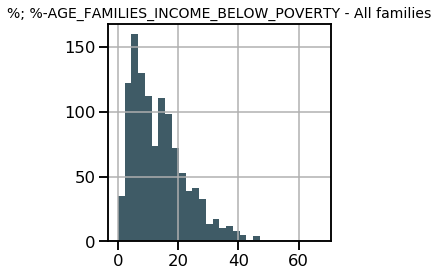

<IPython.core.display.Javascript object>

In [85]:
f, (ax1) = plt.subplots(1, 1, figsize=(4, 4))

hist_plot(
    df_state_info_gs_census,
    "%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - All families",
    ax1,
)



#### Combine final census features, check for other correlations

Before filtering:
- INCOME_BENEFITS - percentage (28 columns) - check for redundant columns and correlated and anti-correlated features
- INCOME_BENEFITS - estimated values - (12 columns) - manually select features
- HEALTH_INS_COVERAGE (17 columns) - manually select columns
- WORK_COMMUTE - adds to 100% (6 columns) - interesting to keep, but drop rare categories
- OCCUPATION - adds to 100% (5 columns) - perhaps drop - may be redundant with industry
- INDUSTRY - adds to 100% (13 columns) - interesting to keep but inspect
- WORKER_CLASS - adds to 100% (4 columns) - OK to keep but inspect
- EMPLOY_STATUS - (12 columns) - OK to keep but inspect
- %-AGE_FAMILIES_INCOME_BELOW_POVERTY (13 columns) - follow up

After filtering:
- INCOME_BENEFITS - percentage (3 columns)
- INCOME_BENEFITS - estimated values - (3 columns)
- HEALTH_INS_COVERAGE (3 columns)
- WORK_COMMUTE - (5 columns)
- OCCUPATION - (0 columns)
- INDUSTRY - (13 columns)
- WORKER_CLASS - (2 columns)
- EMPLOY_STATUS - (4 columns)
- %-AGE_FAMILIES_INCOME_BELOW_POVERTY (1 columns)

In [86]:
print(
    "\n income benefits, percentage - ",
    len(col_census_pct_ib_final),
    "\n income benefits, estimated - ",
    len(col_census_est_ib_final),
    "\n health insurance - ",
    len(col_census_pct_hi_final),
    "\n work commute - ",
    len(col_census_pct_wc_final),
    "\n industry - ",
    len(col_census_pct_industry_final),
    "\n worker class - ",
    len(col_census_pct_workerclass_final),
    "\n employment status - ",
    len(col_census_pct_employstatus_final),
    "\n percent below poverty line - ",
    len(col_census_pct_povertyline_final),
)


 income benefits, percentage -  3 
 income benefits, estimated -  3 
 health insurance -  3 
 work commute -  5 
 industry -  13 
 worker class -  2 
 employment status -  4 
 percent below poverty line -  1


<IPython.core.display.Javascript object>

In [87]:
census_col_final = (
    col_census_pct_ib_final
    + col_census_est_ib_final
    + col_census_pct_hi_final
    + col_census_pct_wc_final
    + col_census_pct_industry_final
    + col_census_pct_workerclass_final
    + col_census_pct_employstatus_final
    + col_census_pct_povertyline_final
)

<IPython.core.display.Javascript object>

In [88]:
col_census_pct_wc_final

['%; WORK_COMMUTE - Workers 16 yrs and up - Car, truck, or van -- drove alone',
 '%; WORK_COMMUTE - Workers 16 yrs and up - Car, truck, or van -- carpooled',
 '%; WORK_COMMUTE - Workers 16 yrs and up - Public transportation (excluding taxicab)',
 '%; WORK_COMMUTE - Workers 16 yrs and up - Walked',
 '%; WORK_COMMUTE - Workers 16 yrs and up - Worked at home']

<IPython.core.display.Javascript object>

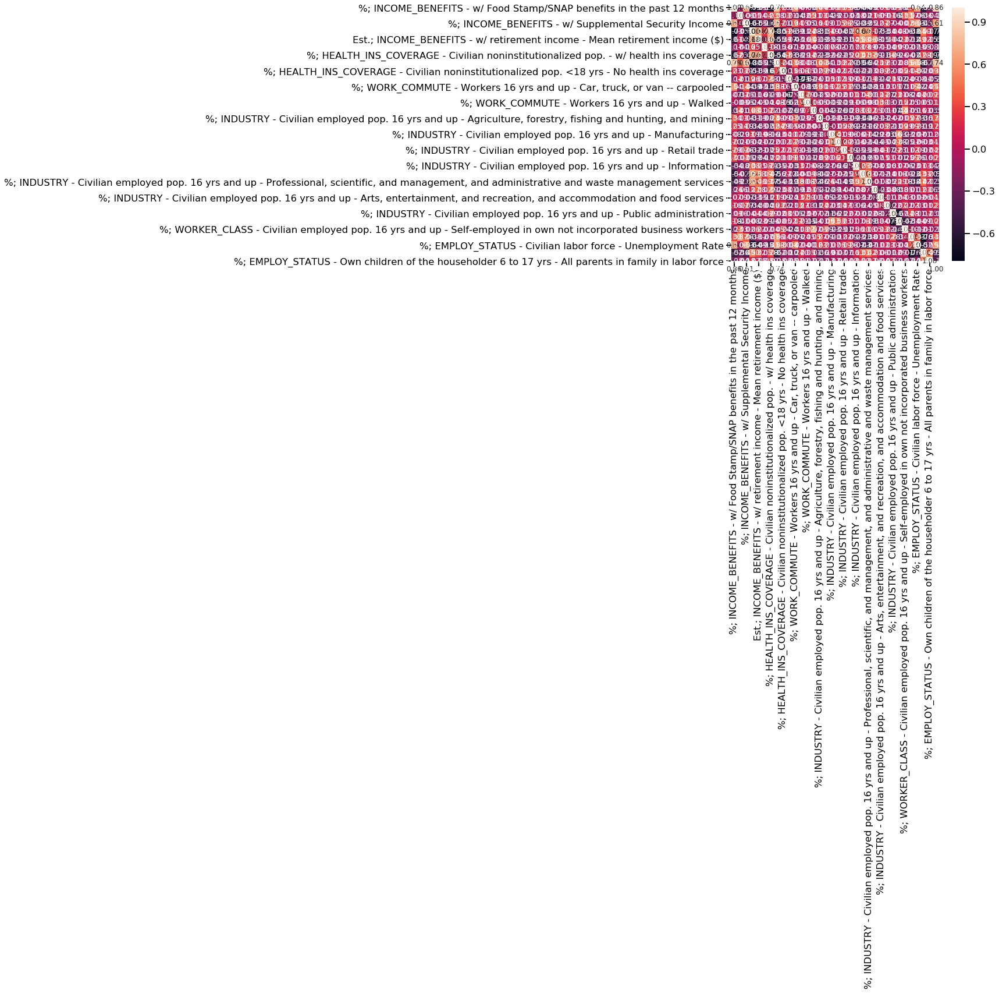

<IPython.core.display.Javascript object>

In [89]:
fig, ax = plt.subplots(figsize=(8, 8))
sns.heatmap(
    df_state_info_gs_census[census_col_final].corr(method="pearson"),
    annot=True,
    fmt="0.2f",
)

In [90]:
df_state_info_gs_census[census_col_final].corr(method="pearson")

,%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefits in the past 12 months,%; INCOME_BENEFITS - w/ Social Security,%; INCOME_BENEFITS - w/ Supplemental Security Income,Est.; INCOME_BENEFITS - Total households - Median household income ($),Est.; INCOME_BENEFITS - w/ retirement income - Mean retirement income ($),Est.; INCOME_BENEFITS - w/ cash public assistance income - Mean cash public assistance income ($),%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage,%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage - w/ public coverage,%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. <18 yrs - No health ins coverage,"%; WORK_COMMUTE - Workers 16 yrs and up - Car, truck, or van -- drove alone",...,"%; INDUSTRY - Civilian employed pop. 16 yrs and up - Arts, entertainment, and recreation, and accommodation and food services","%; INDUSTRY - Civilian employed pop. 16 yrs and up - Other services, except public administration",%; INDUSTRY - Civilian employed pop. 16 yrs and up - Public administration,%; WORKER_CLASS - Civilian employed pop. 16 yrs and up - Private wage and salary workers,%; WORKER_CLASS - Civilian employed pop. 16 yrs and up - Self-employed in own not incorporated business workers,%; EMPLOY_STATUS - Pop. 16 yrs and up - Not in labor force,%; EMPLOY_STATUS - Civilian labor force - Unemployment Rate,%; EMPLOY_STATUS - Females 16 yrs and up - In labor force - Civilian labor force - Employed,%; EMPLOY_STATUS - Own children of the householder 6 to 17 yrs - All parents in family in labor force,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - All families
%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefits in the past 12 months,1.000000,-0.099427,0.653882,-0.729109,-0.614616,-0.167118,-0.619386,0.785270,0.234384,-0.144824,...,0.069423,0.163684,-0.090993,0.176016,-0.234750,0.304361,0.641352,-0.524672,-0.276435,0.863977
%; INCOME_BENEFITS - w/ Social Security,-0.099427,1.000000,0.062799,-0.045917,0.144984,0.041529,0.233592,0.376184,0.025823,0.208717,...,0.093868,-0.008892,0.156389,-0.408687,0.331265,0.571346,0.063432,-0.358291,-0.042409,-0.156829
%; INCOME_BENEFITS - w/ Supplemental Security Income,0.653882,0.062799,1.000000,-0.668726,-0.552836,-0.158848,-0.472583,0.692272,0.209045,-0.191171,...,0.071791,0.267682,-0.041353,-0.004280,-0.020921,0.360665,0.527050,-0.445359,-0.175205,0.609095
Est.; INCOME_BENEFITS - Total households - Median household income ($),-0.729109,-0.045917,-0.668726,1.000000,0.678153,0.251763,0.740037,-0.796097,-0.507022,0.258780,...,-0.328565,-0.342622,-0.037376,0.075379,0.062518,-0.380201,-0.637943,0.500448,0.174871,-0.778418
Est.; INCOME_BENEFITS - w/ retirement income - Mean retirement income ($),-0.614616,0.144984,-0.552836,0.678153,1.000000,0.157658,0.669048,-0.554159,-0.389431,0.169459,...,-0.153798,-0.302773,0.138518,-0.233325,0.215287,-0.121804,-0.493916,0.322639,0.153570,-0.632089
Est.; INCOME_BENEFITS - w/ cash public assistance income - Mean cash public assistance income ($),-0.167118,0.041529,-0.158848,0.251763,0.157658,1.000000,0.184730,-0.152103,-0.164433,0.072358,...,-0.108308,-0.044231,-0.086368,0.085013,0.019195,-0.065615,-0.151299,0.051408,-0.077360,-0.162449
%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage,-0.619386,0.233592,-0.472583,0.740037,0.669048,0.184730,1.000000,-0.540853,-0.609231,0.327137,...,-0.212650,-0.358661,0.290064,-0.264410,-0.041072,-0.065481,-0.412128,0.284284,0.187646,-0.728354
%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage - w/ public coverage,0.785270,0.376184,0.692272,-0.796097,-0.554159,-0.152103,-0.540853,1.000000,0.242434,-0.146072,...,0.189111,0.225574,-0.021502,-0.081656,0.053830,0.557709,0.578243,-0.620097,-0.281216,0.741289
%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. <18 yrs - No health ins coverage,0.234384,0.025823,0.209045,-0.507022,-0.389431,-0.164433,-0.609231,0.242434,1.000000,-0.147483,...,0.087036,0.216

<IPython.core.display.Javascript object>

In [91]:
print("No. of census features ", len(census_col_final))

No. of census features  34


<IPython.core.display.Javascript object>

In [92]:
df_state_info_gs_census[census_col_final[0:2]].corr(method="pearson")

,%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefits in the past 12 months,%; INCOME_BENEFITS - w/ Social Security
%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefits in the past 12 months,1.000000,-0.099427
%; INCOME_BENEFITS - w/ Social Security,-0.099427,1.000000


<IPython.core.display.Javascript object>

In [93]:
def melt_corr_df(df_corr):
    df = df_corr.where(np.triu(np.ones(df_corr.shape)).astype(np.bool))
    df = df.stack().reset_index()
    df.columns = ["Row", "Column", "Pearson r"]

    # Remove self-correlated Pearson r
    df = df[df["Pearson r"] != 1].copy()

    return df

<IPython.core.display.Javascript object>

In [94]:
df_corr_melted_census = melt_corr_df(
    df_state_info_gs_census[census_col_final].corr(method="pearson")
)

<IPython.core.display.Javascript object>

In [95]:
df_corr_melted_census.sort_values(by="Pearson r", ascending=False).head(10)

,Row,Column,Pearson r
33,%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefi...,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - All f...,0.863977
7,%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefi...,%; HEALTH_INS_COVERAGE - Civilian noninstituti...,0.785270
243,%; HEALTH_INS_COVERAGE - Civilian noninstituti...,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - All f...,0.741289
102,Est.; INCOME_BENEFITS - Total households - Med...,%; HEALTH_INS_COVERAGE - Civilian noninstituti...,0.740037
72,%; INCOME_BENEFITS - w/ Supplemental Security ...,%; HEALTH_INS_COVERAGE - Civilian noninstituti...,0.692272
100,Est.; INCOME_BENEFITS - Total households - Med...,Est.; INCOME_BENEFITS - w/ retirement income -...,0.678153
132,Est.; INCOME_BENEFITS - w/ retirement income -...,%; HEALTH_INS_COVERAGE - Civilian noninstituti...,0.669048
2,%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefi...,%; INCOME_BENEFITS - w/ Supplemental Security ...,0.653882
30,%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefi...,%; EMPLOY_STATUS - Civilian labor force - Unem...,0.641352
117,Est.; INCOME_BENEFITS - Total households - Med...,%; INDUSTRY - Civilian employed pop. 16 yrs an...,0.636850


<IPython.core.display.Javascript object>

In [96]:
df_corr_melted_census.sort_values(by="Pearson r", ascending=False).tail(10)

,Row,Column,Pearson r
159,Est.; INCOME_BENEFITS - w/ retirement income -...,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - All f...,-0.632089
126,Est.; INCOME_BENEFITS - Total households - Med...,%; EMPLOY_STATUS - Civilian labor force - Unem...,-0.637943
68,%; INCOME_BENEFITS - w/ Supplemental Security ...,Est.; INCOME_BENEFITS - Total households - Med...,-0.668726
560,%; INDUSTRY - Civilian employed pop. 16 yrs an...,%; WORKER_CLASS - Civilian employed pop. 16 yr...,-0.674441
216,%; HEALTH_INS_COVERAGE - Civilian noninstituti...,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - All f...,-0.728354
3,%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefi...,Est.; INCOME_BENEFITS - Total households - Med...,-0.729109
272,"%; WORK_COMMUTE - Workers 16 yrs and up - Car,...",%; WORK_COMMUTE - Workers 16 yrs and up - Publ...,-0.748350
582,%; EMPLOY_STATUS - Pop. 16 yrs and up - Not in...,%; EMPLOY_STATUS - Females 16 yrs and up - In ...,-0.763717
129,Est.; INCOME_BENEFITS - Total households - Med...,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - All f...,-0.778418
103,Est.; INCOME_BENEFITS - Total households - Med...,%; HEALTH_INS_COVERAGE - Civilian noninstituti...,-0.796097


<IPython.core.display.Javascript object>

In [97]:
# I'll drop the poverty line element since it correlates with % of families with food stamps and it's not actionable
census_col_final_filt = (
    col_census_pct_ib_final
    + col_census_est_ib_final
    + col_census_pct_hi_final
    + col_census_pct_wc_final
    + col_census_pct_industry_final
    + col_census_pct_workerclass_final
    + col_census_pct_employstatus_final
)

<IPython.core.display.Javascript object>

In [98]:
len(census_col_final_filt)

33

<IPython.core.display.Javascript object>

### Update features - focus on actionable features

4/4/20: added enrollment (school size)

In [99]:
all_features_filt_wcensuscheck = census_col_final_filt + [
    "enrollment",
    "pct_LI_students",
    "Magnet_cat_encoded",
    "Charter_cat_encoded",
    "college_readiness",
    "students_per_teacher",
    "students_per_counselor",
    "pct_teachers_3years_or_more",
    "pct_teachers_who_r_certified",
    "avg_teacher_salary",
    "test_score_rating_LIstudents",
    "test_score_rating_notLIstudents",
    "test_scores_english_LIstudents",
    "test_scores_math_LIstudents",
    "test_scores_math_LIstudents_n_students",
    "graduation_rates_gradRates_eligibility_allStudents",
    "graduation_rates_gradRates_eligibility_LIstudents",
    "graduation_rates_UCCSU_eligibility_allStudents",
    "graduation_rates_UCCSU_eligibility_LIstudents",
]

<IPython.core.display.Javascript object>

In [100]:
len(all_features_filt_wcensuscheck)

52

<IPython.core.display.Javascript object>

In [101]:
df_state_info_gs_census_corr = melt_corr_df(
    df_state_info_gs_census[all_features_filt_wcensuscheck].corr(method="pearson")
)

<IPython.core.display.Javascript object>

In [102]:
df_state_info_gs_census_corr.sort_values(by="Pearson r", ascending=False).head(20)

,Row,Column,Pearson r
1334,test_score_rating_LIstudents,test_score_rating_notLIstudents,0.985217
1369,graduation_rates_gradRates_eligibility_allStud...,graduation_rates_gradRates_eligibility_LIstudents,0.984875
1376,graduation_rates_UCCSU_eligibility_allStudents,graduation_rates_UCCSU_eligibility_LIstudents,0.926377
7,%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefi...,%; HEALTH_INS_COVERAGE - Civilian noninstituti...,0.785270
1351,test_scores_english_LIstudents,test_scores_math_LIstudents,0.763117
156,Est.; INCOME_BENEFITS - Total households - Med...,%; HEALTH_INS_COVERAGE - Civilian noninstituti...,0.740037
108,%; INCOME_BENEFITS - w/ Supplemental Security ...,%; HEALTH_INS_COVERAGE - Civilian noninstituti...,0.692272
154,Est.; INCOME_BENEFITS - Total households - Med...,Est.; INCOME_BENEFITS - w/ retirement income -...,0.678153
1202,enrollment,test_scores_math_LIstudents_n_students,0.674502
204,Est.; INCOME_BENEFITS - w/ retirement income -...,%; HEALTH_INS_COVERAGE - Civilian noninstituti...,0.669048


<IPython.core.display.Javascript object>

In [103]:
df_state_info_gs_census_corr.sort_values(by="Pearson r", ascending=False).tail(20)

,Row,Column,Pearson r
357,%; HEALTH_INS_COVERAGE - Civilian noninstituti...,%; INDUSTRY - Civilian employed pop. 16 yrs an...,-0.560158
1126,%; EMPLOY_STATUS - Civilian labor force - Unem...,%; EMPLOY_STATUS - Females 16 yrs and up - In ...,-0.570974
37,%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefi...,college_readiness,-0.585722
299,%; HEALTH_INS_COVERAGE - Civilian noninstituti...,%; HEALTH_INS_COVERAGE - Civilian noninstituti...,-0.609231
4,%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefi...,Est.; INCOME_BENEFITS - w/ retirement income -...,-0.614616
6,%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefi...,%; HEALTH_INS_COVERAGE - Civilian noninstituti...,-0.619386
367,%; HEALTH_INS_COVERAGE - Civilian noninstituti...,%; EMPLOY_STATUS - Females 16 yrs and up - In ...,-0.620097
435,"%; WORK_COMMUTE - Workers 16 yrs and up - Car,...",%; WORK_COMMUTE - Workers 16 yrs and up - Walked,-0.621511
232,Est.; INCOME_BENEFITS - w/ retirement income -...,pct_LI_students,-0.621814
180,Est.; INCOME_BENEFITS - Total households - Med...,%; EMPLOY_STATUS - Civilian labor force - Unem...,-0.637943


<IPython.core.display.Javascript object>

In [104]:
# Look at what correlated best with the target

bool_target = df_state_info_gs_census_corr["Row"].str.contains(
    "graduation_rates_UCCSU_eligibility_LIstudents"
) | df_state_info_gs_census_corr["Column"].str.contains(
    "graduation_rates_UCCSU_eligibility_LIstudents"
)

df_state_info_gs_census_corr_target = (
    df_state_info_gs_census_corr.loc[bool_target, :]
    .sort_values(by="Pearson r", ascending=False)
    .copy()
)

<IPython.core.display.Javascript object>

In [105]:
df_state_info_gs_census_corr_target

,Row,Column,Pearson r
1376,graduation_rates_UCCSU_eligibility_allStudents,graduation_rates_UCCSU_eligibility_LIstudents,0.926377
1257,Charter_cat_encoded,graduation_rates_UCCSU_eligibility_LIstudents,0.488653
557,%; WORK_COMMUTE - Workers 16 yrs and up - Publ...,graduation_rates_UCCSU_eligibility_LIstudents,0.389259
1356,test_scores_english_LIstudents,graduation_rates_UCCSU_eligibility_LIstudents,0.388377
1362,test_scores_math_LIstudents,graduation_rates_UCCSU_eligibility_LIstudents,0.378830
942,%; INDUSTRY - Civilian employed pop. 16 yrs an...,graduation_rates_UCCSU_eligibility_LIstudents,0.260068
881,%; INDUSTRY - Civilian employed pop. 16 yrs an...,graduation_rates_UCCSU_eligibility_LIstudents,0.248058
1077,%; WORKER_CLASS - Civilian employed pop. 16 yr...,graduation_rates_UCCSU_eligibility_LIstudents,0.227108
1167,%; EMPLOY_STATUS - Females 16 yrs and up - In ...,graduation_rates_UCCSU_eligibility_LIstudents,0.191105
747,%; INDUSTRY - Civilian employed pop. 16 yrs an...,graduation_rates_UCCSU_eligibility_LIstudents,0.139005


<IPython.core.display.Javascript object>

## Exploratory data analysis

In [106]:
[print(i) for i in df_state_info_gs_census.columns]

Unnamed: 0
CDSCode
NCESDist
NCESSchool
StatusType
County
District
School
Street
StreetAbr
City
Zip
State
MailStreet
MailStrAbr
MailCity
MailZip
MailState
Phone
Ext
WebSite
OpenDate
ClosedDate
Charter
CharterNum
FundingType
DOC
DOCType
SOC
SOCType
EdOpsCode
EdOpsName
EILCode
EILName
GSoffered
GSserved
Virtual
Magnet
YearRoundYN
FederalDFCDistrictID
Latitude
Longitude
AdmFName1
AdmLName1
AdmEmail1
AdmFName2
AdmLName2
AdmEmail2
AdmFName3
AdmLName3
AdmEmail3
LastUpDate
zip_code
gsId
name
type
gradeRange
enrollment
gsRating
parentRating
city
state
districtId
district
districtNCESId
address
phone
fax
website
ncesId
lat
lon
overviewLink
ratingsLink
reviewsLink
schoolStatsLink
college_readiness
test_scores
advanced_courses
equity_overview
race_ethnicity
low_income
disabilities
students_per_teacher
students_per_counselor
pct_teachers_3years_or_more
pct_teachers_who_r_certified
avg_teacher_salary
test_score_rating_allStudents
test_score_rating_LIstudents
test_score_rating_notLIstudents
test_scor

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,

<IPython.core.display.Javascript object>

In [107]:
df_state_info_gs_census["enrollment"].quantile([0.1, 0.2, 0.5, 0.75, 1])

0.10     214.0
0.20     435.0
0.50    1409.0
0.75    2100.5
1.00    4794.0
Name: enrollment, dtype: float64

<IPython.core.display.Javascript object>

In [108]:
df_state_info_gs_census["SOCType"].value_counts()

High Schools (Public)                 1146
County Community                         3
Special Education Schools (Public)       2
Continuation High Schools                1
Name: SOCType, dtype: int64

<IPython.core.display.Javascript object>

In [109]:
df_state_info_gs_census.sort_values(by="enrollment")[
    [
        "School",
        "SOCType",
        "pct_LI_students",
        "enrollment",
        "graduation_rates_UCCSU_eligibility_LIstudents",
    ]
].head(5)

,School,SOCType,pct_LI_students,enrollment,graduation_rates_UCCSU_eligibility_LIstudents
475,Yosemite Park High,High Schools (Public),NaN,1.0,NaN
1112,Cold Springs High,High Schools (Public),NaN,4.0,NaN
190,Clear Passage Educational Center,High Schools (Public),NaN,4.0,NaN
1111,South Fork High,High Schools (Public),NaN,4.0,NaN
132,Mattole Triple Junction High,High Schools (Public),NaN,9.0,NaN


<IPython.core.display.Javascript object>

In [110]:
# What are the enrollment sizes of the schools with LI graduation rate values?
bool_wotarget = df_state_info_gs_census[
    "graduation_rates_UCCSU_eligibility_LIstudents"
].isna()

df_state_info_gs_census.loc[~bool_wotarget, :].sort_values(by="enrollment").loc[
    :,
    [
        "School",
        "SOCType",
        "pct_LI_students",
        "enrollment",
        "graduation_rates_UCCSU_eligibility_LIstudents",
    ],
].head(10)

,School,SOCType,pct_LI_students,enrollment,graduation_rates_UCCSU_eligibility_LIstudents
760,Baker High,High Schools (Public),92.0,38.0,67.0
1115,Tioga High,High Schools (Public),NaN,53.0,9.0
1016,Happy Camp High,High Schools (Public),45.0,62.0,30.0
505,Coleville High,High Schools (Public),NaN,66.0,64.0
904,Shandon High,High Schools (Public),76.0,66.0,8.0
185,Herlong High,High Schools (Public),NaN,66.0,9.0
184,Herlong High,High Schools (Public),NaN,66.0,9.0
1015,Dunsmuir High,High Schools (Public),NaN,67.0,42.0
460,Sherman Thomas Charter High,High Schools (Public),NaN,68.0,46.0
187,Westwood High,High Schools (Public),NaN,82.0,11.0


<IPython.core.display.Javascript object>

In [111]:
bool_wotarget.sum()

128

<IPython.core.display.Javascript object>

### Filter by schools with at least 50 students



In [112]:
df_state_info_gs_census = df_state_info_gs_census[
    df_state_info_gs_census["enrollment"] >= 50
].copy()

<IPython.core.display.Javascript object>

In [113]:
df_state_info_gs_census.sort_values(by="enrollment")[
    [
        "School",
        "SOCType",
        "pct_LI_students",
        "enrollment",
        "graduation_rates_UCCSU_eligibility_LIstudents",
    ]
].head(50)

,School,SOCType,pct_LI_students,enrollment,graduation_rates_UCCSU_eligibility_LIstudents
1065,Oakdale Charter,High Schools (Public),NaN,51.0,NaN
949,Middle College High,High Schools (Public),29.0,52.0,NaN
1115,Tioga High,High Schools (Public),NaN,53.0,9.0
340,Collegiate Charter High School of Los Angeles,High Schools (Public),93.0,54.0,NaN
1016,Happy Camp High,High Schools (Public),45.0,62.0,30.0
505,Coleville High,High Schools (Public),NaN,66.0,64.0
184,Herlong High,High Schools (Public),NaN,66.0,9.0
185,Herlong High,High Schools (Public),NaN,66.0,9.0
904,Shandon High,High Schools (Public),76.0,66.0,8.0
1015,Dunsmuir High,High Schools (Public),NaN,67.0,42.0


<IPython.core.display.Javascript object>

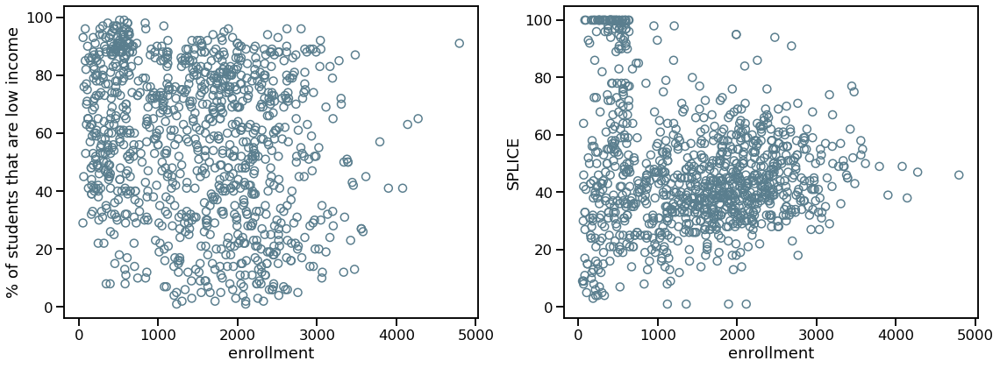

<IPython.core.display.Javascript object>

In [114]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
scatter_plot_open_circles(df_state_info_gs_census, "enrollment", "pct_LI_students", ax1)

scatter_plot_open_circles(
    df_state_info_gs_census,
    "enrollment",
    "graduation_rates_UCCSU_eligibility_LIstudents",
    ax2,
)

ax1.set_xlabel("enrollment", fontsize=18)
ax1.set_ylabel("% of students that are low income", fontsize=18)
ax2.set_xlabel("enrollment", fontsize=18)
ax2.set_ylabel("SPLICE", fontsize=18)
plt.tight_layout()

### Most correlated features

In [115]:
df_state_info_gs_census[
    "graduation_rates_UCCSU_eligibility_allStudents"
] * df_state_info_gs_census["pct_LI_students"] / 100

0       67.00
1       11.88
2         NaN
3       80.00
4       10.71
        ...  
1147    26.46
1148    26.04
1149    29.48
1150    20.46
1151    19.24
Length: 1099, dtype: float64

<IPython.core.display.Javascript object>

In [116]:
df_state_info_gs_census["graduation_rates_UCCSU_eligibility_LIstudents"]

0       100.0
1        50.0
2       100.0
3       100.0
4        45.0
        ...  
1147     38.0
1148     30.0
1149     72.0
1150     29.0
1151     51.0
Name: graduation_rates_UCCSU_eligibility_LIstudents, Length: 1099, dtype: float64

<IPython.core.display.Javascript object>

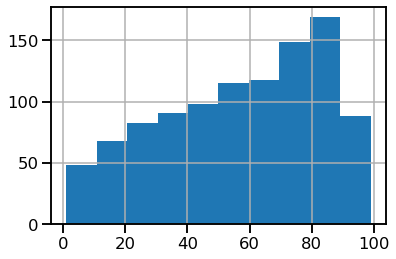

<IPython.core.display.Javascript object>

In [117]:
df_state_info_gs_census["pct_LI_students"].hist()

''

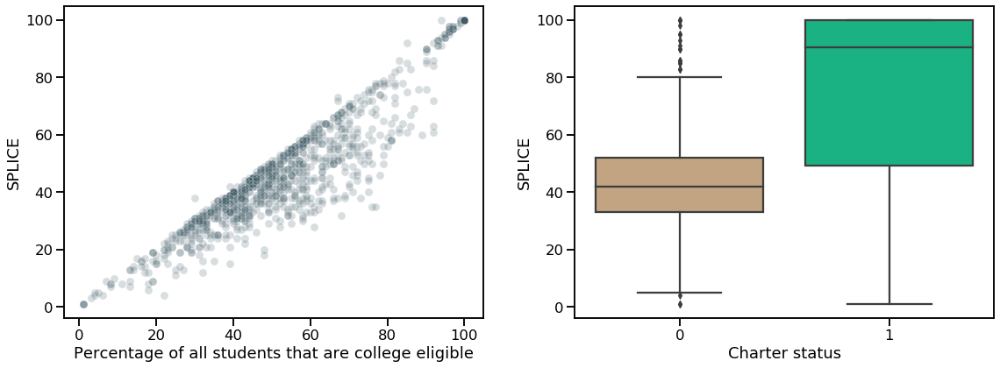

<IPython.core.display.Javascript object>

In [121]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
# scatter_plot_open_circles(
#     df_state_info_gs_census,
#     "graduation_rates_UCCSU_eligibility_allStudents",
#     "graduation_rates_UCCSU_eligibility_LIstudents",
#     ax1,
# )

sns.scatterplot(
    data=df_state_info_gs_census,
    x="graduation_rates_UCCSU_eligibility_allStudents",
    y="graduation_rates_UCCSU_eligibility_LIstudents",
    ax=ax1,
    alpha=0.2,
    color=B_slate,
    legend=False,
)
ax1.set_xlabel("Percentage of all students that are college eligible", fontsize=18)
ax1.set_ylabel("SPLICE", fontsize=18)


sns.boxplot(
    data=df_state_info_gs_census,
    x="Charter_cat_encoded",
    y="graduation_rates_UCCSU_eligibility_LIstudents",
    palette=[B_beige, B_green],
)
ax2.set_xlabel("Charter status", fontsize=18)
ax2.set_ylabel("SPLICE", fontsize=18)
plt.tight_layout()
;

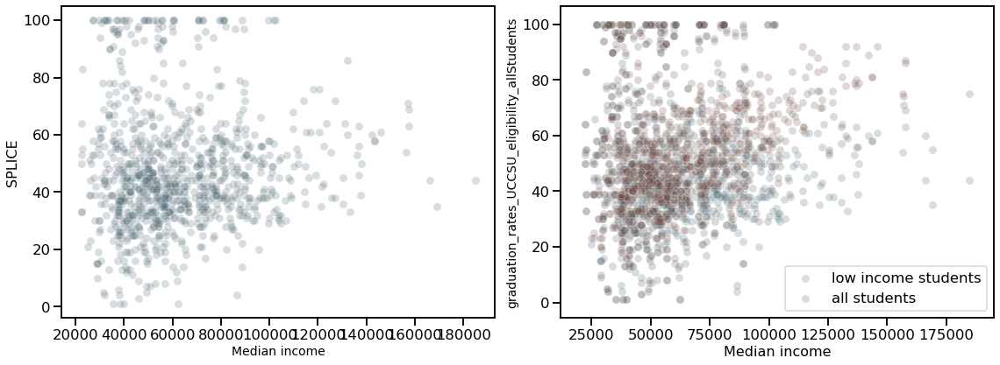

<IPython.core.display.Javascript object>

In [135]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
# scatter_plot_open_circles(
#     df_state_info_gs_census,
#     "graduation_rates_UCCSU_eligibility_allStudents",
#     "graduation_rates_UCCSU_eligibility_LIstudents",
#     ax1,
# )

sns.scatterplot(
    data=df_state_info_gs_census,
    x="Est.; INCOME_BENEFITS - Total households - Median household income ($)",
    y="graduation_rates_UCCSU_eligibility_LIstudents",
    ax=ax1,
    alpha=0.2,
    color=B_slate,
    legend=False,
)
ax1.set_xlabel("Median income", fontsize=14)
ax1.set_ylabel("SPLICE", fontsize=16)


# Overlay them together
sns.scatterplot(
    data=df_state_info_gs_census,
    x="Est.; INCOME_BENEFITS - Total households - Median household income ($)",
    y="graduation_rates_UCCSU_eligibility_LIstudents",
    label="low income students",
    ax=ax2,
    alpha=0.2,
    color=B_slate,
    legend="brief",
)
ax2.set_xlabel("Median income", fontsize=14)
ax2.set_ylabel("Percentage of students that are college eligible", fontsize=14)

sns.scatterplot(
    data=df_state_info_gs_census,
    x="Est.; INCOME_BENEFITS - Total households - Median household income ($)",
    y="graduation_rates_UCCSU_eligibility_allStudents",
    label="all students",
    ax=ax2,
    alpha=0.2,
    color=B_brown,
)
ax2.set_xlabel("Median income", fontsize=16)
ax2.legend()

plt.tight_layout()

In [136]:
df_state_info_gs_census["Charter_cat_encoded"].sum()

179

<IPython.core.display.Javascript object>

### Distribution of target

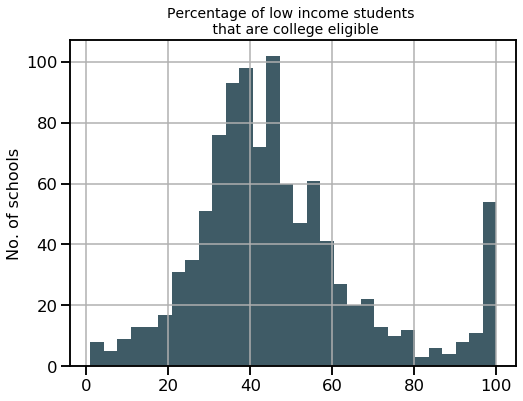

<IPython.core.display.Javascript object>

In [137]:
f, ax1 = plt.subplots(figsize=(8,6))
hist_plot(df_state_info_gs_census, "graduation_rates_UCCSU_eligibility_LIstudents", ax1)
ax1.set_ylabel("No. of schools", fontsize=16)
ax1.set_title("Percentage of low income students \n that are college eligible", fontsize=14);


mean:  46.648727984344426
mean +/- 1SD:  25.935753315454775 67.36170265323408
mean + 2SD:  5.222778646565125 88.07467732212373


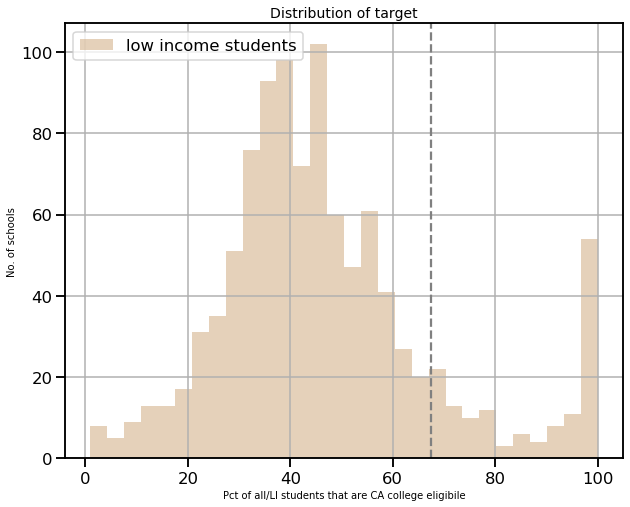

<IPython.core.display.Javascript object>

In [138]:
f, ax1 = plt.subplots(figsize=(10, 8))
df_state_info_gs_census["graduation_rates_UCCSU_eligibility_LIstudents"].hist(
    bins=30, ax=ax1, color=B_beige, alpha=0.5, label="low income students"
)
# df_state_info_gs_census["graduation_rates_UCCSU_eligibility_allStudents"].hist(
#     bins=30, ax=ax1, color=B_green, alpha=0.5, label="all students"
# )

ax1.axvline(67.4, c="gray", linestyle="dashed")
ax1.set_title("Distribution of target")
ax1.set_xlabel("Pct of all/LI students that are CA college eligibile")
ax1.set_ylabel("No. of schools")
ax1.legend()

target = df_state_info_gs_census["graduation_rates_UCCSU_eligibility_LIstudents"]
target_mean = target.mean()
target_sd = target.std()

print("mean: ", target_mean)
print("mean +/- 1SD: ", target_mean - target_sd, target_mean + target_sd)
print("mean + 2SD: ", target_mean - 2 * target_sd, target_mean + 2 * target_sd)

## Random forest regression

Target: SPLICE

- Used RF to be allow for possibly correlated features
- Evaluated with all features and with filtering for correlated (conservative)
- Splitting on MSE
- Use Gridsearch
- Apply train-test-validation splits

### With all features 

With features in at least 2/3 of schools (135 features + 1 target)
<br>
variable containing all column names: all_features_filt

In [344]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import RandomizedSearchCV

<IPython.core.display.Javascript object>

In [345]:
def get_split_data(X, y, testsize):

    # Keep rows only if there are no null values for that feature and target
    k_rows2keep = pd.merge(X, y, left_index=True, right_index=True).notnull().sum(
        axis=1
    ) == (X.shape[1] + 1)
    print(
        "No. of total schools before splitting (no null values for feature set or target): ",
        sum(k_rows2keep),
    )

    X = X.loc[k_rows2keep, :].copy()
    y = y[k_rows2keep].copy()

    # Split data between train and test
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=testsize, random_state=42
    )

    return X_train, X_test, y_train, y_test

<IPython.core.display.Javascript object>

In [347]:
[i for i in all_features_filt_notarget]

['enrollment',
 '%; INCOME_BENEFITS - w/ retirement income_x',
 '%; INCOME_BENEFITS - w/ cash public assistance income_x',
 '%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force',
 '%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force - Civilian labor force',
 '%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force - Civilian labor force - Employed',
 '%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force - Civilian labor force - Unemployed',
 '%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force - Armed Forces',
 '%; EMPLOY_STATUS - Pop. 16 yrs and up - Not in labor force',
 '%; EMPLOY_STATUS - Civilian labor force - Unemployment Rate',
 '%; EMPLOY_STATUS - Females 16 yrs and up - In labor force',
 '%; EMPLOY_STATUS - Females 16 yrs and up - In labor force - Civilian labor force',
 '%; EMPLOY_STATUS - Females 16 yrs and up - In labor force - Civilian labor force - Employed',
 '%; EMPLOY_STATUS - Own children of the householder under 6 yrs - All parents in family in labor force'

<IPython.core.display.Javascript object>

In [351]:
X_allf = df_state_info_gs_census[all_features_filt_notarget]
y_allf = df_state_info_gs_census["graduation_rates_gradRates_eligibility_LIstudents"]

<IPython.core.display.Javascript object>

In [352]:
X_allf.shape

(1099, 135)

<IPython.core.display.Javascript object>

In [353]:
X_train_rf_allf, X_test_rf_allf, y_train_rf_allf, y_test_rf_allf = get_split_data(
    X_allf, y_allf, 0.4
)

No. of total schools before splitting (no null values for feature set or target):  822


<IPython.core.display.Javascript object>

#### Finding parameters with grid search

**Run a hyperparameter grid search**

Blog entry [here](https://towardsdatascience.com/hyperparameter-tuning-the-random-forest-in-python-using-scikit-learn-28d2aa77dd74)

See [here](https://scikit-learn.org/stable/modules/grid_search.html)
- try randomized parameter optimization since more values can be tested
- try doing multiple metrics - R2, MSE, etc.
- note: don't have to do pruning because of RF design (see [here](https://stats.stackexchange.com/questions/36298/why-is-pruning-not-needed-for-random-forest-trees))

In [399]:
range(50, 500, 10)

range(50, 500, 10)

<IPython.core.display.Javascript object>

In [164]:
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start=50, stop=1000, num=10)]
# Number of features to consider at every split
max_features = ["auto", "sqrt"]
# Maximum number of levels in tree - since I have ~1000 schools
max_depth = [2, 3, 4, 5, 6, 7, 8, 9, 0]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]

# Create the random grid
random_grid = {
    "n_estimators": n_estimators,
    "max_features": max_features,
    "max_depth": max_depth,
    "min_samples_split": min_samples_split,
    "min_samples_leaf": min_samples_leaf,
    "bootstrap": bootstrap,
}

<IPython.core.display.Javascript object>

**Example to show how to get evaluation metrics**

In [166]:
# Instantiate model - note haven't used oob_scorebool parameter
rf = RandomForestRegressor()

# Rn search using 5-fold cross-validation
rf_random = RandomizedSearchCV(
    estimator=rf,  # the model
    param_distributions=random_grid,  # from above
    n_iter=5,  # no. of parameter settings sampled
    cv=3,
    verbose=2,
    random_state=42,
    n_jobs=-1,
    refit=False,
    scoring=[
        "r2",
        "neg_root_mean_squared_error",
    ],  # look at multiple evaluation metrics
    return_train_score=True,  # computationally expensive, but output here for insight
)

rf_random.fit(X_train_rf_allf, y_train_rf_allf)

# This took ~ 1 minute to run

# y_pred = rf.predict(X_test)

Fitting 3 folds for each of 5 candidates, totalling 15 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  15 out of  15 | elapsed:   51.5s finished


RandomizedSearchCV(cv=3, error_score=nan,
                   estimator=RandomForestRegressor(bootstrap=True,
                                                   ccp_alpha=0.0,
                                                   criterion='mse',
                                                   max_depth=None,
                                                   max_features='auto',
                                                   max_leaf_nodes=None,
                                                   max_samples=None,
                                                   min_impurity_decrease=0.0,
                                                   min_impurity_split=None,
                                                   min_samples_leaf=1,
                                                   min_samples_split=2,
                                                   min_weight_fraction_leaf=0.0,
                                                   n_estimators=100,
                              

<IPython.core.display.Javascript object>

In [168]:
df_cv_results = pd.DataFrame(rf_random.cv_results_)
df_cv_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_estimators,param_min_samples_split,param_min_samples_leaf,param_max_features,param_max_depth,param_bootstrap,...,split1_test_neg_root_mean_squared_error,split2_test_neg_root_mean_squared_error,mean_test_neg_root_mean_squared_error,std_test_neg_root_mean_squared_error,rank_test_neg_root_mean_squared_error,split0_train_neg_root_mean_squared_error,split1_train_neg_root_mean_squared_error,split2_train_neg_root_mean_squared_error,mean_train_neg_root_mean_squared_error,std_train_neg_root_mean_squared_error
0,2.009250,0.002861,0.083045,0.000585,472,10,1,sqrt,9,False,...,-4.180721,-5.181895,-4.321210,0.652993,4,-1.817955,-1.481463,-1.503862,-1.601093,0.153616
1,34.417667,0.256442,0.145443,0.013459,788,10,4,auto,None,False,...,-3.223385,-3.121231,-2.949968,0.317190,3,-1.566994,-1.239746,-1.537293,-1.448011,0.147764
2,0.200562,0.006880,0.013686,0.002368,50,10,2,sqrt,6,True,...,-4.417820,-5.449158,-4.586629,0.646452,5,-3.543610,-3.163177,-2.987540,-3.231442,0.232090
3,13.102919,3.714432,0.073534,0.018028,472,2,2,auto,9,True,...,-2.820788,-2.826519,-2.484143,0.480146,1,-1.301882,-0.967184,-1.183202,-1.150756,0.138552
4,0.929396,0.060114,0.011740,0.001034,50,10,2,auto,8,True,...,-2.858757,-2.988853,-2.567815,0.506239,2,-1.628218,-1.217925,-1.436156,-1.427433,0.167615


<IPython.core.display.Javascript object>

In [169]:
df_cv_results.T

,0,1,2,3,4
mean_fit_time,2.00925,34.4177,0.200562,13.1029,0.929396
std_fit_time,0.00286112,0.256442,0.00687975,3.71443,0.060114
mean_score_time,0.0830453,0.145443,0.0136863,0.0735335,0.0117399
std_score_time,0.000585017,0.013459,0.00236817,0.0180283,0.00103369
param_n_estimators,472,788,50,472,50
param_min_samples_split,10,10,10,2,10
param_min_samples_leaf,1,4,2,2,2
param_max_features,sqrt,auto,sqrt,auto,auto
param_max_depth,9,None,6,9,8
param_bootstrap,False,False,True,True,True


<IPython.core.display.Javascript object>

In [355]:
# Return the parameters that are best

bool_best_rank = (df_cv_results["rank_test_neg_root_mean_squared_error"] == 1) & (
    df_cv_results["rank_test_r2"] == 1
)

idx_bool = df_cv_results.index[bool_best_rank][0]
best_params = df_cv_results.loc[idx_bool, "params"]

<IPython.core.display.Javascript object>

**Run model with best parameters**

In [357]:
# Add random state to the parameters
best_params["random_state"] = 42
best_params

{'n_estimators': 472,
 'min_samples_split': 2,
 'min_samples_leaf': 2,
 'max_features': 'auto',
 'max_depth': 9,
 'bootstrap': True,
 'random_state': 42}

<IPython.core.display.Javascript object>

#### Running model

In [358]:
def run_randomforest_v0(X_train, y_train, X_test, y_test, parameters):
    # Use dictionary of parameters - use the double asterisks to unpack
    parameters["random_state"] = 42
    rf = RandomForestRegressor(**parameters)
    rf.fit(X_train, y_train)
    y_pred = rf.predict(X_test)
    df_eval = pd.DataFrame({"test": y_test, "pred": y_pred})

    return rf, df_eval

<IPython.core.display.Javascript object>

In [379]:
rf_v0, df_eval_v0 = run_randomforest_v0(
    X_train_rf_allf, y_train_rf_allf, X_test_rf_allf, y_test_rf_allf, best_params
)

<IPython.core.display.Javascript object>

In [360]:
# Verify the right parameters are being put in
rf_v0

RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=9, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=2,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=472, n_jobs=None, oob_score=False,
                      random_state=42, verbose=0, warm_start=False)

<IPython.core.display.Javascript object>

In [361]:
y_train_rf_allf.shape

(493,)

<IPython.core.display.Javascript object>

Text(0.5, 1.0, 'test vs. prediction of SPLICE')

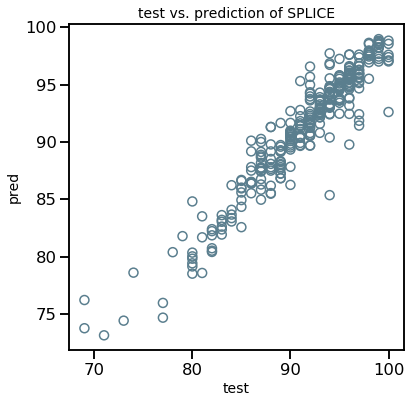

<IPython.core.display.Javascript object>

In [362]:
f, (ax1) = plt.subplots(1, 1, figsize=(6, 6))
scatter_plot_open_circles(df_eval_v0, "test", "pred", ax1)
ax1.set_title("test vs. prediction of SPLICE")

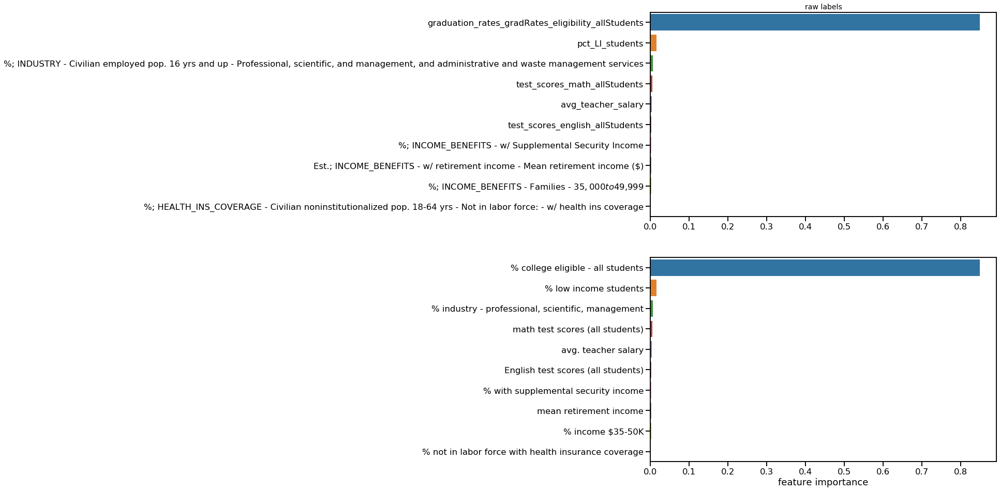

<IPython.core.display.Javascript object>

In [368]:
# Show most important features
features = X_train_rf_allf.columns.tolist()
feature_imp = pd.Series(rf_v0.feature_importances_, index=features).sort_values(ascending=False)

# Creating a bar plot
f, (ax1, ax2) = plt.subplots(2, 1, figsize=(12,16))

#ax1 = 
sns.barplot(x=feature_imp[0:10], y=feature_imp.index[0:10], ax=ax1)
ax1.set_title('raw labels')

sns.barplot(x=feature_imp[0:10], y=feature_imp.index[0:10], ax=ax2)
new_labels = ['% college eligible - all students', 
              '% low income students', 
              '% industry - professional, scientific, management', 
              'math test scores (all students)', 
              'avg. teacher salary', 
              'English test scores (all students)', 
              '% with supplemental security income', 
              'mean retirement income', 
              '% income $35-50K', 
              '% not in labor force with health insurance coverage']
ax2.set_yticklabels(new_labels)
ax2.set_xlabel('feature importance', fontsize=18);
# ax1.set_xticklabels(new_labels, rotation=45, ha='right');
#ax1.set_xticklabels(range(1,11));
#ax1.legend(new_labels, bbox_to_anchor=(1, 1), loc='upper left', ncol=1, fontsize=10);


In [369]:
# Top 10
feature_imp[0:10]

graduation_rates_gradRates_eligibility_allStudents                                                                                                 0.849926
pct_LI_students                                                                                                                                    0.016302
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Professional, scientific, and management, and administrative and waste management services    0.006575
test_scores_math_allStudents                                                                                                                       0.005380
avg_teacher_salary                                                                                                                                 0.003945
test_scores_english_allStudents                                                                                                                    0.003738
%; INCOME_BENEFITS - w/ Supplemental Security Income            

<IPython.core.display.Javascript object>

#### Focusing on features that can be affected by schools and districts

### With conservative set of features

In [396]:
all_features_filt_wcensuscheck_notarget = all_features_filt_wcensuscheck[:]
all_features_filt_wcensuscheck_notarget.remove(
    "graduation_rates_UCCSU_eligibility_LIstudents"
)

<IPython.core.display.Javascript object>

In [397]:
all_features_filt_wcensuscheck_notarget

['%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefits in the past 12 months',
 '%; INCOME_BENEFITS - w/ Social Security',
 '%; INCOME_BENEFITS - w/ Supplemental Security Income',
 'Est.; INCOME_BENEFITS - Total households - Median household income ($)',
 'Est.; INCOME_BENEFITS - w/ retirement income - Mean retirement income ($)',
 'Est.; INCOME_BENEFITS - w/ cash public assistance income - Mean cash public assistance income ($)',
 '%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage',
 '%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage - w/ public coverage',
 '%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. <18 yrs - No health ins coverage',
 '%; WORK_COMMUTE - Workers 16 yrs and up - Car, truck, or van -- drove alone',
 '%; WORK_COMMUTE - Workers 16 yrs and up - Car, truck, or van -- carpooled',
 '%; WORK_COMMUTE - Workers 16 yrs and up - Public transportation (excluding taxicab)',
 '%; WORK_COMMUTE - Workers

<IPython.core.display.Javascript object>

In [373]:
X_51f = df_state_info_gs_census[all_features_filt_wcensuscheck_notarget]
y_51f = df_state_info_gs_census["graduation_rates_gradRates_eligibility_LIstudents"]

<IPython.core.display.Javascript object>

In [376]:
X_51f.shape

(1099, 51)

<IPython.core.display.Javascript object>

In [391]:
y_51f

0       83.0
1       94.0
2       51.0
3       77.0
4       92.0
        ... 
1147    88.0
1148    90.0
1149    96.0
1150    97.0
1151    99.0
Name: graduation_rates_gradRates_eligibility_LIstudents, Length: 1099, dtype: float64

<IPython.core.display.Javascript object>

In [377]:
X_train_rf_51f, X_test_rf_51f, y_train_rf_51f, y_test_rf_51f = get_split_data(
    X_51f, y_51f, 0.4
)

No. of total schools before splitting (no null values for feature set or target):  825


<IPython.core.display.Javascript object>

#### Finding parameters with grid search

In [378]:
# Instantiate model - note haven't used oob_scorebool parameter
rf = RandomForestRegressor()

# Rn search using 5-fold cross-validation
rf_random = RandomizedSearchCV(
    estimator=rf,  # the model
    param_distributions=random_grid,  # from above
    n_iter=5,  # no. of parameter settings sampled
    cv=3,
    verbose=2,
    random_state=42,
    n_jobs=-1,
    refit=False,
    scoring=[
        "r2",
        "neg_root_mean_squared_error",
    ],  # look at multiple evaluation metrics
    return_train_score=True,  # computationally expensive, but output here for insight
)

rf_random.fit(X_train_rf_51f, y_train_rf_51f)

# This took ~ 1 minute to run

# y_pred = rf.predict(X_test)

Fitting 3 folds for each of 5 candidates, totalling 15 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  15 out of  15 | elapsed:   25.1s finished


RandomizedSearchCV(cv=3, error_score=nan,
                   estimator=RandomForestRegressor(bootstrap=True,
                                                   ccp_alpha=0.0,
                                                   criterion='mse',
                                                   max_depth=None,
                                                   max_features='auto',
                                                   max_leaf_nodes=None,
                                                   max_samples=None,
                                                   min_impurity_decrease=0.0,
                                                   min_impurity_split=None,
                                                   min_samples_leaf=1,
                                                   min_samples_split=2,
                                                   min_weight_fraction_leaf=0.0,
                                                   n_estimators=100,
                              

<IPython.core.display.Javascript object>

In [380]:
df_cv_results_v1 = pd.DataFrame(rf_random.cv_results_)
df_cv_results_v1

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_estimators,param_min_samples_split,param_min_samples_leaf,param_max_features,param_max_depth,param_bootstrap,...,split1_test_neg_root_mean_squared_error,split2_test_neg_root_mean_squared_error,mean_test_neg_root_mean_squared_error,std_test_neg_root_mean_squared_error,rank_test_neg_root_mean_squared_error,split0_train_neg_root_mean_squared_error,split1_train_neg_root_mean_squared_error,split2_train_neg_root_mean_squared_error,mean_train_neg_root_mean_squared_error,std_train_neg_root_mean_squared_error
0,1.942905,0.031640,0.116736,0.008766,472,10,1,sqrt,9,False,...,-2.762296,-2.892612,-2.638738,0.272135,4,-1.075314,-0.998512,-0.920118,-0.997981,0.063360
1,6.712419,0.291542,0.113476,0.001018,788,10,4,auto,None,False,...,-0.752481,-1.326660,-0.891444,0.314372,3,-0.759840,-0.769157,-0.568366,-0.699121,0.092536
2,0.207834,0.005915,0.015375,0.001130,50,10,2,sqrt,6,True,...,-3.132945,-3.201893,-3.042507,0.178881,5,-2.289483,-2.187204,-1.953830,-2.143506,0.140470
3,3.050588,0.278599,0.051665,0.015038,472,2,2,auto,9,True,...,-0.450303,-1.280126,-0.654610,0.451083,1,-0.533967,-0.664855,-0.329436,-0.509419,0.138030
4,0.302301,0.027285,0.010307,0.000209,50,10,2,auto,8,True,...,-0.548665,-1.234608,-0.721165,0.369514,2,-0.875818,-0.788914,-0.451580,-0.705437,0.182977


<IPython.core.display.Javascript object>

In [381]:
df_cv_results_v1.T

,0,1,2,3,4
mean_fit_time,1.9429,6.71242,0.207834,3.05059,0.302301
std_fit_time,0.0316402,0.291542,0.00591461,0.278599,0.0272855
mean_score_time,0.116736,0.113476,0.0153749,0.0516648,0.0103066
std_score_time,0.00876564,0.00101812,0.00113025,0.0150378,0.0002093
param_n_estimators,472,788,50,472,50
param_min_samples_split,10,10,10,2,10
param_min_samples_leaf,1,4,2,2,2
param_max_features,sqrt,auto,sqrt,auto,auto
param_max_depth,9,None,6,9,8
param_bootstrap,False,False,True,True,True


<IPython.core.display.Javascript object>

In [385]:
# Return the parameters that are best

bool_best_rank = (df_cv_results_v1["rank_test_neg_root_mean_squared_error"] == 1) & (
    df_cv_results_v1["rank_test_r2"] == 1
)

idx_bool = df_cv_results_v1.index[bool_best_rank][0]
best_params_v1 = df_cv_results_v1.loc[idx_bool, "params"]

<IPython.core.display.Javascript object>

**Run model with best parameters**

In [386]:
# Add random state to the parameters
best_params_v1["random_state"] = 42
best_params_v1

{'n_estimators': 472,
 'min_samples_split': 2,
 'min_samples_leaf': 2,
 'max_features': 'auto',
 'max_depth': 9,
 'bootstrap': True,
 'random_state': 42}

<IPython.core.display.Javascript object>

#### Running model

In [392]:
rf_v1, df_eval_v1 = run_randomforest_v0(
    X_train_rf_51f, y_train_rf_51f, X_test_rf_51f, y_test_rf_51f, best_params_v1
)

<IPython.core.display.Javascript object>

In [393]:
y_train_rf_51f.shape

(495,)

<IPython.core.display.Javascript object>

Text(0.5, 1.0, 'test vs. prediction of SPLICE')

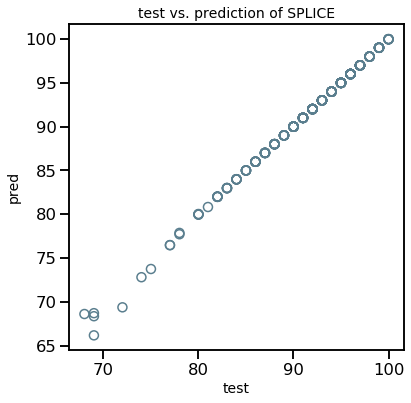

<IPython.core.display.Javascript object>

In [394]:
f, (ax1) = plt.subplots(1, 1, figsize=(6, 6))
scatter_plot_open_circles(df_eval_v1, "test", "pred", ax1)
ax1.set_title("test vs. prediction of SPLICE")

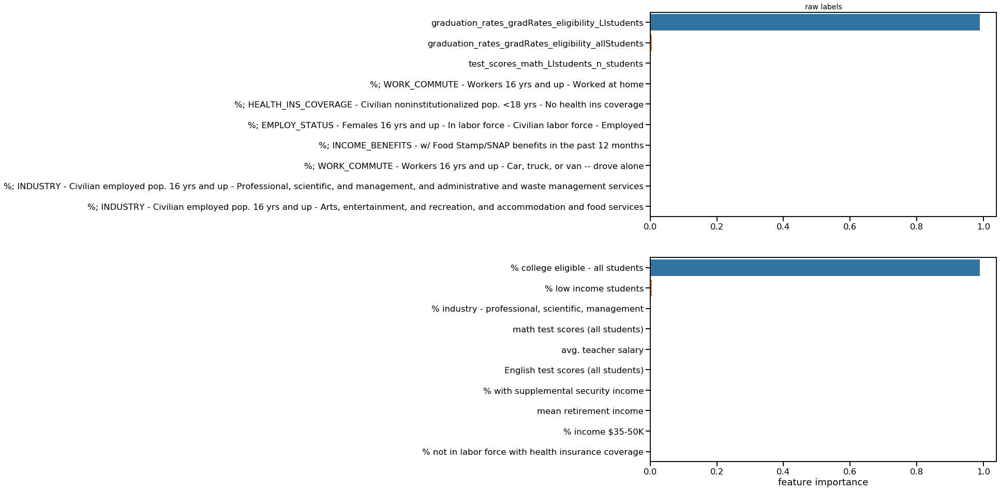

<IPython.core.display.Javascript object>

In [395]:
# Show most important features
features = X_train_rf_51f.columns.tolist()
feature_imp = pd.Series(rf_v1.feature_importances_, index=features).sort_values(ascending=False)

# Creating a bar plot
f, (ax1, ax2) = plt.subplots(2, 1, figsize=(12,16))

#ax1 = 
sns.barplot(x=feature_imp[0:10], y=feature_imp.index[0:10], ax=ax1)
ax1.set_title('raw labels')

sns.barplot(x=feature_imp[0:10], y=feature_imp.index[0:10], ax=ax2)
new_labels = ['% college eligible - all students', 
              '% low income students', 
              '% industry - professional, scientific, management', 
              'math test scores (all students)', 
              'avg. teacher salary', 
              'English test scores (all students)', 
              '% with supplemental security income', 
              'mean retirement income', 
              '% income $35-50K', 
              '% not in labor force with health insurance coverage']
ax2.set_yticklabels(new_labels)
ax2.set_xlabel('feature importance', fontsize=18);
# ax1.set_xticklabels(new_labels, rotation=45, ha='right');
#ax1.set_xticklabels(range(1,11));
#ax1.legend(new_labels, bbox_to_anchor=(1, 1), loc='upper left', ncol=1, fontsize=10);


## Previous code below this

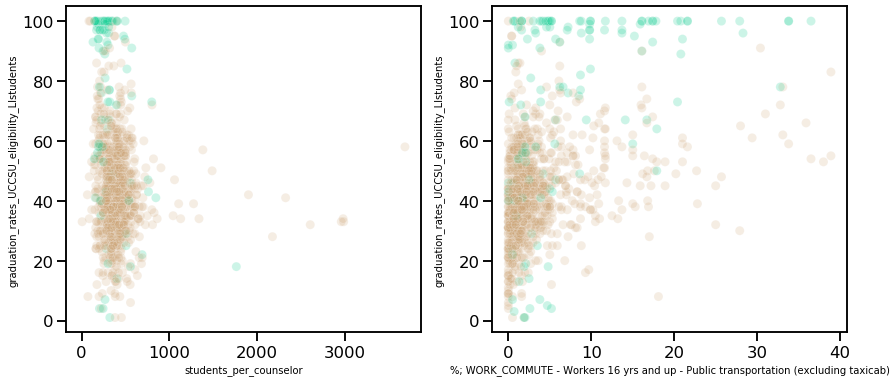

<IPython.core.display.Javascript object>

In [670]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))
sns.scatterplot(
    data=df_state_info_gs_census,
    x="students_per_counselor",
    y="graduation_rates_UCCSU_eligibility_LIstudents",
    hue="Charter_cat_encoded",
    palette=[B_beige, B_green],
    ax=ax1,
    alpha=0.2,
    legend=False,
)

sns.scatterplot(
    data=df_state_info_gs_census,
    x="%; WORK_COMMUTE - Workers 16 yrs and up - Public transportation (excluding taxicab)",
    y="graduation_rates_UCCSU_eligibility_LIstudents",
    hue="Charter_cat_encoded",
    palette=[B_beige, B_green],
    ax=ax2,
    alpha=0.2,
    legend=False,
)

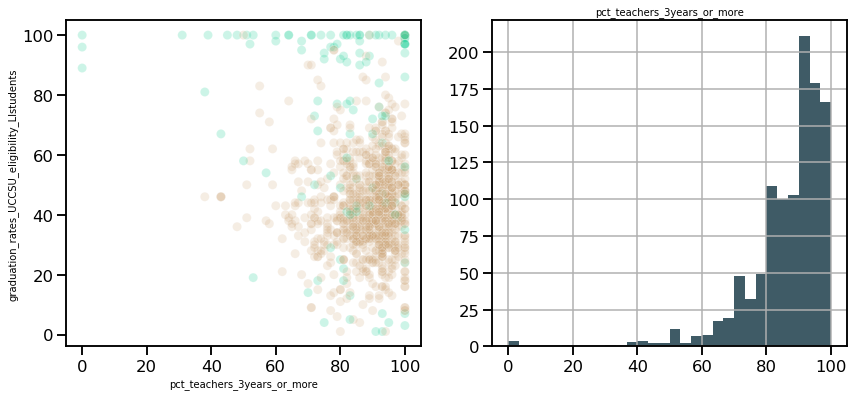

<IPython.core.display.Javascript object>

In [676]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))
sns.scatterplot(
    data=df_state_info_gs_census,
    x="pct_teachers_3years_or_more",
    y="graduation_rates_UCCSU_eligibility_LIstudents",
    hue="Charter_cat_encoded",
    palette=[B_beige, B_green],
    ax=ax1,
    alpha=0.2,
    legend=False,
)

hist_plot(df_state_info_gs_census, "pct_teachers_3years_or_more", ax=ax2)

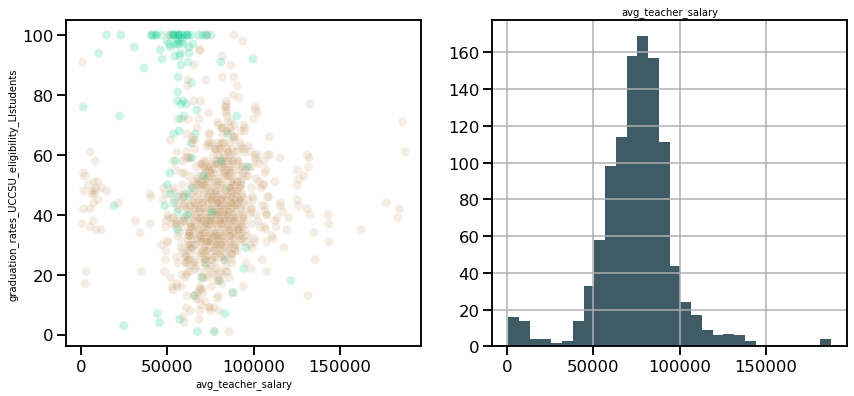

<IPython.core.display.Javascript object>

In [680]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))
sns.scatterplot(
    data=df_state_info_gs_census,
    x="avg_teacher_salary",
    y="graduation_rates_UCCSU_eligibility_LIstudents",
    hue="Charter_cat_encoded",
    palette=[B_beige, B_green],
    ax=ax1,
    alpha=0.2,
    legend=False,
)

hist_plot(df_state_info_gs_census, "avg_teacher_salary", ax=ax2)

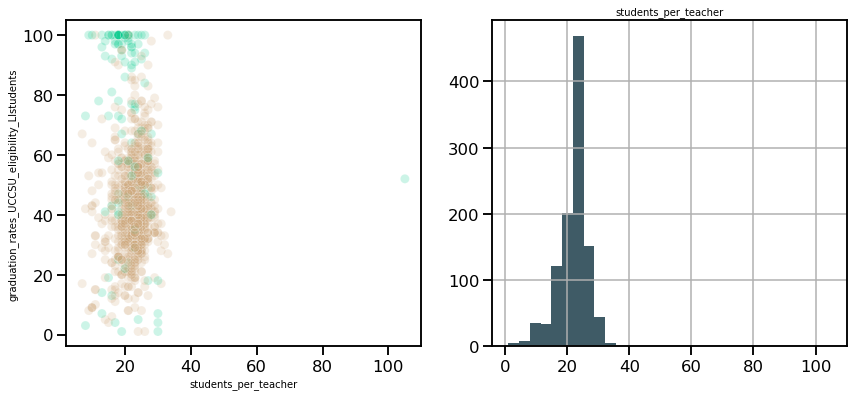

<IPython.core.display.Javascript object>

In [681]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))
sns.scatterplot(
    data=df_state_info_gs_census,
    x="students_per_teacher",
    y="graduation_rates_UCCSU_eligibility_LIstudents",
    hue="Charter_cat_encoded",
    palette=[B_beige, B_green],
    ax=ax1,
    alpha=0.2,
    legend=False,
)

hist_plot(df_state_info_gs_census, "students_per_teacher", ax=ax2)

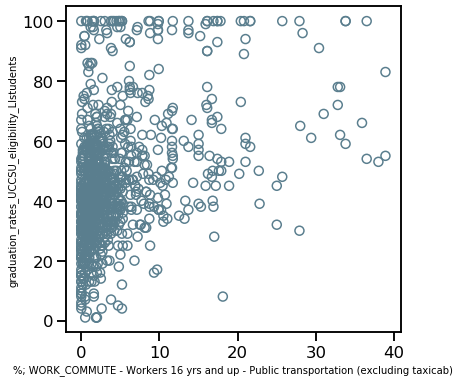

<IPython.core.display.Javascript object>

In [666]:
f, (ax1) = plt.subplots(1, 1, figsize=(6, 6))
scatter_plot_open_circles(
    df_state_info_gs_census,
    "%; WORK_COMMUTE - Workers 16 yrs and up - Public transportation (excluding taxicab)",
    "graduation_rates_UCCSU_eligibility_LIstudents",
    ax1,
)

In [667]:
print("R2 score: ", rf_v0.score(X_test_rf, y_test_rf))

R2 score:  0.43454237447381516


<IPython.core.display.Javascript object>

## RF regression, target as difference between percent low income and percent of all students college eligible

In [160]:
df_state_info_gs_census.head()

,Unnamed: 0,CDSCode,NCESDist,NCESSchool,StatusType,County,District,School,Street,StreetAbr,...,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - Under 18 yrs,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - Under 18 yrs - Related children of the householder <18 yrs,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - Under 18 yrs - Related children of the householder <18 yrs - Related children of the householder 5 to 17 yrs,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - 18 yrs and up,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - 18-64 yrs,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - 65 yrs and up,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - 65 yrs and up - People in families,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - 65 yrs and up - Unrelated individuals 15 yrs and up,Magnet_cat_encoded,Charter_cat_encoded
0,0,1100170112607,0691051,10947,Active,Alameda,Alameda County Office of Education,Envision Academy for Arts & Technology,1515 Webster Street,1515 Webster St.,...,23.3,22.8,25.5,31.0,28.9,39.3,17.1,39.3,0.0,1
1,1,1611190130229,0601770,00041,Active,Alameda,Alameda Unified,Alameda High,2200 Central Ave,2200 Central Ave,...,12.1,11.2,10.9,11.2,11.6,9.1,8.8,19.8,0.0,0
2,2,1611190130625,0601770,08674,Active,Alameda,Alameda Unified,Alternatives in Action,6221 East 17th St,6221 East 17th St,...,42.7,42.5,40.0,28.0,29.2,17.4,30.9,43.6,0.0,1
3,23,1612590108944,0628050,10726,Active,Alameda,Oakland Unified,Lighthouse Community Charter High,444 Hegenberger Road,444 Hegenberger Rd.,...,42.7,42.5,40.0,28.0,29.2,17.4,30.9,43.6,0.0,1
4,3,1611270130450,0601860,00059,Active,Alameda,Albany City Unified,Albany High,603 Key Route Boulevard,603 Key Route Blvd.,...,11.1,10.6,9.4,11.5,12.3,6.2,8.5,25.3,0.0,0


<IPython.core.display.Javascript object>

In [161]:
len(df_state_info_gs_census["zip_code"].unique())

790

<IPython.core.display.Javascript object>

In [162]:
len(df_state_info_gs_census)

1099

<IPython.core.display.Javascript object>

In [685]:
df_state_info_gs_census.loc[:, "graduation_rates_UCCSU_eligibility_LI_all_diff"] = df_state_info_gs_census.loc[:, "graduation_rates_UCCSU_eligibility_LIstudents"] - df_state_info_gs_census.loc[:, "graduation_rates_UCCSU_eligibility_allStudents"]


<IPython.core.display.Javascript object>

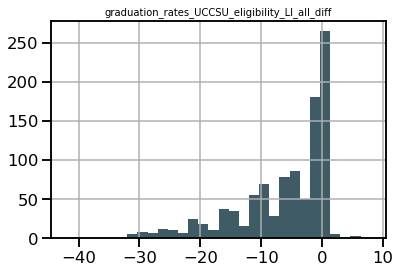

<IPython.core.display.Javascript object>

In [687]:
f, ax1 = plt.subplots()
hist_plot(
    df_state_info_gs_census, "graduation_rates_UCCSU_eligibility_LI_all_diff", ax1
)

In [694]:
target = "graduation_rates_UCCSU_eligibility_LI_all_diff"

<IPython.core.display.Javascript object>

In [695]:
X_rf_v1 = df_state_info_gs_census[all_features_filt_wcensuscheck_notarget].copy()
y_rf_v1 = df_state_info_gs_census[target].copy()

<IPython.core.display.Javascript object>

In [697]:
X_train_rf_v1, X_test_rf_v1, y_train_rf_v1, y_test_rf_v1 = get_split_data(
    X_rf_v1, y_rf_v1, 0.4
)

No. of total schools before splitting (no null values for feature set or target):  825


<IPython.core.display.Javascript object>

In [698]:
rf_v1, df_eval_v1 = run_randomforest_v0(
    X_train_rf_v1, y_train_rf_v1, X_test_rf_v1, y_test_rf_v1
)

<IPython.core.display.Javascript object>

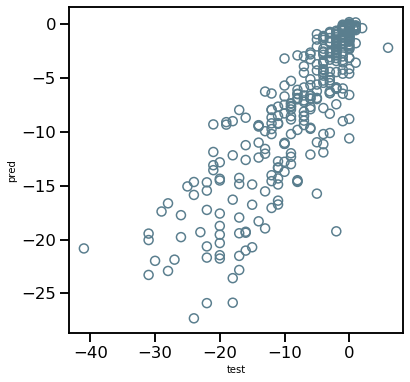

<IPython.core.display.Javascript object>

In [699]:
f, (ax1) = plt.subplots(1, 1, figsize=(6, 6))
scatter_plot_open_circles(df_eval_v1, "test", "pred", ax1)

In [701]:
print("R2 score: ", rf_v1.score(X_test_rf_v1, y_test_rf_v1))

R2 score:  0.7376636998668289


<IPython.core.display.Javascript object>

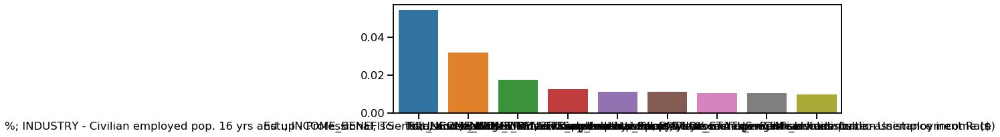

<IPython.core.display.Javascript object>

In [708]:
# Show most important features
features = X_train_rf_v1.columns.tolist()
feature_imp = pd.Series(rf_v1.feature_importances_, index=features).sort_values(
    ascending=False
)

# Creating a bar plot
plt.figure(figsize=(12, 3))
ax = sns.barplot(y=feature_imp[1:10], x=feature_imp.index[1:10])

In [703]:
feature_imp.head(10)

pct_LI_students                                                                                                                                    0.642368
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Professional, scientific, and management, and administrative and waste management services    0.054382
Est.; INCOME_BENEFITS - Total households - Median household income ($)                                                                             0.031948
test_scores_math_LIstudents_n_students                                                                                                             0.017409
%; INCOME_BENEFITS - w/ Supplemental Security Income                                                                                               0.012607
avg_teacher_salary                                                                                                                                 0.011402
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Public admi

<IPython.core.display.Javascript object>

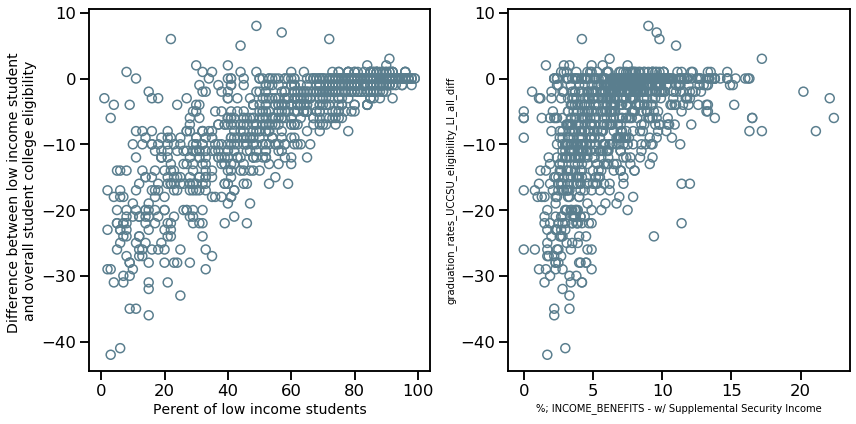

<IPython.core.display.Javascript object>

In [743]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
scatter_plot_open_circles(
    df_state_info_gs_census,
    "pct_LI_students",
    "graduation_rates_UCCSU_eligibility_LI_all_diff",
    ax1,
)
ax1.set_xlabel("Perent of low income students", fontsize=14)
ax1.set_ylabel(
    "Difference between low income student \nand overall student college eligibility",
    fontsize=14,
)


scatter_plot_open_circles(
    df_state_info_gs_census,
    "%; INCOME_BENEFITS - w/ Supplemental Security Income",
    "graduation_rates_UCCSU_eligibility_LI_all_diff",
    ax2,
)

plt.tight_layout()

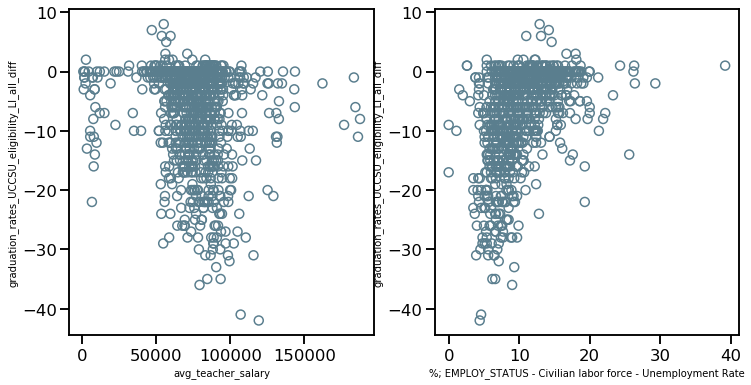

<IPython.core.display.Javascript object>

In [710]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
scatter_plot_open_circles(
    df_state_info_gs_census,
    "avg_teacher_salary",
    "graduation_rates_UCCSU_eligibility_LI_all_diff",
    ax1,
)

scatter_plot_open_circles(
    df_state_info_gs_census,
    "%; EMPLOY_STATUS - Civilian labor force - Unemployment Rate",
    "graduation_rates_UCCSU_eligibility_LI_all_diff",
    ax2,
)

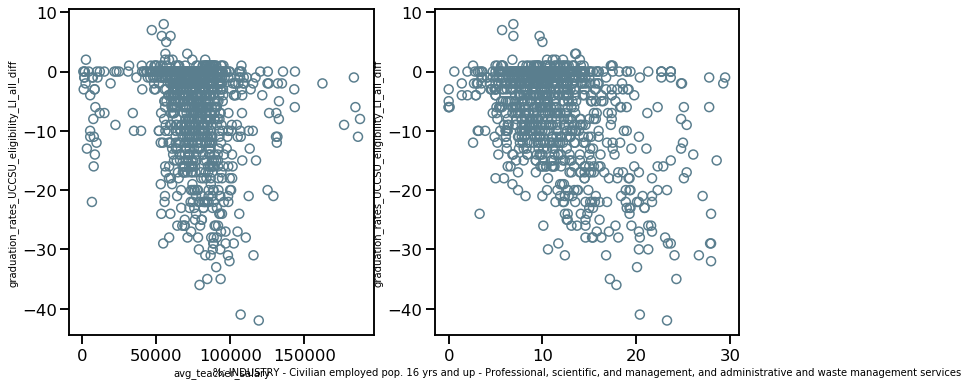

<IPython.core.display.Javascript object>

In [723]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
scatter_plot_open_circles(
    df_state_info_gs_census,
    "avg_teacher_salary",
    "graduation_rates_UCCSU_eligibility_LI_all_diff",
    ax1,
)

scatter_plot_open_circles(
    df_state_info_gs_census,
    "%; INDUSTRY - Civilian employed pop. 16 yrs and up - Professional, scientific, and management, and administrative and waste management services",
    "graduation_rates_UCCSU_eligibility_LI_all_diff",
    ax2,
)

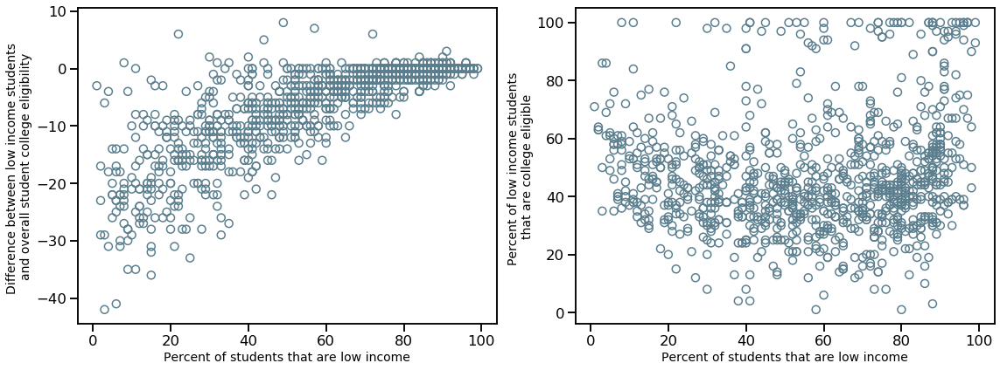

<IPython.core.display.Javascript object>

In [899]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
scatter_plot_open_circles(
    df_state_info_gs_census,
    "pct_LI_students",
    "graduation_rates_UCCSU_eligibility_LI_all_diff",
    ax1,
)
ax1.set_xlabel("Percent of students that are low income", fontsize=14)
ax1.set_ylabel(
    "Difference between low income students \nand overall student college eligibility",
    fontsize=14,
)


scatter_plot_open_circles(
    df_state_info_gs_census,
    "pct_LI_students",
    "graduation_rates_UCCSU_eligibility_LIstudents",
    ax2,
)

ax2.set_xlabel("Percent of students that are low income", fontsize=14)
ax2.set_ylabel(
    "Percent of low income students \nthat are college eligible", fontsize=14,
)
plt.tight_layout()

In [721]:
df_state_info_gs_census.sort_values(
    by="graduation_rates_UCCSU_eligibility_LI_all_diff", ascending=False
).loc[
    :,
    ["School", "City"]
    + all_features_filt_wcensuscheck_notarget
    + ["graduation_rates_UCCSU_eligibility_LIstudents", target],
].head(
    10
)

,School,City,%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefits in the past 12 months,%; INCOME_BENEFITS - w/ Social Security,%; INCOME_BENEFITS - w/ Supplemental Security Income,Est.; INCOME_BENEFITS - Total households - Median household income ($),Est.; INCOME_BENEFITS - w/ retirement income - Mean retirement income ($),Est.; INCOME_BENEFITS - w/ cash public assistance income - Mean cash public assistance income ($),%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage,%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage - w/ public coverage,...,avg_teacher_salary,test_score_rating_LIstudents,test_score_rating_notLIstudents,test_scores_english_LIstudents,test_scores_math_LIstudents,test_scores_math_LIstudents_n_students,graduation_rates_gradRates_eligibility_allStudents,graduation_rates_gradRates_eligibility_LIstudents,graduation_rates_UCCSU_eligibility_LIstudents,graduation_rates_UCCSU_eligibility_LI_all_diff
1009,Fall River Junior-Senior High,McArthur,2.5,42.3,9.0,NaN,NaN,NaN,80.0,35.6,...,55076.0,6.0,NaN,43.0,43.0,54.0,96.0,100.0,38.0,8.0
482,Redwood Academy of Ukiah,Ukiah,14.0,33.8,9.6,44596.0,30849.0,5465.0,87.2,49.5,...,47008.0,10.0,NaN,94.0,71.0,35.0,100.0,100.0,92.0,7.0
174,Lemoore Middle College High,Lemoore,11.1,18.4,4.2,48953.0,28140.0,3735.0,86.0,26.3,...,53762.0,5.0,10.0,69.0,13.0,16.0,95.0,100.0,100.0,6.0
685,New Technology High,Sacramento,16.5,32.4,9.8,45801.0,30934.0,4920.0,87.0,42.9,...,59676.0,2.0,4.0,32.0,12.0,25.0,96.0,94.0,73.0,6.0
1149,Marysville Charter Academy for the Arts,Marysville,19.9,31.2,11.0,44852.0,23725.0,5192.0,85.1,48.0,...,56749.0,8.0,NaN,64.0,40.0,119.0,92.0,96.0,72.0,5.0
1015,Dunsmuir High,Dunsmuir,13.2,48.3,17.2,28241.0,17935.0,4763.0,84.5,59.3,...,70957.0,39.0,39.0,NaN,NaN,NaN,77.0,75.0,42.0,3.0
654,NOVA Academy - Coachella,Coachella,23.0,15.1,6.2,37969.0,12531.0,4474.0,71.2,40.4,...,56200.0,4.0,4.0,42.0,NaN,NaN,91.0,90.0,86.0,3.0
850,High Tech High North County,San Marcos,2.6,31.8,2.9,59778.0,23576.0,3401.0,89.0,25.4,...,56111.0,5.0,8.0,62.0,14.0,21.0,97.0,96.0,98.0,2.0
377,Humanities and Arts (HARTS) Academy of Los Ang...,Harbor City,10.3,29.7,4.9,52294.0,25377.0,4715.0,82.8,36.8,...,74383.0,4.0,7.0,55.0,16.0,87.0,87.0,88.0,63.0,2.0
307,Linda Esperanza Marquez High A Huntington Park...,Huntington Park,19.8,23.4,7.5,35917.0,12985.0,5052.0,70.9,43.2,...,83091.0,7.0,8.0,68.0,28.0,127.0,85.0,88.0,64.0,2.0


<IPython.core.display.Javascript object>

### With a conservative set of features

## Statistical analysis, evaluate top and bottom performing schools

In [782]:
def run_mannwhitneyu(df, metric_col, bin_col):
    class0 = sorted(df[bin_col].unique())[0]
    class1 = sorted(df[bin_col].unique())[1]
    x = df.loc[df[bin_col] == class0, metric_col]
    y = df.loc[df[bin_col] == class1, metric_col]
    mwu_statistic, mwu_pval = mannwhitneyu(x, y, use_continuity=True, alternative=None)
    return mwu_pval

<IPython.core.display.Javascript object>

mean:  46.7021484375
mean +/- 1SD:  25.971879691038332 67.43241718396166


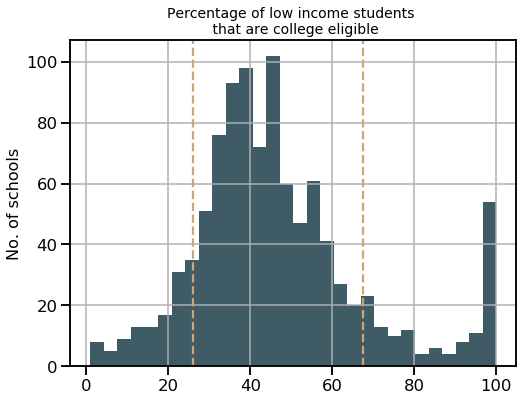

<IPython.core.display.Javascript object>

In [753]:
f, ax1 = plt.subplots(figsize=(8,6))
hist_plot(df_state_info_gs_census, "graduation_rates_UCCSU_eligibility_LIstudents", ax1)
ax1.set_ylabel("No. of schools", fontsize=16)
ax1.set_title("Percentage of low income students \n that are college eligible", fontsize=14);

target = df_state_info_gs_census["graduation_rates_UCCSU_eligibility_LIstudents"]
target_mean = target.mean()
target_sd = target.std()

# or top and bottom quantile

ax1.axvline(target_mean-target_sd, c=B_beige, linestyle="dashed")
ax1.axvline(target_mean+target_sd, c=B_beige, linestyle="dashed")

print("mean: ", target_mean)
print("mean +/- 1SD: ", target_mean - target_sd, target_mean + target_sd);


In [760]:
print(
    "No. of low performing schools: ",
    (
        df_state_info_gs_census["graduation_rates_UCCSU_eligibility_LIstudents"]
        < target_mean - target_sd
    ).sum(),
)

print(
    "No. of high performing schools: ",
    (
        df_state_info_gs_census["graduation_rates_UCCSU_eligibility_LIstudents"]
        > target_mean + target_sd
    ).sum(),
)

No. of low performing schools:  111
No. of high performing schools:  137


<IPython.core.display.Javascript object>

In [764]:
df_state_info_gs_census["LI_performance_status"] = "middle"

bool_low = df_state_info_gs_census["graduation_rates_UCCSU_eligibility_LIstudents"] < (
    target_mean - target_sd
)
df_state_info_gs_census.loc[bool_low, "LI_performance_status"] = "low"

bool_high = df_state_info_gs_census["graduation_rates_UCCSU_eligibility_LIstudents"] > (
    target_mean + target_sd
)
df_state_info_gs_census.loc[bool_high, "LI_performance_status"] = "high"

df_state_info_gs_census["LI_performance_status"].value_counts()

middle    904
high      137
low       111
Name: LI_performance_status, dtype: int64

<IPython.core.display.Javascript object>

In [771]:
feat_for_mw = all_features_filt_wcensuscheck[:-4]
feat_for_mw

['%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefits in the past 12 months',
 '%; INCOME_BENEFITS - w/ Social Security',
 '%; INCOME_BENEFITS - w/ Supplemental Security Income',
 'Est.; INCOME_BENEFITS - Total households - Median household income ($)',
 'Est.; INCOME_BENEFITS - w/ retirement income - Mean retirement income ($)',
 'Est.; INCOME_BENEFITS - w/ cash public assistance income - Mean cash public assistance income ($)',
 '%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage',
 '%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage - w/ public coverage',
 '%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. <18 yrs - No health ins coverage',
 '%; WORK_COMMUTE - Workers 16 yrs and up - Car, truck, or van -- drove alone',
 '%; WORK_COMMUTE - Workers 16 yrs and up - Car, truck, or van -- carpooled',
 '%; WORK_COMMUTE - Workers 16 yrs and up - Public transportation (excluding taxicab)',
 '%; WORK_COMMUTE - Workers

<IPython.core.display.Javascript object>

In [774]:
status2keep = ["low", "high"]

df_state_info_gs_census_forMW = df_state_info_gs_census.loc[
    df_state_info_gs_census["LI_performance_status"].isin(status2keep),
    feat_for_mw + ["LI_performance_status"],
].copy()

<IPython.core.display.Javascript object>

In [775]:
df_state_info_gs_census_forMW.head()

,%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefits in the past 12 months,%; INCOME_BENEFITS - w/ Social Security,%; INCOME_BENEFITS - w/ Supplemental Security Income,Est.; INCOME_BENEFITS - Total households - Median household income ($),Est.; INCOME_BENEFITS - w/ retirement income - Mean retirement income ($),Est.; INCOME_BENEFITS - w/ cash public assistance income - Mean cash public assistance income ($),%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage,%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage - w/ public coverage,%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. <18 yrs - No health ins coverage,"%; WORK_COMMUTE - Workers 16 yrs and up - Car, truck, or van -- drove alone",...,students_per_counselor,pct_teachers_3years_or_more,pct_teachers_who_r_certified,avg_teacher_salary,test_score_rating_LIstudents,test_score_rating_notLIstudents,test_scores_english_LIstudents,test_scores_math_LIstudents,test_scores_math_LIstudents_n_students,LI_performance_status
0,9.2,24.0,16.0,32993.0,29027.0,5055.0,82.2,41.3,4.7,30.5,...,343.0,31.0,100.0,56500.0,4.0,4.0,47.0,18.0,77.0,high
2,28.4,20.0,13.4,31903.0,19269.0,5347.0,80.2,48.5,6.7,59.4,...,147.0,82.0,67.0,41722.0,22.0,22.0,22.0,NaN,NaN,high
3,28.4,20.0,13.4,31903.0,19269.0,5347.0,80.2,48.5,6.7,59.4,...,NaN,64.0,90.0,51656.0,7.0,7.0,63.0,NaN,NaN,high
13,9.9,29.0,8.1,76773.0,20501.0,4077.0,90.3,29.4,2.9,77.2,...,188.0,75.0,96.0,62587.0,9.0,10.0,75.0,44.0,102.0,high
19,4.5,25.8,5.5,86757.0,20687.0,4531.0,90.4,29.6,4.0,77.0,...,444.0,87.0,93.0,105027.0,3.0,6.0,42.0,14.0,180.0,low


<IPython.core.display.Javascript object>

In [811]:
df_sig_features = pd.DataFrame()
df_sig_features["feature"] = None
df_sig_features["raw_pval"] = None


for i, feature in enumerate(feat_for_mw):
    mwu_pval_feature = run_mannwhitneyu(
        df_state_info_gs_census_forMW, feature, "LI_performance_status"
    )
    if mwu_pval_feature < 0.05:
        df_sig_features.loc[i, "feature"] = feature
        df_sig_features.loc[i, "raw_pval"] = mwu_pval_feature

df_sig_features = df_sig_features.sort_values(
    by="raw_pval", ascending=True
).reset_index()

bonferroni_reject, bonferroni_p_val_corrected = multitest.multipletests(
    df_sig_features["raw_pval"], alpha=0.05, method="bonferroni"
)[0:2]

df_sig_features["corr_p_val_rej"] = bonferroni_reject
df_sig_features["corr_p_val"] = bonferroni_p_val_corrected

<IPython.core.display.Javascript object>

In [831]:
df_sig_features.loc[df_sig_features["corr_p_val_rej"], ["feature", "corr_p_val"]]

,feature,corr_p_val
0,%; WORK_COMMUTE - Workers 16 yrs and up - Publ...,5.07987e-19
1,%; INDUSTRY - Civilian employed pop. 16 yrs an...,7.23522e-17
2,%; INCOME_BENEFITS - w/ Social Security,5.22535e-14
3,%; WORKER_CLASS - Civilian employed pop. 16 yr...,1.01559e-13
4,test_scores_english_LIstudents,4.72221e-13
5,Charter_cat_encoded,2.54253e-12
6,%; INDUSTRY - Civilian employed pop. 16 yrs an...,1.23895e-11
7,%; EMPLOY_STATUS - Pop. 16 yrs and up - Not in...,1.76531e-11
8,%; INDUSTRY - Civilian employed pop. 16 yrs an...,4.63625e-11
9,%; INDUSTRY - Civilian employed pop. 16 yrs an...,2.34242e-09


<IPython.core.display.Javascript object>

In [834]:
[print(i, feature) for i, feature in enumerate(df_sig_features["feature"])]

0 %; WORK_COMMUTE - Workers 16 yrs and up - Public transportation (excluding taxicab)
1 %; INDUSTRY - Civilian employed pop. 16 yrs and up - Professional, scientific, and management, and administrative and waste management services
2 %; INCOME_BENEFITS - w/ Social Security
3 %; WORKER_CLASS - Civilian employed pop. 16 yrs and up - Private wage and salary workers
4 test_scores_english_LIstudents
5 Charter_cat_encoded
6 %; INDUSTRY - Civilian employed pop. 16 yrs and up - Public administration
7 %; EMPLOY_STATUS - Pop. 16 yrs and up - Not in labor force
8 %; INDUSTRY - Civilian employed pop. 16 yrs and up - Information
9 %; INDUSTRY - Civilian employed pop. 16 yrs and up - Agriculture, forestry, fishing and hunting, and mining
10 test_scores_math_LIstudents
11 test_score_rating_LIstudents
12 %; EMPLOY_STATUS - Females 16 yrs and up - In labor force - Civilian labor force - Employed
13 %; WORK_COMMUTE - Workers 16 yrs and up - Car, truck, or van -- drove alone
14 %; HEALTH_INS_COVERAGE - 

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

<IPython.core.display.Javascript object>

### First pass of boxplots - by order of significance

%; WORK_COMMUTE - Workers 16 yrs and up - Public transportation (excluding taxicab)
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Professional, scientific, and management, and administrative and waste management services
%; INCOME_BENEFITS - w/ Social Security


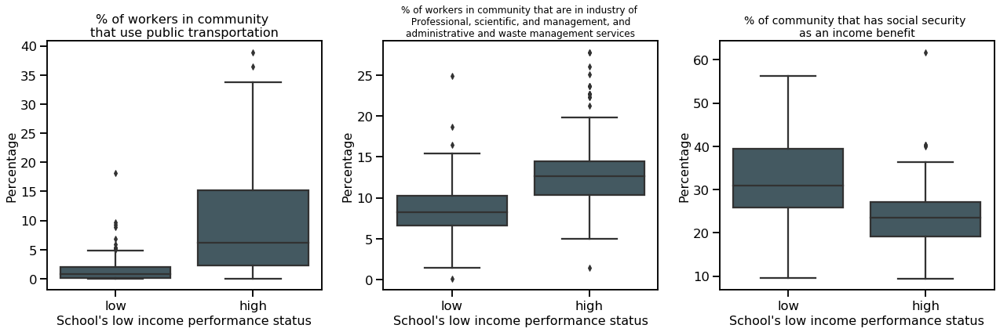

<IPython.core.display.Javascript object>

In [833]:
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 6))

feature_rank_to_plot = [0,1,2]

# First feature/boxplot
print(df_sig_features.loc[feature_rank_to_plot[0], "feature"])
sns.boxplot(
    data=df_state_info_gs_census_forMW,
    x="LI_performance_status",
    y=df_sig_features.loc[feature_rank_to_plot[0], "feature"],
    color=B_slate,
    order=["low", "high"],
    ax=ax1,
)

ax1.set_title("% of workers in community \nthat use public transportation", fontsize=16)
ax1.set_xlabel("School's low income performance status", fontsize=16)
ax1.set_ylabel("Percentage", fontsize=16)

# Second feature/boxplot
print(df_sig_features.loc[feature_rank_to_plot[1], "feature"])
sns.boxplot(
    data=df_state_info_gs_census_forMW,
    x="LI_performance_status",
    y=df_sig_features.loc[feature_rank_to_plot[1], "feature"],
    color=B_slate,
    order=["low", "high"],
    ax=ax2,
)

ax2.set_title("% of workers in community that are in industry of \n Professional, scientific, and management, and \nadministrative and waste management services", fontsize=12)
ax2.set_xlabel("School's low income performance status", fontsize=16)
ax2.set_ylabel("Percentage", fontsize=16)

# Third feature/boxplot
print(df_sig_features.loc[feature_rank_to_plot[2], "feature"])
sns.boxplot(
    data=df_state_info_gs_census_forMW,
    x="LI_performance_status",
    y=df_sig_features.loc[feature_rank_to_plot[2], "feature"],
    color=B_slate,
    order=["low", "high"],
    ax=ax3,
)

ax3.set_title("% of community that has social security \nas an income benefit", fontsize=14)
ax3.set_xlabel("School's low income performance status", fontsize=16)
ax3.set_ylabel("Percentage", fontsize=16)


plt.tight_layout();



%; WORKER_CLASS - Civilian employed pop. 16 yrs and up - Private wage and salary workers
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Public administration
%; EMPLOY_STATUS - Pop. 16 yrs and up - Not in labor force


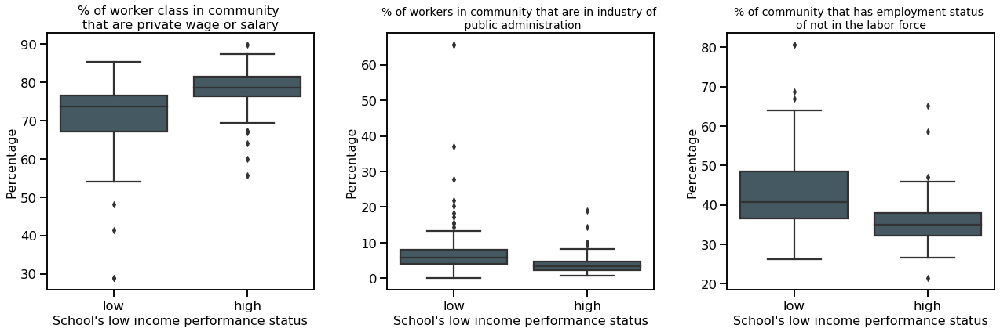

<IPython.core.display.Javascript object>

In [838]:
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 6))

feature_rank_to_plot = [3, 6, 7]

# First feature/boxplot
print(df_sig_features.loc[feature_rank_to_plot[0], "feature"])
sns.boxplot(
    data=df_state_info_gs_census_forMW,
    x="LI_performance_status",
    y=df_sig_features.loc[feature_rank_to_plot[0], "feature"],
    color=B_slate,
    order=["low", "high"],
    ax=ax1,
)

ax1.set_title(
    "% of worker class in community \nthat are private wage or salary", fontsize=16
)
ax1.set_xlabel("School's low income performance status", fontsize=16)
ax1.set_ylabel("Percentage", fontsize=16)

# Second feature/boxplot
print(df_sig_features.loc[feature_rank_to_plot[1], "feature"])
sns.boxplot(
    data=df_state_info_gs_census_forMW,
    x="LI_performance_status",
    y=df_sig_features.loc[feature_rank_to_plot[1], "feature"],
    color=B_slate,
    order=["low", "high"],
    ax=ax2,
)

ax2.set_title(
    "% of workers in community that are in industry of \n public administration",
    fontsize=14,
)
ax2.set_xlabel("School's low income performance status", fontsize=16)
ax2.set_ylabel("Percentage", fontsize=16)

# Third feature/boxplot
print(df_sig_features.loc[feature_rank_to_plot[2], "feature"])
sns.boxplot(
    data=df_state_info_gs_census_forMW,
    x="LI_performance_status",
    y=df_sig_features.loc[feature_rank_to_plot[2], "feature"],
    color=B_slate,
    order=["low", "high"],
    ax=ax3,
)

ax3.set_title(
    "% of community that has employment status \nof not in the labor force", fontsize=14
)
ax3.set_xlabel("School's low income performance status", fontsize=16)
ax3.set_ylabel("Percentage", fontsize=16)

plt.tight_layout()

%; INDUSTRY - Civilian employed pop. 16 yrs and up - Information
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Agriculture, forestry, fishing and hunting, and mining
%; EMPLOY_STATUS - Females 16 yrs and up - In labor force - Civilian labor force - Employed


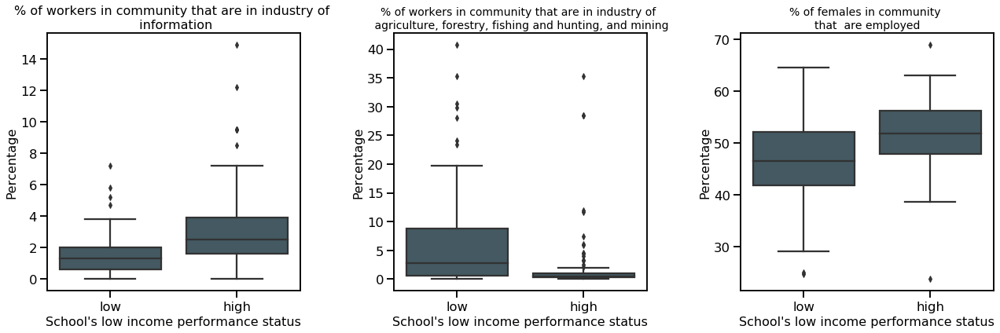

<IPython.core.display.Javascript object>

In [840]:
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 6))

feature_rank_to_plot = [8, 9, 12]

# First feature/boxplot
print(df_sig_features.loc[feature_rank_to_plot[0], "feature"])
sns.boxplot(
    data=df_state_info_gs_census_forMW,
    x="LI_performance_status",
    y=df_sig_features.loc[feature_rank_to_plot[0], "feature"],
    color=B_slate,
    order=["low", "high"],
    ax=ax1,
)

ax1.set_title(
    "% of workers in community that are in industry of \n information", fontsize=16
)
ax1.set_xlabel("School's low income performance status", fontsize=16)
ax1.set_ylabel("Percentage", fontsize=16)

# Second feature/boxplot
print(df_sig_features.loc[feature_rank_to_plot[1], "feature"])
sns.boxplot(
    data=df_state_info_gs_census_forMW,
    x="LI_performance_status",
    y=df_sig_features.loc[feature_rank_to_plot[1], "feature"],
    color=B_slate,
    order=["low", "high"],
    ax=ax2,
)

ax2.set_title(
    "% of workers in community that are in industry of \n agriculture, forestry, fishing and hunting, and mining",
    fontsize=14,
)
ax2.set_xlabel("School's low income performance status", fontsize=16)
ax2.set_ylabel("Percentage", fontsize=16)

# Third feature/boxplot
print(df_sig_features.loc[feature_rank_to_plot[2], "feature"])
sns.boxplot(
    data=df_state_info_gs_census_forMW,
    x="LI_performance_status",
    y=df_sig_features.loc[feature_rank_to_plot[2], "feature"],
    color=B_slate,
    order=["low", "high"],
    ax=ax3,
)

ax3.set_title("% of females in community \nthat  are employed", fontsize=14)
ax3.set_xlabel("School's low income performance status", fontsize=16)
ax3.set_ylabel("Percentage", fontsize=16)

plt.tight_layout()

%; WORK_COMMUTE - Workers 16 yrs and up - Car, truck, or van -- drove alone
%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage - w/ public coverage
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Manufacturing


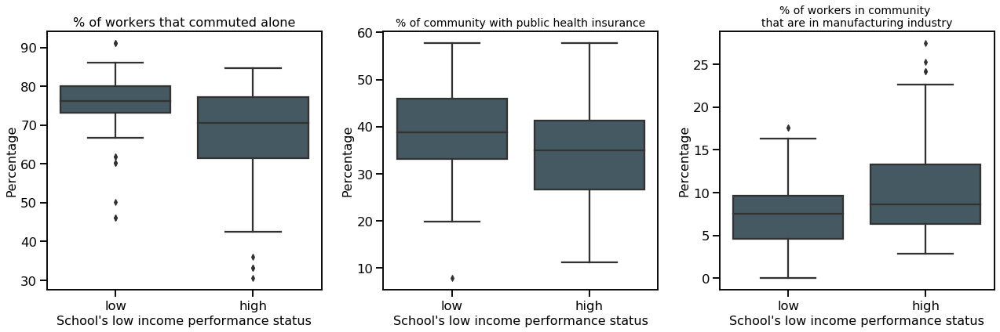

<IPython.core.display.Javascript object>

In [842]:
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 6))

feature_rank_to_plot = [13, 14, 15]

# First feature/boxplot
print(df_sig_features.loc[feature_rank_to_plot[0], "feature"])
sns.boxplot(
    data=df_state_info_gs_census_forMW,
    x="LI_performance_status",
    y=df_sig_features.loc[feature_rank_to_plot[0], "feature"],
    color=B_slate,
    order=["low", "high"],
    ax=ax1,
)

ax1.set_title("% of workers that commuted alone", fontsize=16)
ax1.set_xlabel("School's low income performance status", fontsize=16)
ax1.set_ylabel("Percentage", fontsize=16)

# Second feature/boxplot
print(df_sig_features.loc[feature_rank_to_plot[1], "feature"])
sns.boxplot(
    data=df_state_info_gs_census_forMW,
    x="LI_performance_status",
    y=df_sig_features.loc[feature_rank_to_plot[1], "feature"],
    color=B_slate,
    order=["low", "high"],
    ax=ax2,
)

ax2.set_title(
    "% of community with public health insurance", fontsize=14,
)
ax2.set_xlabel("School's low income performance status", fontsize=16)
ax2.set_ylabel("Percentage", fontsize=16)

# Third feature/boxplot
print(df_sig_features.loc[feature_rank_to_plot[2], "feature"])
sns.boxplot(
    data=df_state_info_gs_census_forMW,
    x="LI_performance_status",
    y=df_sig_features.loc[feature_rank_to_plot[2], "feature"],
    color=B_slate,
    order=["low", "high"],
    ax=ax3,
)

ax3.set_title(
    "% of workers in community \nthat are in manufacturing industry", fontsize=14
)
ax3.set_xlabel("School's low income performance status", fontsize=16)
ax3.set_ylabel("Percentage", fontsize=16)

plt.tight_layout()

### Second pass of boxplots - by category

%; INDUSTRY - Civilian employed pop. 16 yrs and up - Professional, scientific, and management, and administrative and waste management services
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Information
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Manufacturing


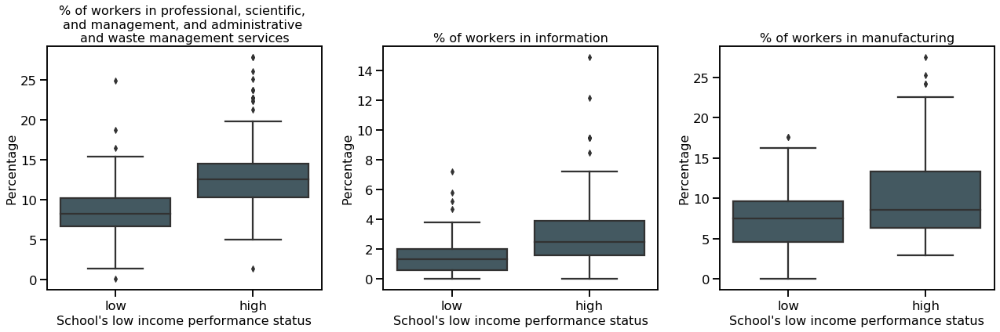

<IPython.core.display.Javascript object>

In [851]:
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 6))

feature_rank_to_plot = [1,8,15]

# First feature/boxplot
print(df_sig_features.loc[feature_rank_to_plot[0], "feature"])
sns.boxplot(
    data=df_state_info_gs_census_forMW,
    x="LI_performance_status",
    y=df_sig_features.loc[feature_rank_to_plot[0], "feature"],
    color=B_slate,
    order=["low", "high"],
    ax=ax1,
)

ax1.set_title("% of workers in professional, scientific, \nand management, and administrative \nand waste management services", fontsize=16)
ax1.set_xlabel("School's low income performance status", fontsize=16)
ax1.set_ylabel("Percentage", fontsize=16)

# Second feature/boxplot
print(df_sig_features.loc[feature_rank_to_plot[1], "feature"])
sns.boxplot(
    data=df_state_info_gs_census_forMW,
    x="LI_performance_status",
    y=df_sig_features.loc[feature_rank_to_plot[1], "feature"],
    color=B_slate,
    order=["low", "high"],
    ax=ax2,
)

ax2.set_title("% of workers in information", fontsize=16)
ax2.set_xlabel("School's low income performance status", fontsize=16)
ax2.set_ylabel("Percentage", fontsize=16)

# Third feature/boxplot
print(df_sig_features.loc[feature_rank_to_plot[2], "feature"])
sns.boxplot(
    data=df_state_info_gs_census_forMW,
    x="LI_performance_status",
    y=df_sig_features.loc[feature_rank_to_plot[2], "feature"],
    color=B_slate,
    order=["low", "high"],
    ax=ax3,
)

ax3.set_title("% of workers in manufacturing", fontsize=16)
ax3.set_xlabel("School's low income performance status", fontsize=16)
ax3.set_ylabel("Percentage", fontsize=16)

plt.tight_layout();


%; INDUSTRY - Civilian employed pop. 16 yrs and up - Public administration
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Agriculture, forestry, fishing and hunting, and mining


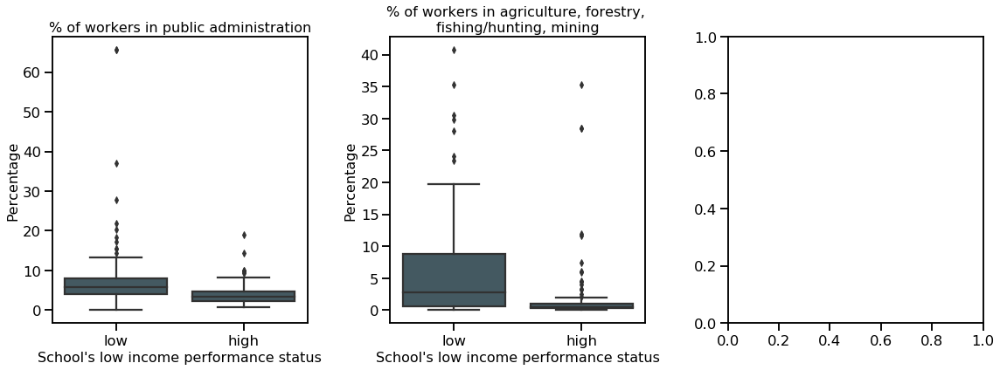

<IPython.core.display.Javascript object>

In [858]:
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(16, 6))

feature_rank_to_plot = [6,9]

# First feature/boxplot
print(df_sig_features.loc[feature_rank_to_plot[0], "feature"])
sns.boxplot(
    data=df_state_info_gs_census_forMW,
    x="LI_performance_status",
    y=df_sig_features.loc[feature_rank_to_plot[0], "feature"],
    color=B_slate,
    order=["low", "high"],
    ax=ax1,
)

ax1.set_title("% of workers in public administration", fontsize=16)
ax1.set_xlabel("School's low income performance status", fontsize=16)
ax1.set_ylabel("Percentage", fontsize=16)

# Second feature/boxplot
print(df_sig_features.loc[feature_rank_to_plot[1], "feature"])
sns.boxplot(
    data=df_state_info_gs_census_forMW,
    x="LI_performance_status",
    y=df_sig_features.loc[feature_rank_to_plot[1], "feature"],
    color=B_slate,
    order=["low", "high"],
    ax=ax2,
)

ax2.set_title("% of workers in agriculture, forestry, \nfishing/hunting, mining", fontsize=16)
ax2.set_xlabel("School's low income performance status", fontsize=16)
ax2.set_ylabel("Percentage", fontsize=16)

plt.tight_layout();



%; EMPLOY_STATUS - Pop. 16 yrs and up - Not in labor force
%; EMPLOY_STATUS - Females 16 yrs and up - In labor force - Civilian labor force - Employed


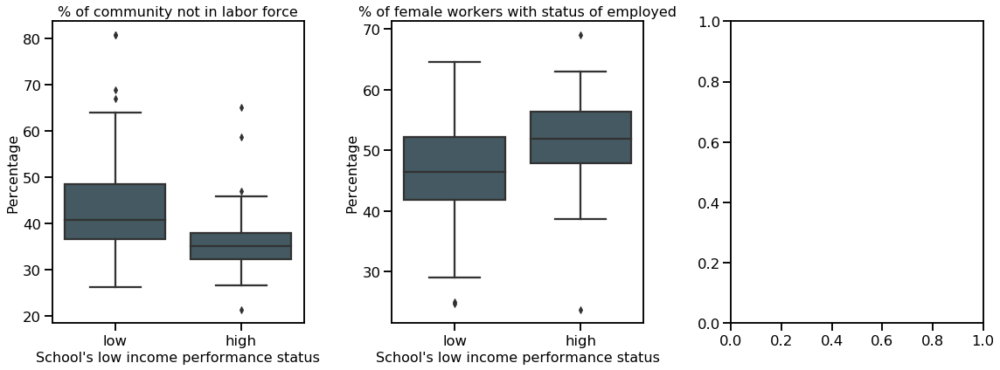

<IPython.core.display.Javascript object>

In [856]:
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(16, 6))

feature_rank_to_plot = [7,12]

# First feature/boxplot
print(df_sig_features.loc[feature_rank_to_plot[0], "feature"])
sns.boxplot(
    data=df_state_info_gs_census_forMW,
    x="LI_performance_status",
    y=df_sig_features.loc[feature_rank_to_plot[0], "feature"],
    color=B_slate,
    order=["low", "high"],
    ax=ax1,
)

ax1.set_title("% of community not in labor force", fontsize=16)
ax1.set_xlabel("School's low income performance status", fontsize=16)
ax1.set_ylabel("Percentage", fontsize=16)

# Second feature/boxplot
print(df_sig_features.loc[feature_rank_to_plot[1], "feature"])
sns.boxplot(
    data=df_state_info_gs_census_forMW,
    x="LI_performance_status",
    y=df_sig_features.loc[feature_rank_to_plot[1], "feature"],
    color=B_slate,
    order=["low", "high"],
    ax=ax2,
)

ax2.set_title("% of female workers with status of employed", fontsize=16)
ax2.set_xlabel("School's low income performance status", fontsize=16)
ax2.set_ylabel("Percentage", fontsize=16)

plt.tight_layout();


%; WORK_COMMUTE - Workers 16 yrs and up - Public transportation (excluding taxicab)
%; WORK_COMMUTE - Workers 16 yrs and up - Car, truck, or van -- drove alone


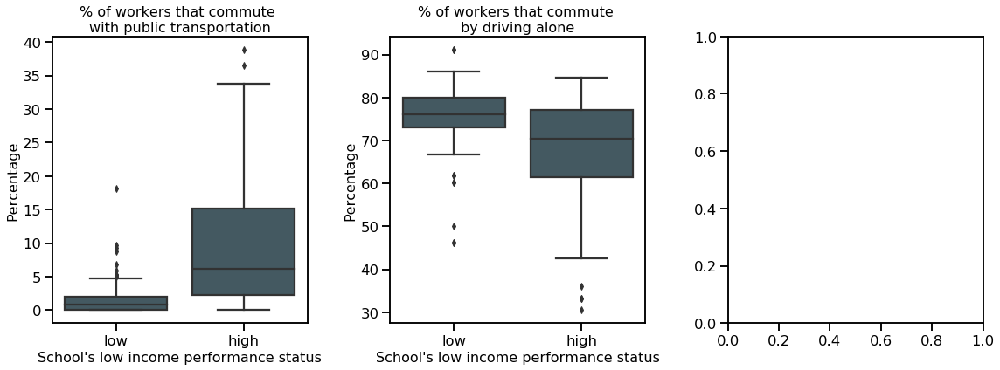

<IPython.core.display.Javascript object>

In [855]:
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(16, 6))

feature_rank_to_plot = [0,13]

# First feature/boxplot
print(df_sig_features.loc[feature_rank_to_plot[0], "feature"])
sns.boxplot(
    data=df_state_info_gs_census_forMW,
    x="LI_performance_status",
    y=df_sig_features.loc[feature_rank_to_plot[0], "feature"],
    color=B_slate,
    order=["low", "high"],
    ax=ax1,
)

ax1.set_title("% of workers that commute \nwith public transportation", fontsize=16)
ax1.set_xlabel("School's low incomae performance status", fontsize=16)
ax1.set_ylabel("Percentage", fontsize=16)

# Second feature/boxplot
print(df_sig_features.loc[feature_rank_to_plot[1], "feature"])
sns.boxplot(
    data=df_state_info_gs_census_forMW,
    x="LI_performance_status",
    y=df_sig_features.loc[feature_rank_to_plot[1], "feature"],
    color=B_slate,
    order=["low", "high"],
    ax=ax2,
)

ax2.set_title("% of workers that commute \nby driving alone", fontsize=16)
ax2.set_xlabel("School's low income performance status", fontsize=16)
ax2.set_ylabel("Percentage", fontsize=16)

plt.tight_layout();


%; INCOME_BENEFITS - w/ Social Security
%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage - w/ public coverage


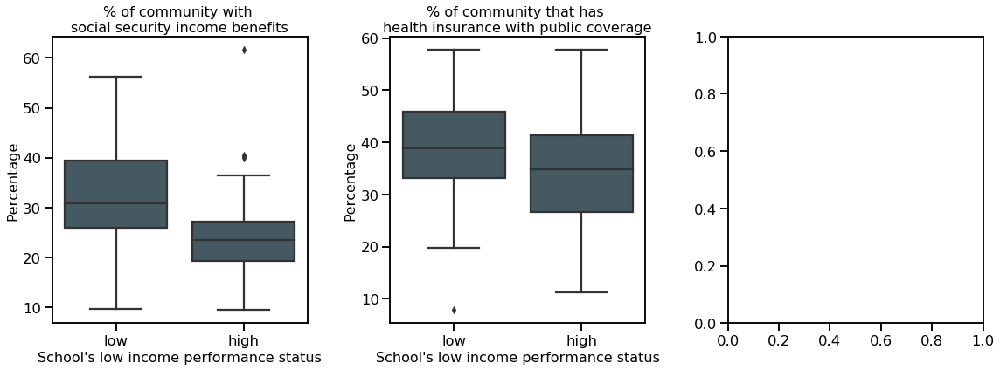

<IPython.core.display.Javascript object>

In [861]:
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(16, 6))

feature_rank_to_plot = [2,14]

# First feature/boxplot
print(df_sig_features.loc[feature_rank_to_plot[0], "feature"])
sns.boxplot(
    data=df_state_info_gs_census_forMW,
    x="LI_performance_status",
    y=df_sig_features.loc[feature_rank_to_plot[0], "feature"],
    color=B_slate,
    order=["low", "high"],
    ax=ax1,
)

ax1.set_title("% of community with \nsocial security income benefits", fontsize=16)
ax1.set_xlabel("School's low income performance status", fontsize=16)
ax1.set_ylabel("Percentage", fontsize=16)

# Second feature/boxplot
print(df_sig_features.loc[feature_rank_to_plot[1], "feature"])
sns.boxplot(
    data=df_state_info_gs_census_forMW,
    x="LI_performance_status",
    y=df_sig_features.loc[feature_rank_to_plot[1], "feature"],
    color=B_slate,
    order=["low", "high"],
    ax=ax2,
)

ax2.set_title("% of community that has \nhealth insurance with public coverage", fontsize=16)
ax2.set_xlabel("School's low income performance status", fontsize=16)
ax2.set_ylabel("Percentage", fontsize=16)

plt.tight_layout();



## Conclusion and summary

This project identified features that are associated with low income student success. Some features have varying degrees of "actionability": some can be affected directly by policy changes, while others could be indirectly related.

For example, it is clear that schools where all students perform well (by college eligibility rates) is a significantly good predictor in how well their low income students are also doing. Superficially, it is not completely surprising, but it highlights how the right environment benefits all demographics of students.

Other features are not as influential but indicate that some public programs reap benefits. Communities where low income students do well receive some welfare benefits (in the form of supplemental and social security income) and have workers that use public transportation. Therefore policies that adversely affect the recipients of these programs might indirectly be detrimental to the school performance of their children or grandchildren.

It is also notable what features did *not* show benefits for low income student performance. While teacher salary was positively correlated with student performance, student-to-teacher ratio or whether teachers had 3 or more years of experience were not features that predicted whether a school was exceptionally performing. The magnet or charter status of a school were also not predictive features despite their perception. Of course, adding data from other states or evaluating schools longitudinally would help inform how robust these conclusions are.

New data would also be informative. For example, recently (October 2019) the state of [California will start mandating later high school start times](https://www.washingtonpost.com/opinions/students-need-more-sleep-good-for-california-for-giving-them-a-later-school-start/2019/10/18/f5dfc0d2-f047-11e9-8693-f487e46784aa_story.html). While the sleep benefits to students are clear, it is debatable whether this could disproportionately affect low income communities.

Other interesting data would be seeing whether and how much tech usage could be impactful. Do the schools encourage teachers and students to reference Khan Academy as lesson supplements? Or do they use Remind to facilitate communication?